In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import os, zipfile

zip_path = "/content/drive/MyDrive/microbial_dataset2/7670637.zip"  # <-- EDIT THIS
extract_root = "/content/STRAck"  # local path in Colab

os.makedirs(extract_root, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zf:
    zf.extractall(extract_root)

print("Extracted to:", extract_root)


Extracted to: /content/STRAck


In [6]:
import os, zipfile

zip_path = "/content/drive/MyDrive/STRAck_models/temporal_unet_strack.pth"  # <-- EDIT THIS
extract_root = "/content/STRAck/models"  # local path in Colab

os.makedirs(extract_root, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zf:
    zf.extractall(extract_root)

print("Extracted to:", extract_root)

Extracted to: /content/STRAck/models


In [3]:
import os

def print_tree(root, max_depth=3, prefix=""):
    root = os.path.abspath(root)
    for dirpath, dirnames, filenames in os.walk(root):
        rel = os.path.relpath(dirpath, root)
        depth = rel.count(os.sep)
        if depth >= max_depth:
            dirnames[:] = []  # stop deeper walk
            continue
        indent = "    " * depth
        print(f"{indent}{os.path.basename(dirpath)}/")
        for f in sorted(filenames[:5]):  # print first 5 files per folder
            print(f"{indent}    {f}")
    print("---- end of tree ----")

print_tree(extract_root, max_depth=3)


STRAck/
    Lysobacter.zip
    Pputida.zip
    Pveronii.zip
    Rahnella.zip
---- end of tree ----


In [4]:
import os

# 🔴 CHANGE THIS to wherever you actually have STRack in Drive
DRIVE_STRACK_DIR = "/content/STRAck"

print("Contents of DRIVE_STRACK_DIR:")
print(os.listdir(DRIVE_STRACK_DIR))


Contents of DRIVE_STRACK_DIR:
['Rahnella.zip', 'Lysobacter.zip', 'Pputida.zip', 'Pveronii.zip']


In [5]:
import zipfile

LOCAL_STRACK_ROOT = "/content/STRAck"
os.makedirs(LOCAL_STRACK_ROOT, exist_ok=True)

species_zips = ["Lysobacter.zip", "Pputida.zip", "Pveronii.zip", "Rahnella.zip"]

for zname in species_zips:
    zip_path = os.path.join(DRIVE_STRACK_DIR, zname)
    target_dir = os.path.join(LOCAL_STRACK_ROOT, os.path.splitext(zname)[0])
    os.makedirs(target_dir, exist_ok=True)
    print(f"Unzipping {zip_path} -> {target_dir}")
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(target_dir)

print("Done unzipping.")
print("Species folders:", os.listdir(LOCAL_STRACK_ROOT))


Unzipping /content/STRAck/Lysobacter.zip -> /content/STRAck/Lysobacter
Unzipping /content/STRAck/Pputida.zip -> /content/STRAck/Pputida
Unzipping /content/STRAck/Pveronii.zip -> /content/STRAck/Pveronii
Unzipping /content/STRAck/Rahnella.zip -> /content/STRAck/Rahnella
Done unzipping.
Species folders: ['Rahnella.zip', 'Lysobacter.zip', 'Lysobacter', 'Pveronii', 'Rahnella', 'Pputida.zip', 'Pveronii.zip', 'Pputida']


In [6]:
import os

def print_tree(root, max_depth=3):
    root = os.path.abspath(root)
    for dirpath, dirnames, filenames in os.walk(root):
        rel = os.path.relpath(dirpath, root)
        depth = rel.count(os.sep)
        if depth >= max_depth:
            dirnames[:] = []  # stop going deeper
            continue
        indent = "    " * depth
        print(f"{indent}{os.path.basename(dirpath)}/")
        for f in sorted(filenames[:5]):  # only show first 5 files
            print(f"{indent}    {f}")
    print("---- end of tree ----")

for species in ["Lysobacter", "Pputida", "Pveronii", "Rahnella"]:
    print(f"\n=== {species} ===")
    print_tree(os.path.join(LOCAL_STRACK_ROOT, species), max_depth=3)



=== Lysobacter ===
Lysobacter/
Lysobacter/
    .DS_Store
    Time-lapse_dataset3/
        .DS_Store
        raw_images/
            BF_position6_time0005.tif
            BF_position6_time0007.tif
            BF_position6_time0012.tif
            BF_position6_time0013.tif
            BF_position6_time0016.tif
        manual_segmentation_masks/
            mask_position6_time0001.tif
            mask_position6_time0004.tif
            mask_position6_time0008.tif
            mask_position6_time0009.tif
            mask_position6_time0010.tif
    Time-lapse_dataset5/
        .DS_Store
        raw_images/
            BF_position11_time0004.tif
            BF_position11_time0009.tif
            BF_position11_time0013.tif
            BF_position11_time0015.tif
            BF_position11_time0016.tif
        manual_segmentation_masks/
            mask_position11_time0005.tif
            mask_position11_time0010.tif
            mask_position11_time0012.tif
            mask_position11_time0013.t

In [7]:
LOCAL_STRACK_ROOT = "/content/STRAck"


In [28]:
import os, re, glob, random
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import cv2
import matplotlib.pyplot as plt

from skimage.segmentation import find_boundaries
from scipy.ndimage import binary_dilation
from skimage.measure import label as cc_label
from scipy.optimize import linear_sum_assignment


In [39]:
def compute_flow_pair(img_from, img_to):
    """
    img_from, img_to: np.ndarray [H,W] in [0,1]
    returns flow: [H,W,2] float32
    """
    img_from_u8 = (img_from * 255).astype(np.uint8)
    img_to_u8   = (img_to * 255).astype(np.uint8)

    flow = cv2.calcOpticalFlowFarneback(
        img_from_u8, img_to_u8,
        None,
        pyr_scale=0.5, levels=3, winsize=15,
        iterations=3, poly_n=5, poly_sigma=1.2, flags=0
    )
    return flow.astype(np.float32)


STRack temporal + flow Dataset (V3, clean)

optical flow helper


In [37]:
class STRackTemporalFlowDataset(Dataset):
    def __init__(self, root_dir, species_list=None, window_size=5):
        """
        root_dir: /content/STRAck
        species_list: list of species folder names (or None -> all)
        window_size: odd, e.g. 5
        """
        assert window_size % 2 == 1
        self.root_dir = root_dir
        self.window_size = window_size
        self.half_w = window_size // 2

        self.img_re  = re.compile(r"BF_position(\d+)_time(\d+)\.tif$")
        self.mask_re = re.compile(r"mask_position(\d+)_time(\d+)\.tif$")

        if species_list is None:
            species_list = [
                d for d in os.listdir(root_dir)
                if os.path.isdir(os.path.join(root_dir, d))
                and not d.startswith('.') and not d.startswith('__')
            ]
        self.species_list = sorted(species_list)
        print("Using species:", self.species_list)

        self.sequences = []   # list of seq dicts
        self.index = []       # list of (seq_id, center_idx)

        self._build_sequences()
        self._build_index()

        print(f"Total sequences: {len(self.sequences)}")
        print(f"Total usable (center) frames with window={window_size}: {len(self.index)}")

    # ---------- helpers ----------

    def _find_species_base(self, species):
        base1 = os.path.join(self.root_dir, species, species)
        base2 = os.path.join(self.root_dir, species)
        if os.path.isdir(base1):
            return base1
        if os.path.isdir(base2):
            return base2
        raise RuntimeError(f"Could not find base dir for {species}")

    def _build_sequences(self):
        for sp in self.species_list:
            sp_base = self._find_species_base(sp)
            dataset_dirs = [
                d for d in os.listdir(sp_base)
                if os.path.isdir(os.path.join(sp_base, d))
                and d.startswith("Time-lapse_dataset")
            ]
            dataset_dirs = sorted(dataset_dirs)

            for dname in dataset_dirs:
                dpath = os.path.join(sp_base, dname)
                raw_dir  = os.path.join(dpath, "raw_images")
                mask_dir = os.path.join(dpath, "manual_segmentation_masks")
                if not os.path.isdir(raw_dir) or not os.path.isdir(mask_dir):
                    continue

                img_files = sorted([
                    f for f in os.listdir(raw_dir)
                    if f.endswith(".tif") and not f.startswith("._")
                ])
                mask_files = sorted([
                    f for f in os.listdir(mask_dir)
                    if f.endswith(".tif") and not f.startswith("._")
                ])

                img_groups = {}   # pos -> [(time, path), ...]
                for f in img_files:
                    m = self.img_re.search(f)
                    if m is None:
                        continue
                    pos = int(m.group(1))
                    t   = int(m.group(2))
                    img_groups.setdefault(pos, []).append((t, os.path.join(raw_dir, f)))

                mask_map = {}     # (pos, time) -> path
                for f in mask_files:
                    m = self.mask_re.search(f)
                    if m is None:
                        continue
                    pos = int(m.group(1))
                    t   = int(m.group(2))
                    mask_map[(pos, t)] = os.path.join(mask_dir, f)

                # build per-position sequences
                for pos, time_img_list in img_groups.items():
                    time_img_list = sorted(time_img_list, key=lambda x: x[0])  # by time

                    # map time -> mask if exists
                    time_to_mask = {}
                    for (t, _) in time_img_list:
                        if (pos, t) in mask_map:
                            time_to_mask[t] = mask_map[(pos, t)]

                    if len(time_to_mask) == 0:
                        continue  # nothing labeled here

                    frames = [{"time": t, "img_path": p} for (t, p) in time_img_list]

                    seq = {
                        "species": sp,
                        "dataset": dname,
                        "position": pos,
                        "frames": frames,
                        "time_to_mask": time_to_mask
                    }
                    self.sequences.append(seq)

    def _build_index(self):
        # center frame index must:
        # - have mask (time in time_to_mask)
        # - have enough neighbors on both sides
        for seq_id, seq in enumerate(self.sequences):
            frames = seq["frames"]
            T = len(frames)
            for i in range(self.half_w, T - self.half_w):
                t = frames[i]["time"]
                if t in seq["time_to_mask"]:
                    self.index.append((seq_id, i))

    # ---------- Dataset API ----------

    def __len__(self):
        return len(self.index)

    def __getitem__(self, idx):
        seq_id, center_idx = self.index[idx]
        seq = self.sequences[seq_id]
        frames = seq["frames"]
        time_to_mask = seq["time_to_mask"]

        # temporal window
        start = center_idx - self.half_w
        end   = center_idx + self.half_w + 1
        window_frames = frames[start:end]

        # 1) load & normalize images
        imgs = []
        for fr in window_frames:
            img = Image.open(fr["img_path"])
            arr = np.array(img, dtype=np.float32)   # uint16 -> float
            # per-frame min-max normalization
            min_val = arr.min()
            arr = arr - min_val
            max_val = arr.max()
            if max_val > 0:
                arr = arr / max_val
            imgs.append(arr)

        imgs = np.stack(imgs, axis=0)  # [T,H,W]
        T, H, W = imgs.shape
        c_idx = self.half_w

        # 2) optical flows from neighbors -> center
        flow_chs = []
        for t_idx in range(T):
            if t_idx == c_idx:
                continue
            flow = compute_flow_pair(imgs[t_idx], imgs[c_idx])  # [H,W,2]
            flow = np.transpose(flow, (2,0,1))                  # [2,H,W]
            flow_chs.append(flow)
        flow_chs = np.concatenate(flow_chs, axis=0)  # [2*(T-1),H,W]

        stacked = np.concatenate([imgs, flow_chs], axis=0).astype(np.float32)  # [C,H,W]

        # 3) load center mask (same time as center frame)
        center_time = frames[center_idx]["time"]
        mask_path = time_to_mask[center_time]
        mask_img = Image.open(mask_path)
        mask_arr = np.array(mask_img, dtype=np.float32)
        mask = (mask_arr > 0).astype(np.float32)  # [H,W]

        input_t = torch.from_numpy(stacked)           # [C,H,W]
        mask_t  = torch.from_numpy(mask).unsqueeze(0) # [1,H,W]

        meta = {
            "species": seq["species"],
            "dataset": seq["dataset"],
            "position": seq["position"],
            "time": int(center_time)
        }

        return {
            "input": input_t,
            "mask": mask_t,
            "meta": meta
        }


In [41]:
ds = STRackTemporalFlowDataset(
    root_dir=LOCAL_STRACK_ROOT,
    species_list=["Lysobacter", "Pputida", "Pveronii", "Rahnella"],
    window_size=5
)

print("Dataset length:", len(ds))
sample = ds[0]
print("Input shape:", sample["input"].shape)
print("Mask shape:", sample["mask"].shape)
print("Meta:", sample["meta"])
for ch in range(5):
    cf = sample["input"][ch].numpy()
    print(f"Frame channel {ch}: min={cf.min():.3f}, max={cf.max():.3f}")


Using species: ['Lysobacter', 'Pputida', 'Pveronii', 'Rahnella']
Total sequences: 20
Total usable (center) frames with window=5: 240
Dataset length: 240
Input shape: torch.Size([13, 512, 512])
Mask shape: torch.Size([1, 512, 512])
Meta: {'species': 'Lysobacter', 'dataset': 'Time-lapse_dataset1', 'position': 0, 'time': 3}
Frame channel 0: min=0.000, max=1.000
Frame channel 1: min=0.000, max=1.000
Frame channel 2: min=0.000, max=1.000
Frame channel 3: min=0.000, max=1.000
Frame channel 4: min=0.000, max=1.000


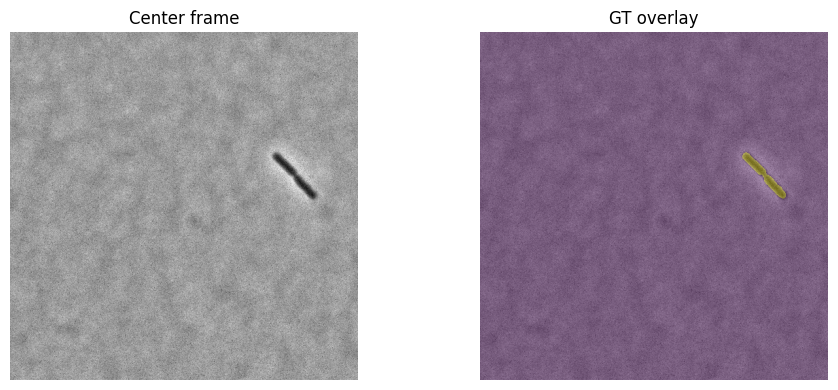

In [42]:
center_frame = sample["input"][2].numpy()
gt_mask = sample["mask"][0].numpy()

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.title("Center frame")
plt.imshow(center_frame, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("GT overlay")
plt.imshow(center_frame, cmap='gray')
plt.imshow(gt_mask, alpha=0.4)
plt.axis('off')
plt.tight_layout()
plt.show()


Model: Temporal-attention U-Net + Flow

In [29]:
class TemporalSE(nn.Module):
    def __init__(self, T, reduction=2):
        super().__init__()
        hidden = max(1, T // reduction)
        self.fc1 = nn.Linear(T, hidden)
        self.fc2 = nn.Linear(hidden, T)

    def forward(self, x):
        # x: [B,T,H,W]
        B, T, H, W = x.shape
        z = x.mean(dim=[2,3])        # [B,T]
        z = F.relu(self.fc1(z))      # [B,Hid]
        z = torch.sigmoid(self.fc2(z))  # [B,T]
        z = z.view(B,T,1,1)
        return x * z

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv(x)

class UNetTemporalFlow(nn.Module):
    def __init__(self, in_channels=13, window_size=5, num_classes=1, base_ch=32):
        super().__init__()
        assert window_size <= in_channels
        self.window_size = window_size
        self.frame_ch = window_size
        self.flow_ch = in_channels - window_size

        self.temporal_se = TemporalSE(T=self.frame_ch)
        ch = base_ch

        # Encoder
        self.enc1 = ConvBlock(in_channels, ch)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = ConvBlock(ch, ch*2)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = ConvBlock(ch*2, ch*4)
        self.pool3 = nn.MaxPool2d(2)

        self.enc4 = ConvBlock(ch*4, ch*8)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = ConvBlock(ch*8, ch*16)

        # Decoder
        self.up4 = nn.ConvTranspose2d(ch*16, ch*8, 2, 2)
        self.dec4 = ConvBlock(ch*16, ch*8)

        self.up3 = nn.ConvTranspose2d(ch*8, ch*4, 2, 2)
        self.dec3 = ConvBlock(ch*8, ch*4)

        self.up2 = nn.ConvTranspose2d(ch*4, ch*2, 2, 2)
        self.dec2 = ConvBlock(ch*4, ch*2)

        self.up1 = nn.ConvTranspose2d(ch*2, ch, 2, 2)
        self.dec1 = ConvBlock(ch*2, ch)

        self.out_conv = nn.Conv2d(ch, num_classes, 1)

    def forward(self, x):
        # x: [B,C,H,W], C=frames+flows
        B, C, H, W = x.shape
        x_frames = x[:, :self.frame_ch]          # [B,5,H,W]
        x_flows  = x[:, self.frame_ch:]         # [B,8,H,W]

        x_frames = self.temporal_se(x_frames)   # temporal attention
        x0 = torch.cat([x_frames, x_flows], dim=1)

        e1 = self.enc1(x0)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        e4 = self.enc4(p3)
        p4 = self.pool4(e4)

        b = self.bottleneck(p4)

        d4 = self.up4(b)
        if d4.shape[-2:] != e4.shape[-2:]:
            d4 = F.interpolate(d4, size=e4.shape[-2:], mode="bilinear", align_corners=False)
        d4 = self.dec4(torch.cat([d4, e4], dim=1))

        d3 = self.up3(d4)
        if d3.shape[-2:] != e3.shape[-2:]:
            d3 = F.interpolate(d3, size=e3.shape[-2:], mode="bilinear", align_corners=False)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))

        d2 = self.up2(d3)
        if d2.shape[-2:] != e2.shape[-2:]:
            d2 = F.interpolate(d2, size=e2.shape[-2:], mode="bilinear", align_corners=False)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))

        d1 = self.up1(d2)
        if d1.shape[-2:] != e1.shape[-2:]:
            d1 = F.interpolate(d1, size=e1.shape[-2:], mode="bilinear", align_corners=False)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        out = self.out_conv(d1)  # [B,1,H,W]
        return out


4. Losses + patch cropping (foreground-focused)

In [32]:
def dice_loss_from_logits(logits, targets, eps=1e-6):
    probs = torch.sigmoid(logits)
    num = 2 * (probs * targets).sum(dim=(2,3))
    den = probs.sum(dim=(2,3)) + targets.sum(dim=(2,3)) + eps
    dice = 1 - num/den
    return dice.mean()

def bce_dice_loss(logits, targets):
    bce = F.binary_cross_entropy_with_logits(logits, targets)
    d   = dice_loss_from_logits(logits, targets)
    return bce + d

def random_fg_crops(x, y, crop_size=256):
    """
    x: [B,C,H,W], y: [B,1,H,W]
    returns cropped x,y of shape [B,C,crop_size,crop_size]
    biased so crop is around a foreground pixel when possible.
    """
    B, C, H, W = x.shape
    cs = crop_size
    assert cs <= H and cs <= W

    x_out = torch.zeros((B,C,cs,cs), device=x.device, dtype=x.dtype)
    y_out = torch.zeros((B,1,cs,cs), device=y.device, dtype=y.dtype)

    for i in range(B):
        yi = y[i,0]
        fg_coords = torch.nonzero(yi > 0, as_tuple=False)
        if fg_coords.numel() > 0:
            idx = random.randint(0, fg_coords.size(0)-1)
            cy, cx = fg_coords[idx].tolist()
        else:
            cy = random.randint(0, H-1)
            cx = random.randint(0, W-1)

        y1 = max(0, cy - cs//2)
        x1 = max(0, cx - cs//2)
        if y1 + cs > H: y1 = H - cs
        if x1 + cs > W: x1 = W - cs
        y2 = y1 + cs
        x2 = x1 + cs

        x_out[i] = x[i, :, y1:y2, x1:x2]
        y_out[i] = y[i, :, y1:y2, x1:x2]

    return x_out, y_out


In [33]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

train_dl = DataLoader(ds, batch_size=2, shuffle=True, num_workers=2)

model = UNetTemporalFlow(in_channels=13, window_size=5, num_classes=1, base_ch=32).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 20  # adjust
crop_size = 256

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for batch in train_dl:
        x = batch["input"].to(device)   # [B,13,512,512]
        y = batch["mask"].to(device)    # [B,1,512,512]

        # foreground-focused crops
        x, y = random_fg_crops(x, y, crop_size=crop_size)

        optimizer.zero_grad()
        logits = model(x)              # [B,1,cs,cs]
        loss = bce_dice_loss(logits, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * x.size(0)

    epoch_loss = running_loss / len(ds)
    print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {epoch_loss:.4f}")


Device: cuda


NameError: name 'ds' is not defined

In [46]:
def batch_iou_from_logits_safe(logits, targets, thresh=0.5, eps=1e-6):
    probs = torch.sigmoid(logits)
    preds = (probs > thresh).float()
    B = targets.size(0)
    ious = []
    for b in range(B):
        gt = targets[b]
        pr = preds[b]
        if gt.sum() < 1:
            continue
        inter = (gt * pr).sum()
        union = gt.sum() + pr.sum() - inter + eps
        ious.append((inter/union).item())
    if not ious:
        return float("nan")
    return sum(ious)/len(ious)

def boundary_f1_single(pred_mask, gt_mask, dilation_radius=1):
    pred_mask = pred_mask.astype(bool)
    gt_mask   = gt_mask.astype(bool)

    b_pred = find_boundaries(pred_mask, mode="inner")
    b_gt   = find_boundaries(gt_mask, mode="inner")

    struct = np.ones((2*dilation_radius+1, 2*dilation_radius+1), dtype=bool)
    b_pred_dil = binary_dilation(b_pred, structure=struct)
    b_gt_dil   = binary_dilation(b_gt, structure=struct)

    tp = (b_pred & b_gt_dil).sum()
    fp = (b_pred & ~b_gt_dil).sum()
    fn = (b_gt & ~b_pred_dil).sum()

    prec = tp / (tp + fp + 1e-6)
    rec  = tp / (tp + fn + 1e-6)
    return float(2*prec*rec/(prec+rec+1e-6))

def batch_boundary_f1_from_logits(logits, targets, thresh=0.5):
    probs = torch.sigmoid(logits)
    preds = (probs > thresh).float()
    B = preds.size(0)
    f1s = []
    for b in range(B):
        gt = targets[b,0].cpu().numpy()
        pr = preds[b,0].cpu().numpy()
        if gt.sum() < 1:
            continue
        f1s.append(boundary_f1_single(pr, gt))
    if not f1s:
        return float("nan")
    return sum(f1s)/len(f1s)


In [47]:
model.eval()
with torch.no_grad():
    batch = next(iter(train_dl))
    x_full = batch["input"].to(device)
    y_full = batch["mask"].to(device)

    # crop same as training
    x, y = random_fg_crops(x_full, y_full, crop_size=crop_size)

    logits = model(x)
    iou = batch_iou_from_logits_safe(logits, y, thresh=0.5)
    bf1 = batch_boundary_f1_from_logits(logits, y, thresh=0.5)
    print("IoU@0.5:", iou)
    print("Boundary F1:", bf1)


IoU@0.5: 0.7860247790813446
Boundary F1: 0.6973748372692997


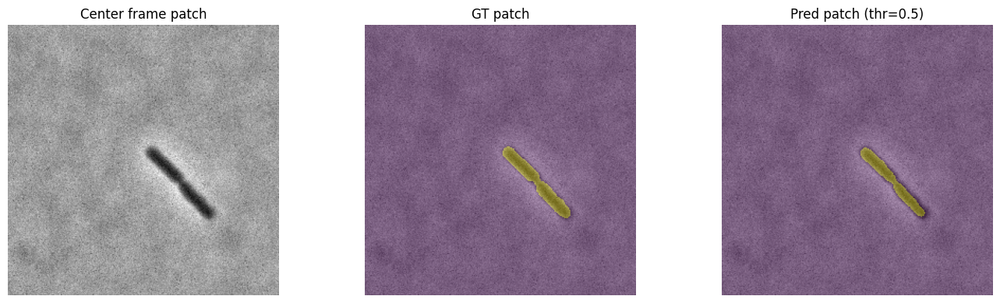

In [48]:
model.eval()
with torch.no_grad():
    sample = ds[0]
    x_full = sample["input"].unsqueeze(0).to(device)
    y_full = sample["mask"].unsqueeze(0).to(device)
    x_patch, y_patch = random_fg_crops(x_full, y_full, crop_size=crop_size)

    logits = model(x_patch)
    prob = torch.sigmoid(logits)[0,0].cpu().numpy()
    gt = y_patch[0,0].cpu().numpy()
    thr = 0.5
    pred = (prob > thr).astype(float)

center_patch = x_patch[0,2].cpu().numpy()

plt.figure(figsize=(14,4))
plt.subplot(1,3,1)
plt.title("Center frame patch")
plt.imshow(center_patch, cmap='gray'); plt.axis('off')

plt.subplot(1,3,2)
plt.title("GT patch")
plt.imshow(center_patch, cmap='gray')
plt.imshow(gt, alpha=0.4); plt.axis('off')

plt.subplot(1,3,3)
plt.title(f"Pred patch (thr={thr})")
plt.imshow(center_patch, cmap='gray')
plt.imshow(pred, alpha=0.4); plt.axis('off')

plt.tight_layout()
plt.show()


In [49]:
import os, torch

save_dir = "/content/drive/MyDrive/STRAck_models"
os.makedirs(save_dir, exist_ok=True)

ckpt_path = os.path.join(save_dir, "temporal_unet_strack.pth")

checkpoint = {
    "model_state": model.state_dict(),
    "optimizer_state": optimizer.state_dict(),
    "epoch": num_epochs,
    "config": {
        "in_channels": 13,
        "window_size": 5,
        "base_ch": 32,
        "crop_size": 256,
    }
}

torch.save(checkpoint, ckpt_path)
print("Saved to:", ckpt_path)


Saved to: /content/drive/MyDrive/STRAck_models/temporal_unet_strack.pth


In [50]:
import os, torch

save_dir = "/content/drive/MyDrive/STRAck_models"
os.makedirs(save_dir, exist_ok=True)

ckpt_path = os.path.join(save_dir, "temporal_unet_strack.pth")

checkpoint = {
    "model_state": model.state_dict(),
    "optimizer_state": optimizer.state_dict(),
    "epoch": num_epochs,
    "config": {
        "in_channels": 13,
        "window_size": 5,
        "base_ch": 32,
        "crop_size": 256,
    }
}

torch.save(checkpoint, ckpt_path)
print("Saved checkpoint to:", ckpt_path)


Saved checkpoint to: /content/drive/MyDrive/STRAck_models/temporal_unet_strack.pth


In [51]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Make sure UNetTemporalFlow class is defined first
model = UNetTemporalFlow(in_channels=13, window_size=5, num_classes=1, base_ch=32).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # lr can be changed if you want

ckpt = torch.load(ckpt_path, map_location=device)
model.load_state_dict(ckpt["model_state"])
optimizer.load_state_dict(ckpt["optimizer_state"])  # optional, only if you keep training further

model.eval()
print("Loaded model, trained up to epoch:", ckpt.get("epoch", "?"))


Loaded model, trained up to epoch: 20


In [52]:
import re
from tqdm import tqdm

IMG_RE = re.compile(r"BF_position(\d+)_time(\d+)\.tif$")

def load_sequence_for_position(raw_dir, position_id):
    """
    raw_dir: path to raw_images/ folder
    position_id: integer (e.g. 0, 3, 7, ...)
    Returns:
      times: sorted list of time indices
      imgs:  list of normalized frames [N,H,W] in [0,1]
    """
    files = []
    for fname in os.listdir(raw_dir):
        if not fname.endswith(".tif") or fname.startswith("._"):
            continue
        m = IMG_RE.search(fname)
        if m is None:
            continue
        pos = int(m.group(1))
        t   = int(m.group(2))
        if pos == position_id:
            files.append((t, os.path.join(raw_dir, fname)))

    if not files:
        raise ValueError(f"No frames found in {raw_dir} for position {position_id}")

    files = sorted(files, key=lambda x: x[0])  # sort by time
    times = [t for (t, _) in files]

    imgs = []
    for t, path in files:
        img = Image.open(path)
        arr = np.array(img, dtype=np.float32)
        # per-frame min-max normalization like training
        min_val = arr.min()
        arr = arr - min_val
        max_val = arr.max()
        if max_val > 0:
            arr = arr / max_val
        imgs.append(arr)

    imgs = np.stack(imgs, axis=0)  # [N,H,W]
    return times, imgs


In [53]:
def infer_sequence_with_temporal_model(model, device, imgs, window_size=5, thresh=0.5):
    """
    imgs: [N,H,W] normalized [0,1]
    Returns:
      probs_list: list of [H,W] floats (probabilities)
      masks_list: list of [H,W] uint8 (0/255)
    For edges (first/last frames where we don't have full window),
    we copy the nearest valid prediction.
    """
    model.eval()
    N, H, W = imgs.shape
    half_w = window_size // 2

    probs_list = [None] * N

    with torch.no_grad():
        for i in tqdm(range(half_w, N - half_w)):
            window = imgs[i-half_w : i+half_w+1]  # [T,H,W], T=window_size

            # compute flow channels neighbors -> center
            T = window.shape[0]
            c_idx = half_w
            flow_chs = []
            for t_idx in range(T):
                if t_idx == c_idx:
                    continue
                flow = compute_flow_pair(window[t_idx], window[c_idx])  # [H,W,2]
                flow = np.transpose(flow, (2,0,1))  # [2,H,W]
                flow_chs.append(flow)
            flow_chs = np.concatenate(flow_chs, axis=0)  # [2*(T-1),H,W]

            stacked = np.concatenate([window, flow_chs], axis=0).astype(np.float32)  # [C,H,W]
            x = torch.from_numpy(stacked).unsqueeze(0).to(device)  # [1,C,H,W]

            logits = model(x)  # [1,1,H,W]
            prob = torch.sigmoid(logits)[0,0].cpu().numpy()  # [H,W]
            probs_list[i] = prob

    # Fill border frames by copying nearest prediction
    first_valid = half_w
    last_valid = N - half_w - 1
    for i in range(first_valid):
        probs_list[i] = probs_list[first_valid]
    for i in range(last_valid+1, N):
        probs_list[i] = probs_list[last_valid]

    # convert to binary masks
    masks_list = []
    for prob in probs_list:
        m = (prob > thresh).astype(np.uint8) * 255
        masks_list.append(m)

    return probs_list, masks_list


In [54]:
import cv2

def overlay_mask_on_frame(gray_img, mask, alpha=0.5):
    """
    gray_img: [H,W] in [0,1]
    mask: [H,W] uint8 0/255
    Returns RGB uint8 [H,W,3]
    """
    base = (gray_img * 255).astype(np.uint8)
    base_rgb = np.stack([base, base, base], axis=-1)  # [H,W,3]

    color = np.zeros_like(base_rgb)
    color[...,1] = 255  # green

    mask_bool = mask > 0
    overlay = base_rgb.copy()
    overlay[mask_bool] = color[mask_bool]

    out = cv2.addWeighted(overlay, alpha, base_rgb, 1-alpha, 0)
    return out

def make_segmentation_video(imgs, masks, out_path, fps=5):
    """
    imgs: [N,H,W] in [0,1]
    masks: list of [H,W] 0/255
    """
    N, H, W = imgs.shape
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter(out_path, fourcc, fps, (W, H))

    for i in range(N):
        frame_rgb = overlay_mask_on_frame(imgs[i], masks[i])
        # cv2 expects BGR
        frame_bgr = cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR)
        writer.write(frame_bgr)

    writer.release()
    print("Saved video to:", out_path)


In [57]:
# 1. Point to the raw_images folder
raw_dir = "/content/STRAck/Lysobacter/Lysobacter/Time-lapse_dataset3/raw_images"

# 2. Choose a position ID that actually exists in this folder (check filenames)
position_id = 0  # e.g., BF_position0_time00xx.tif

# 3. Load the sequence
times, imgs = load_sequence_for_position(raw_dir, position_id)
print("Frames:", times, "  shape:", imgs.shape)

# 4. Run inference
window_size = 5
thresh = 0.5

probs_list, masks_list = infer_sequence_with_temporal_model(
    model, device, imgs, window_size=window_size, thresh=thresh
)

# 5. Make video (save to Drive)
video_out = f"/content/drive/MyDrive/STRAck_videos/Lysobacter_ds1_pos{position_id}.mp4"
os.makedirs(os.path.dirname(video_out), exist_ok=True)

make_segmentation_video(imgs, masks_list, video_out, fps=5)


ValueError: No frames found in /content/STRAck/Lysobacter/Lysobacter/Time-lapse_dataset3/raw_images for position 0

In [58]:
import os, re

PPUTIDA_ROOT = "/content/STRAck/Pputida"  # where you unzipped

for root, dirs, files in os.walk(PPUTIDA_ROOT):
    if root.endswith("raw_images"):
        print("RAW DIR:", root)
        positions = set()
        for f in files:
            if f.endswith(".tif") and f.startswith("BF_position"):
                m = re.search(r"BF_position(\d+)_time(\d+)\.tif", f)
                if m:
                    positions.add(int(m.group(1)))
        print("  Positions:", sorted(list(positions)))


RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset3/raw_images
  Positions: [4]
RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset5/raw_images
  Positions: [8]
RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset2/raw_images
  Positions: [3]
RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset1/raw_images
  Positions: [1]
RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset4/raw_images
  Positions: [5]
RAW DIR: /content/STRAck/Pputida/__MACOSX/Pputida/Time-lapse_dataset3/raw_images
  Positions: []
RAW DIR: /content/STRAck/Pputida/__MACOSX/Pputida/Time-lapse_dataset4/raw_images
  Positions: []


In [59]:
# 1. choose Pputida dataset and position
raw_dir = "/content/STRAck/Pputida/Pputida/Time-lapse_dataset1/raw_images"  # <- change if needed
position_id = 1  # <- choose from the list printed above

# 2. load the time series for that position
times, imgs = load_sequence_for_position(raw_dir, position_id)
print("Frames:", times)
print("Imgs shape:", imgs.shape)  # [N,H,W]

# 3. run model with temporal window + flow
window_size = 5
thresh = 0.5

probs_list, masks_list = infer_sequence_with_temporal_model(
    model, device, imgs, window_size=window_size, thresh=thresh
)


Frames: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Imgs shape: (15, 512, 512)


100%|██████████| 11/11 [00:03<00:00,  2.88it/s]


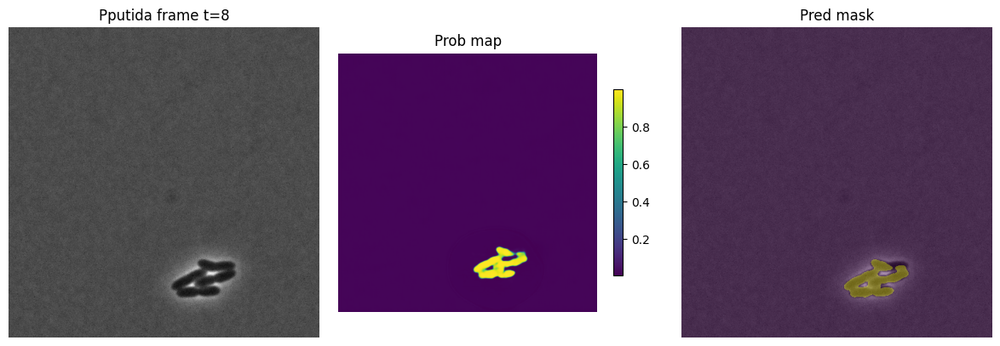

In [60]:
i = len(times) // 2  # middle frame
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.title(f"Pputida frame t={times[i]}")
plt.imshow(imgs[i], cmap="gray")
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Prob map")
plt.imshow(probs_list[i], cmap="viridis")
plt.colorbar(shrink=0.6)
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Pred mask")
plt.imshow(imgs[i], cmap="gray")
plt.imshow(masks_list[i], alpha=0.4)
plt.axis("off")
plt.tight_layout()
plt.show()


In [61]:
video_out = f"/content/drive/MyDrive/STRAck_videos/Pputida_ds1_pos{position_id}.mp4"
os.makedirs(os.path.dirname(video_out), exist_ok=True)

make_segmentation_video(imgs, masks_list, video_out, fps=5)


Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida_ds1_pos1.mp4


In [62]:
import os, re

PPUTIDA_ROOT = "/content/STRAck/Pputida"  # where you unzipped

for root, dirs, files in os.walk(PPUTIDA_ROOT):
    if root.endswith("raw_images"):
        print("RAW DIR:", root)
        positions = set()
        for f in files:
            if f.endswith(".tif") and f.startswith("BF_position"):
                m = re.search(r"BF_position(\d+)_time(\d+)\.tif", f)
                if m:
                    positions.add(int(m.group(1)))
        print("  Positions:", sorted(list(positions)))


RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset3/raw_images
  Positions: [4]
RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset5/raw_images
  Positions: [8]
RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset2/raw_images
  Positions: [3]
RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset1/raw_images
  Positions: [1]
RAW DIR: /content/STRAck/Pputida/Pputida/Time-lapse_dataset4/raw_images
  Positions: [5]
RAW DIR: /content/STRAck/Pputida/__MACOSX/Pputida/Time-lapse_dataset3/raw_images
  Positions: []
RAW DIR: /content/STRAck/Pputida/__MACOSX/Pputida/Time-lapse_dataset4/raw_images
  Positions: []


In [63]:
# 1. choose Pputida dataset and position
raw_dir = "/content/STRAck/Pputida/Pputida/Time-lapse_dataset1/raw_images"  # <- change if needed
position_id = 1  # <- choose from the list printed above

# 2. load the time series for that position
times, imgs = load_sequence_for_position(raw_dir, position_id)
print("Frames:", times)
print("Imgs shape:", imgs.shape)  # [N,H,W]

# 3. run model with temporal window + flow
window_size = 5
thresh = 0.5

probs_list, masks_list = infer_sequence_with_temporal_model(
    model, device, imgs, window_size=window_size, thresh=thresh
)


Frames: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Imgs shape: (15, 512, 512)


100%|██████████| 11/11 [00:03<00:00,  2.89it/s]


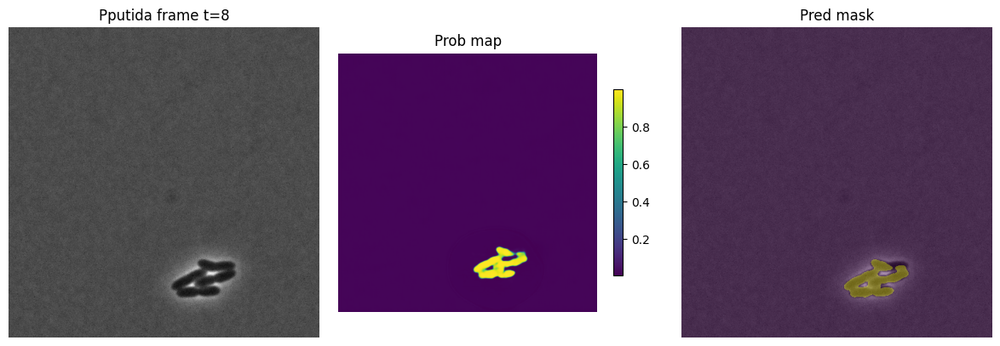

In [64]:
i = len(times) // 2  # middle frame
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.title(f"Pputida frame t={times[i]}")
plt.imshow(imgs[i], cmap="gray")
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Prob map")
plt.imshow(probs_list[i], cmap="viridis")
plt.colorbar(shrink=0.6)
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Pred mask")
plt.imshow(imgs[i], cmap="gray")
plt.imshow(masks_list[i], alpha=0.4)
plt.axis("off")
plt.tight_layout()
plt.show()


In [65]:
import os, re

PVERONII_ROOT = "/content/STRAck/Pveronii"  # where you unzipped

for root, dirs, files in os.walk(PVERONII_ROOT):
    if root.endswith("raw_images"):
        print("RAW DIR:", root)
        positions = set()
        for f in files:
            if f.endswith(".tif") and f.startswith("BF_position"):
                m = re.search(r"BF_position(\d+)_time(\d+)\.tif", f)
                if m:
                    positions.add(int(m.group(1)))
        print("  Positions:", sorted(list(positions)))


RAW DIR: /content/STRAck/Pveronii/__MACOSX/Pveronii/Time-lapse_dataset1/raw_images
  Positions: []
RAW DIR: /content/STRAck/Pveronii/__MACOSX/Pveronii/Time-lapse_dataset4/raw_images
  Positions: []
RAW DIR: /content/STRAck/Pveronii/Pveronii/Time-lapse_dataset3/raw_images
  Positions: [5]
RAW DIR: /content/STRAck/Pveronii/Pveronii/Time-lapse_dataset5/raw_images
  Positions: [11]
RAW DIR: /content/STRAck/Pveronii/Pveronii/Time-lapse_dataset2/raw_images
  Positions: [2]
RAW DIR: /content/STRAck/Pveronii/Pveronii/Time-lapse_dataset1/raw_images
  Positions: [1]
RAW DIR: /content/STRAck/Pveronii/Pveronii/Time-lapse_dataset4/raw_images
  Positions: [8]


In [68]:
raw_dir = "/content/STRAck/Pveronii/Pveronii/Time-lapse_dataset3/raw_images"
position_id = 5   # <- choose from printed list


In [69]:
# 1. Load the Pveronii sequence for that position
times, imgs = load_sequence_for_position(raw_dir, position_id)
print("Frames:", times)
print("Imgs shape:", imgs.shape)   # [N,H,W]

# 2. Run temporal model with optical flow
window_size = 5
thresh = 0.5

probs_list, masks_list = infer_sequence_with_temporal_model(
    model, device, imgs, window_size=window_size, thresh=thresh
)


Frames: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
Imgs shape: (19, 512, 512)


100%|██████████| 15/15 [00:05<00:00,  2.88it/s]


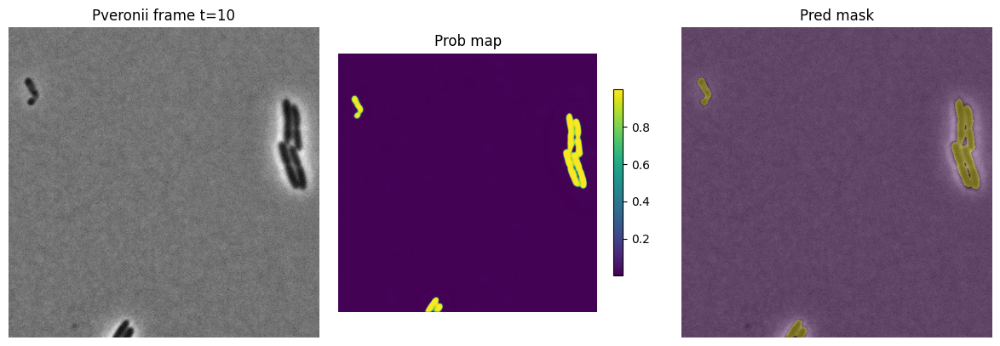

In [70]:
i = len(times) // 2  # pick a middle frame
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.title(f"Pveronii frame t={times[i]}")
plt.imshow(imgs[i], cmap="gray")
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Prob map")
plt.imshow(probs_list[i], cmap="viridis")
plt.colorbar(shrink=0.6)
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Pred mask")
plt.imshow(imgs[i], cmap="gray")
plt.imshow(masks_list[i], alpha=0.4)
plt.axis("off")
plt.tight_layout()
plt.show()


In [71]:
video_out = f"/content/drive/MyDrive/STRAck_videos/Pveronii_pos{position_id}.mp4"
os.makedirs(os.path.dirname(video_out), exist_ok=True)

make_segmentation_video(imgs, masks_list, video_out, fps=5)
print("Video saved at:", video_out)


Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii_pos5.mp4
Video saved at: /content/drive/MyDrive/STRAck_videos/Pveronii_pos5.mp4


In [72]:
import os, re

RAHNELLA_ROOT = "/content/STRAck/Rahnella"  # adjust if needed

for root, dirs, files in os.walk(RAHNELLA_ROOT):
    if root.endswith("raw_images"):
        print("RAW DIR:", root)

        positions = set()
        for f in files:
            if f.endswith(".tif") and f.startswith("BF_position"):
                m = re.search(r"BF_position(\d+)_time(\d+)\.tif", f)
                if m:
                    positions.add(int(m.group(1)))

        print("  Positions:", sorted(list(positions)))


RAW DIR: /content/STRAck/Rahnella/Rahnella/Time-lapse_dataset3/raw_images
  Positions: [7]
RAW DIR: /content/STRAck/Rahnella/Rahnella/Time-lapse_dataset5/raw_images
  Positions: [15]
RAW DIR: /content/STRAck/Rahnella/Rahnella/Time-lapse_dataset2/raw_images
  Positions: [4]
RAW DIR: /content/STRAck/Rahnella/Rahnella/Time-lapse_dataset1/raw_images
  Positions: [3]
RAW DIR: /content/STRAck/Rahnella/Rahnella/Time-lapse_dataset4/raw_images
  Positions: [8]
RAW DIR: /content/STRAck/Rahnella/__MACOSX/Rahnella/Time-lapse_dataset2/raw_images
  Positions: []
RAW DIR: /content/STRAck/Rahnella/__MACOSX/Rahnella/Time-lapse_dataset1/raw_images
  Positions: []


In [73]:
raw_dir = "/content/STRAck/Rahnella/Rahnella/Time-lapse_dataset3/raw_images"
position_id = 7


In [74]:
times, imgs = load_sequence_for_position(raw_dir, position_id)

print("Frames:", times)
print("Shape:", imgs.shape)   # [N,H,W]


Frames: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Shape: (12, 512, 512)


In [75]:
window_size = 5
thresh = 0.5

probs_list, masks_list = infer_sequence_with_temporal_model(
    model, device, imgs, window_size=window_size, thresh=thresh
)


100%|██████████| 8/8 [00:02<00:00,  2.82it/s]


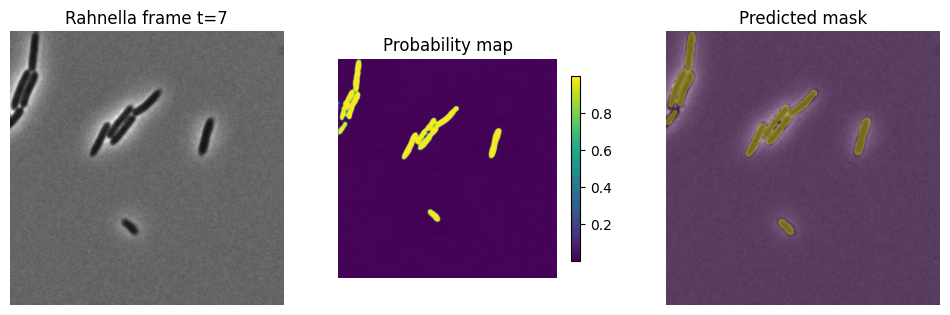

In [76]:
i = len(times) // 2  # mid frame

plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.title(f"Rahnella frame t={times[i]}")
plt.imshow(imgs[i], cmap="gray")
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Probability map")
plt.imshow(probs_list[i], cmap="viridis")
plt.colorbar(shrink=0.6)
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Predicted mask")
plt.imshow(imgs[i], cmap="gray")
plt.imshow(masks_list[i], alpha=0.4)
plt.axis("off")
plt.show()


In [77]:
video_out = f"/content/drive/MyDrive/STRAck_videos/Rahnella_ds_pos{position_id}.mp4"
os.makedirs(os.path.dirname(video_out), exist_ok=True)

make_segmentation_video(imgs, masks_list, video_out, fps=5)

print("Saved:", video_out)


Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella_ds_pos7.mp4
Saved: /content/drive/MyDrive/STRAck_videos/Rahnella_ds_pos7.mp4


In [78]:
from skimage.measure import label as cc_label

def get_instance_masks(mask):
    """
    mask: [H,W] uint8 (0 or 255)
    returns:
      inst_masks: dict {instance_id -> bool mask}
      inst_lbl:   [H,W] int labels (1..K), 0=background
    """
    bin_mask = (mask > 0).astype(np.uint8)
    inst_lbl = cc_label(bin_mask, connectivity=1)
    ids = np.unique(inst_lbl)
    ids = ids[ids != 0]

    inst_masks = {}
    for i in ids:
        inst_masks[int(i)] = (inst_lbl == i)
    return inst_masks, inst_lbl


In [79]:
def instance_iou(m1, m2):
    """
    m1, m2: boolean masks [H,W]
    """
    inter = np.logical_and(m1, m2).sum()
    union = np.logical_or(m1, m2).sum()
    return inter / union if union > 0 else 0.0


3️⃣ Hungarian matching between consecutive frames

In [80]:
from scipy.optimize import linear_sum_assignment

def match_tracks_to_instances(tracks_prev, inst_masks, iou_thresh=0.2):
    """
    tracks_prev: dict {track_id -> bool mask} for previous frame
    inst_masks:  dict {inst_id  -> bool mask} for current frame
    returns:
      matches: dict {track_id -> inst_id}
      new_inst_ids: set of inst_ids that were NOT matched (new births)
    """
    if not tracks_prev or not inst_masks:
        return {}, set(inst_masks.keys())

    prev_ids = list(tracks_prev.keys())
    curr_ids = list(inst_masks.keys())

    cost = np.zeros((len(prev_ids), len(curr_ids)), dtype=np.float32)
    for i, tid in enumerate(prev_ids):
        m_prev = tracks_prev[tid]
        for j, iid in enumerate(curr_ids):
            m_curr = inst_masks[iid]
            iou = instance_iou(m_prev, m_curr)
            cost[i, j] = 1.0 - iou   # lower cost = better

    row_ind, col_ind = linear_sum_assignment(cost)

    matches = {}
    used_curr = set()
    for r, c in zip(row_ind, col_ind):
        tid = prev_ids[r]
        iid = curr_ids[c]
        iou = 1.0 - cost[r, c]
        if iou >= iou_thresh:
            matches[tid] = iid
            used_curr.add(iid)

    new_inst_ids = set(curr_ids) - used_curr
    return matches, new_inst_ids


In [81]:
def track_instances_over_sequence(masks_list, iou_thresh=0.2):
    """
    masks_list: list of [H,W] uint8 (0/255)
    returns:
      track_labels_seq: list of [H,W] int (track_id per pixel, 0 = background)
    """
    next_track_id = 1
    tracks_prev = {}  # track_id -> bool mask (prev frame)
    track_labels_seq = []

    for t, mask in enumerate(masks_list):
        inst_masks, inst_lbl = get_instance_masks(mask)

        if t == 0 or len(tracks_prev) == 0:
            # first frame: assign new track for every instance
            track_lbl = np.zeros_like(inst_lbl, dtype=np.int32)
            tracks_prev = {}
            for iid, imask in inst_masks.items():
                tid = next_track_id
                next_track_id += 1
                track_lbl[imask] = tid
                tracks_prev[tid] = imask
            track_labels_seq.append(track_lbl)
            continue

        # match existing tracks to current instances
        matches, new_inst_ids = match_tracks_to_instances(tracks_prev, inst_masks, iou_thresh=iou_thresh)

        track_lbl = np.zeros_like(inst_lbl, dtype=np.int32)
        new_tracks_prev = {}

        # keep matched tracks with same ID
        for tid, iid in matches.items():
            imask = inst_masks[iid]
            track_lbl[imask] = tid
            new_tracks_prev[tid] = imask

        # create new tracks for unmatched instances
        for iid in new_inst_ids:
            imask = inst_masks[iid]
            tid = next_track_id
            next_track_id += 1
            track_lbl[imask] = tid
            new_tracks_prev[tid] = imask

        tracks_prev = new_tracks_prev
        track_labels_seq.append(track_lbl)

    return track_labels_seq


In [82]:
track_labels_seq = track_instances_over_sequence(masks_list, iou_thresh=0.2)
len(track_labels_seq), track_labels_seq[0].shape


(12, (512, 512))

In [83]:
def tracks_to_color_frame(gray_img, track_lbl, id_to_color=None):
    """
    gray_img: [H,W] in [0,1]
    track_lbl: [H,W] int (0=bg, >0 = track_id)
    id_to_color: dict {track_id -> (R,G,B)} in [0,255]
    """
    base = (gray_img * 255).astype(np.uint8)
    base_rgb = np.stack([base, base, base], axis=-1)

    if id_to_color is None:
        ids = np.unique(track_lbl)
        ids = ids[ids != 0]
        id_to_color = {}
        for tid in ids:
            color = np.random.randint(0, 255, size=3, dtype=np.uint8)
            id_to_color[int(tid)] = (int(color[0]), int(color[1]), int(color[2]))

    out = base_rgb.copy()
    ids = np.unique(track_lbl)
    ids = ids[ids != 0]
    for tid in ids:
        mask = (track_lbl == tid)
        if tid not in id_to_color:
            color = np.random.randint(0, 255, size=3, dtype=np.uint8)
            id_to_color[tid] = (int(color[0]), int(color[1]), int(color[2]))
        else:
            color = id_to_color[tid]
        out[mask] = color

    return out, id_to_color


In [84]:
def make_tracking_video(imgs, track_labels_seq, out_path, fps=5):
    """
    imgs: [N,H,W] in [0,1]
    track_labels_seq: list of [H,W] int
    """
    N, H, W = imgs.shape
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter(out_path, fourcc, fps, (W, H))

    id_to_color = {}
    for t in range(N):
        frame_rgb, id_to_color = tracks_to_color_frame(
            imgs[t], track_labels_seq[t], id_to_color=id_to_color
        )
        frame_bgr = cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR)
        writer.write(frame_bgr)

    writer.release()
    print("Tracking video saved to:", out_path)


In [85]:
times, imgs = load_sequence_for_position(raw_dir, position_id)
probs_list, masks_list = infer_sequence_with_temporal_model(
    model, device, imgs, window_size=5, thresh=0.5
)


100%|██████████| 8/8 [00:02<00:00,  2.85it/s]


In [86]:
track_labels_seq = track_instances_over_sequence(masks_list, iou_thresh=0.2)

video_out = f"/content/drive/MyDrive/STRAck_videos/TRACKS_Rahnella_pos{position_id}.mp4"
os.makedirs(os.path.dirname(video_out), exist_ok=True)

make_tracking_video(imgs, track_labels_seq, video_out, fps=5)


Tracking video saved to: /content/drive/MyDrive/STRAck_videos/TRACKS_Rahnella_pos7.mp4


In [87]:
LOCAL_STRACK_ROOT = "/content/STRAck"  # where Lysobacter, Pputida, Pveronii, Rahnella folders live
OUTPUT_VIDEO_ROOT = "/content/drive/MyDrive/STRAck_videos"
os.makedirs(OUTPUT_VIDEO_ROOT, exist_ok=True)

species_list = ["Lysobacter", "Pputida", "Pveronii", "Rahnella"]


In [88]:
import os, re

IMG_RE = re.compile(r"BF_position(\d+)_time(\d+)\.tif$")

def discover_all_sequences(root_dir, species_list):
    """
    Returns list of dicts:
      {
        "species": str,
        "raw_dir": str,
        "dataset": str,   # Time-lapse_datasetX
        "positions": [int, ...]
      }
    """
    all_seqs = []

    for sp in species_list:
        sp_root1 = os.path.join(root_dir, sp, sp)
        sp_root2 = os.path.join(root_dir, sp)
        if os.path.isdir(sp_root1):
            sp_root = sp_root1
        elif os.path.isdir(sp_root2):
            sp_root = sp_root2
        else:
            print(f"[WARN] No valid base dir for species: {sp}")
            continue

        for root, dirs, files in os.walk(sp_root):
            if root.endswith("raw_images"):
                # root looks like .../{species}/{species}/Time-lapse_datasetX/raw_images
                dataset_name = os.path.basename(os.path.dirname(root))
                positions = set()
                for f in files:
                    if f.endswith(".tif") and f.startswith("BF_position"):
                        m = IMG_RE.search(f)
                        if m:
                            positions.add(int(m.group(1)))
                positions = sorted(list(positions))
                if positions:
                    all_seqs.append({
                        "species": sp,
                        "raw_dir": root,
                        "dataset": dataset_name,
                        "positions": positions
                    })

    return all_seqs

all_sequences = discover_all_sequences(LOCAL_STRACK_ROOT, species_list)
print("Found sequences:")
for seq in all_sequences:
    print(seq["species"], seq["dataset"], "positions:", seq["positions"])


Found sequences:
Lysobacter Time-lapse_dataset3 positions: [6]
Lysobacter Time-lapse_dataset5 positions: [11]
Lysobacter Time-lapse_dataset2 positions: [3]
Lysobacter Time-lapse_dataset1 positions: [0]
Lysobacter Time-lapse_dataset4 positions: [7]
Pputida Time-lapse_dataset3 positions: [4]
Pputida Time-lapse_dataset5 positions: [8]
Pputida Time-lapse_dataset2 positions: [3]
Pputida Time-lapse_dataset1 positions: [1]
Pputida Time-lapse_dataset4 positions: [5]
Pveronii Time-lapse_dataset3 positions: [5]
Pveronii Time-lapse_dataset5 positions: [11]
Pveronii Time-lapse_dataset2 positions: [2]
Pveronii Time-lapse_dataset1 positions: [1]
Pveronii Time-lapse_dataset4 positions: [8]
Rahnella Time-lapse_dataset3 positions: [7]
Rahnella Time-lapse_dataset5 positions: [15]
Rahnella Time-lapse_dataset2 positions: [4]
Rahnella Time-lapse_dataset1 positions: [3]
Rahnella Time-lapse_dataset4 positions: [8]


In [89]:
def process_sequence_full(species, raw_dir, dataset_name, position_id,
                          model, device,
                          window_size=5, seg_thresh=0.5, fps=5):
    """
    species: e.g. 'Lysobacter'
    raw_dir: path to raw_images/
    dataset_name: 'Time-lapse_datasetX'
    position_id: integer
    """
    # 1. load sequence
    times, imgs = load_sequence_for_position(raw_dir, position_id)
    print(f"[{species}] {dataset_name} pos{position_id} -> {len(times)} frames")

    # skip too-short sequences (for temporal window)
    if len(times) < window_size:
        print("  Skipping (not enough frames for window).")
        return

    # 2. segmentation with temporal model + flow
    probs_list, masks_list = infer_sequence_with_temporal_model(
        model, device, imgs, window_size=window_size, thresh=seg_thresh
    )

    # 3. instance tracking
    track_labels_seq = track_instances_over_sequence(masks_list, iou_thresh=0.2)

    # 4. paths for saving
    sp_dir = os.path.join(OUTPUT_VIDEO_ROOT, species)
    os.makedirs(sp_dir, exist_ok=True)

    seg_video_out = os.path.join(
        sp_dir,
        f"SEG_{species}_{dataset_name}_pos{position_id}.mp4"
    )
    track_video_out = os.path.join(
        sp_dir,
        f"TRACKS_{species}_{dataset_name}_pos{position_id}.mp4"
    )

    # 5. make videos
    print("  Saving segmentation video:", seg_video_out)
    make_segmentation_video(imgs, masks_list, seg_video_out, fps=fps)

    print("  Saving tracking video:", track_video_out)
    make_tracking_video(imgs, track_labels_seq, track_video_out, fps=fps)

    print("  Done.\n")


In [90]:
for seq_info in all_sequences:
    species = seq_info["species"]
    raw_dir = seq_info["raw_dir"]
    dataset_name = seq_info["dataset"]
    positions = seq_info["positions"]

    for pos in positions:
        try:
            process_sequence_full(
                species=species,
                raw_dir=raw_dir,
                dataset_name=dataset_name,
                position_id=pos,
                model=model,
                device=device,
                window_size=5,
                seg_thresh=0.5,
                fps=5
            )
        except Exception as e:
            print(f"[ERROR] {species} {dataset_name} pos{pos} -> {e}")


[Lysobacter] Time-lapse_dataset3 pos6 -> 16 frames


100%|██████████| 12/12 [00:04<00:00,  2.85it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset3_pos6.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset3_pos6.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset3_pos6.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset3_pos6.mp4
  Done.

[Lysobacter] Time-lapse_dataset5 pos11 -> 18 frames


100%|██████████| 14/14 [00:04<00:00,  2.87it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset5_pos11.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset5_pos11.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset5_pos11.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset5_pos11.mp4
  Done.

[Lysobacter] Time-lapse_dataset2 pos3 -> 16 frames


100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset2_pos3.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset2_pos3.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset2_pos3.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset2_pos3.mp4
  Done.

[Lysobacter] Time-lapse_dataset1 pos0 -> 16 frames


100%|██████████| 12/12 [00:04<00:00,  2.85it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset1_pos0.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset1_pos0.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset1_pos0.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset1_pos0.mp4
  Done.

[Lysobacter] Time-lapse_dataset4 pos7 -> 17 frames


100%|██████████| 13/13 [00:04<00:00,  2.85it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset4_pos7.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_Lysobacter_Time-lapse_dataset4_pos7.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset4_pos7.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_Lysobacter_Time-lapse_dataset4_pos7.mp4
  Done.

[Pputida] Time-lapse_dataset3 pos4 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.91it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset3_pos4.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset3_pos4.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset3_pos4.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset3_pos4.mp4
  Done.

[Pputida] Time-lapse_dataset5 pos8 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.85it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset5_pos8.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset5_pos8.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset5_pos8.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset5_pos8.mp4
  Done.

[Pputida] Time-lapse_dataset2 pos3 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.86it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset2_pos3.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset2_pos3.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset2_pos3.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset2_pos3.mp4
  Done.

[Pputida] Time-lapse_dataset1 pos1 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.93it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset1_pos1.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset1_pos1.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset1_pos1.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset1_pos1.mp4
  Done.

[Pputida] Time-lapse_dataset4 pos5 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.91it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset4_pos5.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_Pputida_Time-lapse_dataset4_pos5.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset4_pos5.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_Pputida_Time-lapse_dataset4_pos5.mp4
  Done.

[Pveronii] Time-lapse_dataset3 pos5 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.84it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset3_pos5.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset3_pos5.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset3_pos5.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset3_pos5.mp4
  Done.

[Pveronii] Time-lapse_dataset5 pos11 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.87it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset5_pos11.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset5_pos11.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset5_pos11.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset5_pos11.mp4
  Done.

[Pveronii] Time-lapse_dataset2 pos2 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.86it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset2_pos2.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset2_pos2.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset2_pos2.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset2_pos2.mp4
  Done.

[Pveronii] Time-lapse_dataset1 pos1 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.88it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset1_pos1.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset1_pos1.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset1_pos1.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset1_pos1.mp4
  Done.

[Pveronii] Time-lapse_dataset4 pos8 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.85it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset4_pos8.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_Pveronii_Time-lapse_dataset4_pos8.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset4_pos8.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_Pveronii_Time-lapse_dataset4_pos8.mp4
  Done.

[Rahnella] Time-lapse_dataset3 pos7 -> 12 frames


100%|██████████| 8/8 [00:02<00:00,  2.85it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset3_pos7.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset3_pos7.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset3_pos7.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset3_pos7.mp4
  Done.

[Rahnella] Time-lapse_dataset5 pos15 -> 14 frames


100%|██████████| 10/10 [00:03<00:00,  2.84it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset5_pos15.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset5_pos15.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset5_pos15.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset5_pos15.mp4
  Done.

[Rahnella] Time-lapse_dataset2 pos4 -> 13 frames


100%|██████████| 9/9 [00:03<00:00,  2.84it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset2_pos4.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset2_pos4.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset2_pos4.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset2_pos4.mp4
  Done.

[Rahnella] Time-lapse_dataset1 pos3 -> 13 frames


100%|██████████| 9/9 [00:03<00:00,  2.85it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset1_pos3.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset1_pos3.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset1_pos3.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset1_pos3.mp4
  Done.

[Rahnella] Time-lapse_dataset4 pos8 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.86it/s]


  Saving segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset4_pos8.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_Rahnella_Time-lapse_dataset4_pos8.mp4
  Saving tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset4_pos8.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_Rahnella_Time-lapse_dataset4_pos8.mp4
  Done.



In [91]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def inspect_species_frames(ds, model, device, species, max_samples=5, thr=0.5):
    """
    For a given species:
      - pick the first dataset that appears in ds.meta
      - collect up to max_samples labeled frames from that dataset
      - for each: show original center frame, GT, prediction overlay
    """
    model.eval()
    chosen_dataset = None
    selected_indices = []

    # 1) find indices for this species & one dataset
    print(f"\n=== Inspecting species: {species} ===")
    for idx in range(len(ds)):
        sample = ds[idx]
        meta = sample["meta"]
        if meta["species"] != species:
            continue

        if chosen_dataset is None:
            chosen_dataset = meta["dataset"]

        if meta["dataset"] != chosen_dataset:
            continue

        selected_indices.append(idx)
        if len(selected_indices) >= max_samples:
            break

    if not selected_indices:
        print(f"No samples found for species {species}")
        return

    print(f"Using dataset: {chosen_dataset}")
    print(f"Sample indices: {selected_indices}")

    n = len(selected_indices)
    plt.figure(figsize=(10, 3*n))

    for row, idx in enumerate(selected_indices):
        sample = ds[idx]
        x = sample["input"].unsqueeze(0).to(device)  # [1,C,H,W]
        y = sample["mask"][0].cpu().numpy()          # [H,W]
        meta = sample["meta"]

        with torch.no_grad():
            logits = model(x)
            if logits.shape[-2:] != sample["mask"].shape[-2:]:
                logits = F.interpolate(
                    logits,
                    size=sample["mask"].shape[-2:],
                    mode="bilinear",
                    align_corners=False
                )
            prob = torch.sigmoid(logits)[0,0].cpu().numpy()
            pred = (prob > thr).astype(float)

        center_frame = sample["input"][2].cpu().numpy()  # center time frame

        # row offset
        r0 = row * 3

        # 1) original
        plt.subplot(n, 3, r0+1)
        plt.title(f"{meta['species']} | {meta['dataset']}\npos {meta['position']} t={meta['time']}\nOriginal")
        plt.imshow(center_frame, cmap="gray")
        plt.axis("off")

        # 2) GT overlay
        plt.subplot(n, 3, r0+2)
        plt.title("GT overlay")
        plt.imshow(center_frame, cmap="gray")
        plt.imshow(y, alpha=0.4)
        plt.axis("off")

        # 3) Predicted overlay
        plt.subplot(n, 3, r0+3)
        plt.title(f"Pred overlay (thr={thr})")
        plt.imshow(center_frame, cmap="gray")
        plt.imshow(pred, alpha=0.4)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [92]:
for sp in ["Lysobacter", "Pputida", "Pveronii", "Rahnella"]:
    inspect_species_frames(ds, model, device, species=sp, max_samples=4, thr=0.5)


Output hidden; open in https://colab.research.google.com to view.

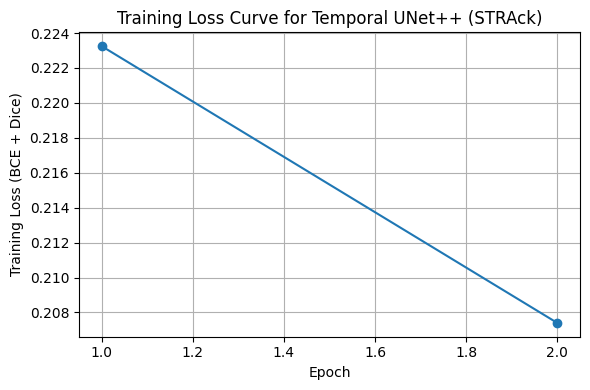

In [94]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
plt.plot(range(1, len(train_loss_history)+1), train_loss_history, marker="o")
plt.xlabel("Epoch")
plt.ylabel("Training Loss (BCE + Dice)")
plt.title("Training Loss Curve for Temporal UNet++ (STRAck)")
plt.grid(True)
plt.tight_layout()
plt.show()


In [95]:
from skimage.segmentation import find_boundaries
from scipy.ndimage import binary_dilation
import numpy as np

def iou_single(pred_mask, gt_mask, eps=1e-6):
    pred = pred_mask.astype(bool)
    gt   = gt_mask.astype(bool)
    inter = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum() + eps
    return float(inter / union)

def boundary_f1_single(pred_mask, gt_mask, dilation_radius=1):
    pred_mask = pred_mask.astype(bool)
    gt_mask   = gt_mask.astype(bool)

    b_pred = find_boundaries(pred_mask, mode="inner")
    b_gt   = find_boundaries(gt_mask, mode="inner")

    struct = np.ones((2*dilation_radius+1, 2*dilation_radius+1), dtype=bool)
    b_pred_dil = binary_dilation(b_pred, structure=struct)
    b_gt_dil   = binary_dilation(b_gt, structure=struct)

    tp = (b_pred & b_gt_dil).sum()
    fp = (b_pred & ~b_gt_dil).sum()
    fn = (b_gt & ~b_pred_dil).sum()

    prec = tp / (tp + fp + 1e-6)
    rec  = tp / (tp + fn + 1e-6)
    return float(2 * prec * rec / (prec + rec + 1e-6))


In [96]:
model.eval()

species_metrics = {}  # species -> {"iou": [...], "bf1": [...]}

with torch.no_grad():
    for idx in range(len(ds)):
        sample = ds[idx]
        x = sample["input"].unsqueeze(0).to(device)   # [1,C,H,W]
        y = sample["mask"][0].cpu().numpy()          # [H,W]
        meta = sample["meta"]
        sp = meta["species"]

        logits = model(x)
        if logits.shape[-2:] != sample["mask"].shape[-2:]:
            logits = F.interpolate(
                logits,
                size=sample["mask"].shape[-2:],
                mode="bilinear",
                align_corners=False
            )

        prob = torch.sigmoid(logits)[0,0].cpu().numpy()
        pred = (prob > 0.5).astype(np.uint8)  # thr = 0.5

        if y.sum() < 1:
            continue  # skip empty GT

        iou_val = iou_single(pred, y)
        bf1_val = boundary_f1_single(pred, y)

        if sp not in species_metrics:
            species_metrics[sp] = {"iou": [], "bf1": []}
        species_metrics[sp]["iou"].append(iou_val)
        species_metrics[sp]["bf1"].append(bf1_val)

# Compute means
species_names = sorted(species_metrics.keys())
mean_iou = [np.mean(species_metrics[sp]["iou"]) for sp in species_names]
mean_bf1 = [np.mean(species_metrics[sp]["bf1"]) for sp in species_names]

print("Species:", species_names)
print("Mean IoU:", mean_iou)
print("Mean Boundary F1:", mean_bf1)


Species: ['Lysobacter', 'Pputida', 'Pveronii', 'Rahnella']
Mean IoU: [np.float64(0.8700845511475183), np.float64(0.8045587349367969), np.float64(0.6418088234186078), np.float64(0.6454225954564804)]
Mean Boundary F1: [np.float64(0.8162463460577936), np.float64(0.7352969849625353), np.float64(0.6527150466398595), np.float64(0.6671251019312483)]


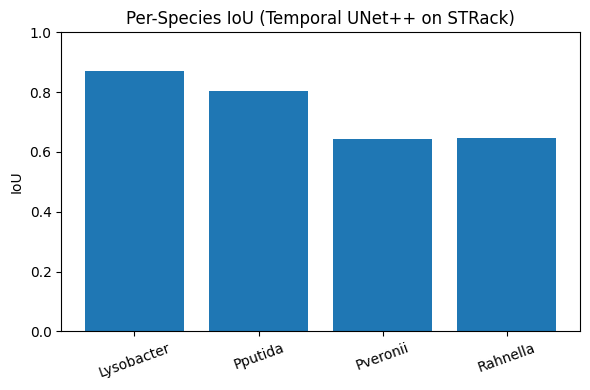

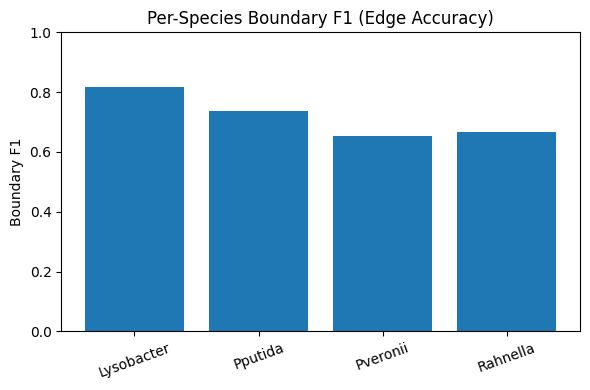

In [97]:
x = np.arange(len(species_names))

plt.figure(figsize=(6,4))
plt.bar(x, mean_iou)
plt.xticks(x, species_names, rotation=20)
plt.ylim(0, 1.0)
plt.ylabel("IoU")
plt.title("Per-Species IoU (Temporal UNet++ on STRack)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.bar(x, mean_bf1)
plt.xticks(x, species_names, rotation=20)
plt.ylim(0, 1.0)
plt.ylabel("Boundary F1")
plt.title("Per-Species Boundary F1 (Edge Accuracy)")
plt.tight_layout()
plt.show()


SPLINEDIST

In [98]:
import numpy as np
from skimage.measure import label as cc_label, find_contours
from skimage.draw import polygon
from scipy.interpolate import splprep, splev

def contour_to_spline_polygon(contour, num_ctrl=16, oversample=4, closed=True):
    """
    contour: [N,2] array of (row, col) boundary coordinates
    num_ctrl: number of spline control points
    oversample: factor for how many points to render along spline
    closed: whether to treat as closed curve
    Returns:
      ctrl_pts: [num_ctrl, 2]
      poly_pts: [M, 2] dense spline points
    """
    if contour.shape[0] < num_ctrl:
        # too small, just return original contour
        return contour, contour

    # Parametrize contour by cumulative arc-length
    d = np.sqrt(np.sum(np.diff(contour, axis=0)**2, axis=1))
    s = np.concatenate([[0], np.cumsum(d)])
    if s[-1] == 0:
        return contour, contour
    t = s / s[-1]  # normalize to [0,1]

    # sample num_ctrl points at equal t
    t_ctrl = np.linspace(0, 1, num_ctrl, endpoint=False)
    ctrl_rows = np.interp(t_ctrl, t, contour[:, 0])
    ctrl_cols = np.interp(t_ctrl, t, contour[:, 1])
    ctrl_pts = np.stack([ctrl_rows, ctrl_cols], axis=1)

    # fit spline through control points
    per = 1 if closed else 0
    try:
        (tck, u) = splprep(
            [ctrl_pts[:, 1], ctrl_pts[:, 0]],  # x=col, y=row
            s=0.0,
            per=per,
            k=3  # cubic
        )
    except Exception:
        # fallback if spline fails
        return ctrl_pts, ctrl_pts

    # evaluate spline densely
    num_samples = num_ctrl * oversample
    u_fine = np.linspace(0, 1, num_samples, endpoint=False)
    x_fine, y_fine = splev(u_fine, tck)  # x=col, y=row
    poly_pts = np.stack([y_fine, x_fine], axis=1)  # back to (row, col)
    return ctrl_pts, poly_pts


In [99]:
def refine_mask_with_splines(mask, num_ctrl=16, oversample=4, min_area=20):
    """
    mask: [H,W] uint8, 0 or 255
    Returns:
      refined_mask: [H,W] uint8 (0 or 255)
      instance_splines: list of dicts:
           {"label": int_instance_label,
            "ctrl_pts": [K,2],
            "poly_pts": [M,2]}
    """
    H, W = mask.shape
    bin_mask = (mask > 0).astype(np.uint8)
    lbl = cc_label(bin_mask, connectivity=1)

    refined = np.zeros_like(mask, dtype=np.uint8)
    instance_splines = []

    instance_ids = np.unique(lbl)
    instance_ids = instance_ids[instance_ids != 0]

    for inst_id in instance_ids:
        inst_mask = (lbl == inst_id).astype(np.uint8)
        if inst_mask.sum() < min_area:
            # too small, just copy original
            refined[inst_mask.astype(bool)] = 255
            continue

        # find contours (could be multiple, pick the longest)
        contours = find_contours(inst_mask, level=0.5)
        if not contours:
            refined[inst_mask.astype(bool)] = 255
            continue

        # choose the longest contour
        contour = max(contours, key=lambda c: c.shape[0])

        ctrl_pts, poly_pts = contour_to_spline_polygon(
            contour, num_ctrl=num_ctrl, oversample=oversample, closed=True
        )

        # rasterize spline polygon
        rr = np.clip(poly_pts[:, 0], 0, H - 1)
        cc = np.clip(poly_pts[:, 1], 0, W - 1)
        rr_i, cc_i = polygon(rr, cc, (H, W))

        refined_inst = np.zeros_like(mask, dtype=np.uint8)
        refined_inst[rr_i, cc_i] = 255

        refined = np.maximum(refined, refined_inst)

        instance_splines.append({
            "label": int(inst_id),
            "ctrl_pts": ctrl_pts,
            "poly_pts": poly_pts
        })

    return refined, instance_splines


In [100]:
def refine_sequence_with_splines(masks_list, num_ctrl=16, oversample=4, min_area=20):
    """
    masks_list: list of [H,W] uint8 (0 or 255) predicted masks
    Returns:
      refined_masks_list: list of [H,W] uint8
      splines_per_frame: list of list-of-splines (same length as masks_list)
    """
    refined_masks_list = []
    splines_per_frame = []

    for mask in masks_list:
        refined_mask, inst_splines = refine_mask_with_splines(
            mask,
            num_ctrl=num_ctrl,
            oversample=oversample,
            min_area=min_area
        )
        refined_masks_list.append(refined_mask)
        splines_per_frame.append(inst_splines)

    return refined_masks_list, splines_per_frame


In [101]:
# after you do:
# probs_list, masks_list = infer_sequence_with_temporal_model(...)

refined_masks_list, splines_per_frame = refine_sequence_with_splines(
    masks_list,
    num_ctrl=16,
    oversample=4,
    min_area=20
)

print("Original mask sum:", masks_list[0].sum(), "Refined mask sum:", refined_masks_list[0].sum())
print("Number of instances with splines in frame 0:", len(splines_per_frame[0]))


Original mask sum: 1100835 Refined mask sum: 1105680
Number of instances with splines in frame 0: 4


In [102]:
track_labels_seq = track_instances_over_sequence(refined_masks_list, iou_thresh=0.2)


In [104]:
# Pick mid frame or any test sequence you already loaded
# imgs and refined_masks_list already computed earlier

output_dir = "/content/drive/MyDrive/STRAck_videos"
os.makedirs(output_dir, exist_ok=True)

seg_video_out = f"{output_dir}/spline_refined_segmentation_demo.mp4"

print("Saving video:", seg_video_out)
make_segmentation_video(imgs, refined_masks_list, seg_video_out, fps=5)


Saving video: /content/drive/MyDrive/STRAck_videos/spline_refined_segmentation_demo.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/spline_refined_segmentation_demo.mp4


In [105]:
import os

OUTPUT_VIDEO_ROOT = "/content/drive/MyDrive/STRAck_videos"
os.makedirs(OUTPUT_VIDEO_ROOT, exist_ok=True)

def process_sequence_full_with_splines(
    species,
    raw_dir,
    dataset_name,
    position_id,
    model,
    device,
    window_size=5,
    seg_thresh=0.5,
    fps=5,
    num_ctrl=16,
    oversample=4,
    min_area=20,
):
    """
    species: 'Lysobacter' / 'Pputida' / 'Pveronii' / 'Rahnella'
    raw_dir: path to raw_images/ folder
    dataset_name: 'Time-lapse_datasetX'
    position_id: integer position index
    """
    # 1) load full brightfield sequence
    times, imgs = load_sequence_for_position(raw_dir, position_id)
    print(f"[{species}] {dataset_name} pos{position_id} -> {len(times)} frames")

    if len(times) < window_size:
        print("  Skipping (not enough frames for temporal window).")
        return

    # 2) segmentation with temporal model + optical flow
    probs_list, masks_list = infer_sequence_with_temporal_model(
        model, device, imgs, window_size=window_size, thresh=seg_thresh
    )

    # 3) SplineDist-style refinement
    refined_masks_list, splines_per_frame = refine_sequence_with_splines(
        masks_list,
        num_ctrl=num_ctrl,
        oversample=oversample,
        min_area=min_area,
    )

    # 4) tracking on spline-refined masks
    track_labels_seq = track_instances_over_sequence(
        refined_masks_list,
        iou_thresh=0.2
    )

    # 5) video output paths
    sp_dir = os.path.join(OUTPUT_VIDEO_ROOT, species)
    os.makedirs(sp_dir, exist_ok=True)

    seg_video_out = os.path.join(
        sp_dir,
        f"SEG_SPLINE_{species}_{dataset_name}_pos{position_id}.mp4"
    )
    tracks_video_out = os.path.join(
        sp_dir,
        f"TRACKS_SPLINE_{species}_{dataset_name}_pos{position_id}.mp4"
    )

    # 6) videos (segmentation + tracking)
    print("  Saving spline-refined segmentation video:", seg_video_out)
    make_segmentation_video(imgs, refined_masks_list, seg_video_out, fps=fps)

    print("  Saving spline-refined tracking video:", tracks_video_out)
    make_tracking_video(imgs, track_labels_seq, tracks_video_out, fps=fps)

    print("  Done.\n")


In [106]:
# If you don't have this yet, re-run the discover function we wrote earlier:
# all_sequences = discover_all_sequences(LOCAL_STRACK_ROOT, species_list)

for seq_info in all_sequences:
    species = seq_info["species"]
    raw_dir = seq_info["raw_dir"]
    dataset_name = seq_info["dataset"]
    positions = seq_info["positions"]

    # just do the FIRST position of each species for demo
    pos = positions[0]
    print(f"Processing {species} {dataset_name} pos{pos} with spline refinement...")
    process_sequence_full_with_splines(
        species=species,
        raw_dir=raw_dir,
        dataset_name=dataset_name,
        position_id=pos,
        model=model,
        device=device,
        window_size=5,
        seg_thresh=0.5,
        fps=5,
        num_ctrl=16,
        oversample=4,
        min_area=20,
    )


Processing Lysobacter Time-lapse_dataset3 pos6 with spline refinement...
[Lysobacter] Time-lapse_dataset3 pos6 -> 16 frames


100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset3_pos6.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset3_pos6.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset3_pos6.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset3_pos6.mp4
  Done.

Processing Lysobacter Time-lapse_dataset5 pos11 with spline refinement...
[Lysobacter] Time-lapse_dataset5 pos11 -> 18 frames


100%|██████████| 14/14 [00:04<00:00,  2.89it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset5_pos11.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset5_pos11.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset5_pos11.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset5_pos11.mp4
  Done.

Processing Lysobacter Time-lapse_dataset2 pos3 with spline refinement...
[Lysobacter] Time-lapse_dataset2 pos3 -> 16 frames


100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset2_pos3.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset2_pos3.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset2_pos3.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset2_pos3.mp4
  Done.

Processing Lysobacter Time-lapse_dataset1 pos0 with spline refinement...
[Lysobacter] Time-lapse_dataset1 pos0 -> 16 frames


100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset1_pos0.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset1_pos0.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset1_pos0.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset1_pos0.mp4
  Done.

Processing Lysobacter Time-lapse_dataset4 pos7 with spline refinement...
[Lysobacter] Time-lapse_dataset4 pos7 -> 17 frames


100%|██████████| 13/13 [00:04<00:00,  2.89it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset4_pos7.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Lysobacter/SEG_SPLINE_Lysobacter_Time-lapse_dataset4_pos7.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset4_pos7.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Lysobacter/TRACKS_SPLINE_Lysobacter_Time-lapse_dataset4_pos7.mp4
  Done.

Processing Pputida Time-lapse_dataset3 pos4 with spline refinement...
[Pputida] Time-lapse_dataset3 pos4 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.93it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset3_pos4.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset3_pos4.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset3_pos4.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset3_pos4.mp4
  Done.

Processing Pputida Time-lapse_dataset5 pos8 with spline refinement...
[Pputida] Time-lapse_dataset5 pos8 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.89it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset5_pos8.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset5_pos8.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset5_pos8.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset5_pos8.mp4
  Done.

Processing Pputida Time-lapse_dataset2 pos3 with spline refinement...
[Pputida] Time-lapse_dataset2 pos3 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.93it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset2_pos3.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset2_pos3.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset2_pos3.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset2_pos3.mp4
  Done.

Processing Pputida Time-lapse_dataset1 pos1 with spline refinement...
[Pputida] Time-lapse_dataset1 pos1 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.91it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset1_pos1.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset1_pos1.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset1_pos1.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset1_pos1.mp4
  Done.

Processing Pputida Time-lapse_dataset4 pos5 with spline refinement...
[Pputida] Time-lapse_dataset4 pos5 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.87it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset4_pos5.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pputida/SEG_SPLINE_Pputida_Time-lapse_dataset4_pos5.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset4_pos5.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pputida/TRACKS_SPLINE_Pputida_Time-lapse_dataset4_pos5.mp4
  Done.

Processing Pveronii Time-lapse_dataset3 pos5 with spline refinement...
[Pveronii] Time-lapse_dataset3 pos5 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.91it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset3_pos5.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset3_pos5.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset3_pos5.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset3_pos5.mp4
  Done.

Processing Pveronii Time-lapse_dataset5 pos11 with spline refinement...
[Pveronii] Time-lapse_dataset5 pos11 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.89it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset5_pos11.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset5_pos11.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset5_pos11.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset5_pos11.mp4
  Done.

Processing Pveronii Time-lapse_dataset2 pos2 with spline refinement...
[Pveronii] Time-lapse_dataset2 pos2 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.93it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset2_pos2.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset2_pos2.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset2_pos2.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset2_pos2.mp4
  Done.

Processing Pveronii Time-lapse_dataset1 pos1 with spline refinement...
[Pveronii] Time-lapse_dataset1 pos1 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.93it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset1_pos1.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset1_pos1.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset1_pos1.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset1_pos1.mp4
  Done.

Processing Pveronii Time-lapse_dataset4 pos8 with spline refinement...
[Pveronii] Time-lapse_dataset4 pos8 -> 19 frames


100%|██████████| 15/15 [00:05<00:00,  2.89it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset4_pos8.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Pveronii/SEG_SPLINE_Pveronii_Time-lapse_dataset4_pos8.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset4_pos8.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Pveronii/TRACKS_SPLINE_Pveronii_Time-lapse_dataset4_pos8.mp4
  Done.

Processing Rahnella Time-lapse_dataset3 pos7 with spline refinement...
[Rahnella] Time-lapse_dataset3 pos7 -> 12 frames


100%|██████████| 8/8 [00:02<00:00,  2.91it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset3_pos7.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset3_pos7.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset3_pos7.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset3_pos7.mp4
  Done.

Processing Rahnella Time-lapse_dataset5 pos15 with spline refinement...
[Rahnella] Time-lapse_dataset5 pos15 -> 14 frames


100%|██████████| 10/10 [00:03<00:00,  2.90it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset5_pos15.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset5_pos15.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset5_pos15.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset5_pos15.mp4
  Done.

Processing Rahnella Time-lapse_dataset2 pos4 with spline refinement...
[Rahnella] Time-lapse_dataset2 pos4 -> 13 frames


100%|██████████| 9/9 [00:03<00:00,  2.85it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset2_pos4.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset2_pos4.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset2_pos4.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset2_pos4.mp4
  Done.

Processing Rahnella Time-lapse_dataset1 pos3 with spline refinement...
[Rahnella] Time-lapse_dataset1 pos3 -> 13 frames


100%|██████████| 9/9 [00:03<00:00,  2.87it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset1_pos3.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset1_pos3.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset1_pos3.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset1_pos3.mp4
  Done.

Processing Rahnella Time-lapse_dataset4 pos8 with spline refinement...
[Rahnella] Time-lapse_dataset4 pos8 -> 15 frames


100%|██████████| 11/11 [00:03<00:00,  2.91it/s]


  Saving spline-refined segmentation video: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset4_pos8.mp4
Saved video to: /content/drive/MyDrive/STRAck_videos/Rahnella/SEG_SPLINE_Rahnella_Time-lapse_dataset4_pos8.mp4
  Saving spline-refined tracking video: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset4_pos8.mp4
Tracking video saved to: /content/drive/MyDrive/STRAck_videos/Rahnella/TRACKS_SPLINE_Rahnella_Time-lapse_dataset4_pos8.mp4
  Done.



In [107]:
# Assuming: iou_single and boundary_f1_single already defined

def evaluate_spline_refinement_on_dataset(ds, model, device, thr=0.5, max_samples_per_species=50):
    """
    For each species in ds:
      - up to max_samples_per_species labeled frames
      - compute IoU and Boundary F1 for:
          (1) raw UNet mask
          (2) Spline-refined mask
      - return dict with per-species metrics
    """
    model.eval()
    metrics = {}  # species -> dict of lists

    with torch.no_grad():
        # simple balanced sampling per species
        per_species_count = {}

        for idx in range(len(ds)):
            sample = ds[idx]
            meta = sample["meta"]
            sp = meta["species"]

            if sp not in per_species_count:
                per_species_count[sp] = 0
            if per_species_count[sp] >= max_samples_per_species:
                continue

            x = sample["input"].unsqueeze(0).to(device)   # [1,C,H,W]
            y = sample["mask"][0].cpu().numpy().astype(np.uint8)  # [H,W]

            if y.sum() < 1:
                continue

            logits = model(x)
            if logits.shape[-2:] != sample["mask"].shape[-2:]:
                logits = F.interpolate(
                    logits,
                    size=sample["mask"].shape[-2:],
                    mode="bilinear",
                    align_corners=False
                )
            prob = torch.sigmoid(logits)[0,0].cpu().numpy()
            raw_pred = (prob > thr).astype(np.uint8) * 255

            # spline refinement of that mask
            refined_pred, _ = refine_mask_with_splines(
                raw_pred,
                num_ctrl=16,
                oversample=4,
                min_area=20
            )

            # convert to bool for metrics
            gt_bool = (y > 0)
            raw_bool = (raw_pred > 0)
            ref_bool = (refined_pred > 0)

            iou_raw = iou_single(raw_bool, gt_bool)
            bf1_raw = boundary_f1_single(raw_bool, gt_bool)

            iou_ref = iou_single(ref_bool, gt_bool)
            bf1_ref = boundary_f1_single(ref_bool, gt_bool)

            if sp not in metrics:
                metrics[sp] = {
                    "iou_raw": [],
                    "bf1_raw": [],
                    "iou_ref": [],
                    "bf1_ref": [],
                }

            metrics[sp]["iou_raw"].append(iou_raw)
            metrics[sp]["bf1_raw"].append(bf1_raw)
            metrics[sp]["iou_ref"].append(iou_ref)
            metrics[sp]["bf1_ref"].append(bf1_ref)

            per_species_count[sp] += 1

    return metrics


In [108]:
metrics_spline = evaluate_spline_refinement_on_dataset(
    ds, model, device, thr=0.5, max_samples_per_species=50
)

for sp, vals in metrics_spline.items():
    print(f"\nSpecies: {sp}")
    print(f"  IoU raw:  {np.mean(vals['iou_raw']):.4f}")
    print(f"  IoU spline: {np.mean(vals['iou_ref']):.4f}")
    print(f"  BF1 raw:   {np.mean(vals['bf1_raw']):.4f}")
    print(f"  BF1 spline:{np.mean(vals['bf1_ref']):.4f}")



Species: Lysobacter
  IoU raw:  0.8699
  IoU spline: 0.8001
  BF1 raw:   0.8219
  BF1 spline:0.6377

Species: Pputida
  IoU raw:  0.8239
  IoU spline: 0.7461
  BF1 raw:   0.7499
  BF1 spline:0.4839

Species: Pveronii
  IoU raw:  0.6453
  IoU spline: 0.5902
  BF1 raw:   0.6611
  BF1 spline:0.4072

Species: Rahnella
  IoU raw:  0.6454
  IoU spline: 0.6012
  BF1 raw:   0.6671
  BF1 spline:0.4680


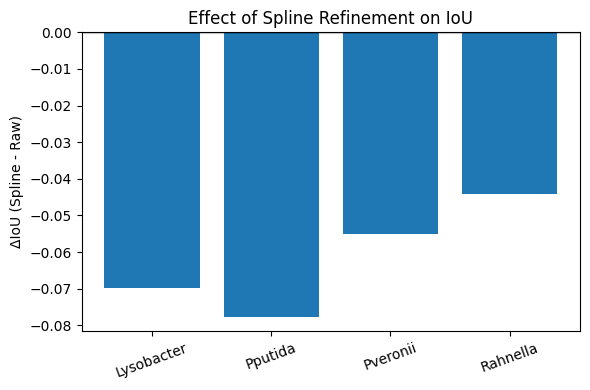

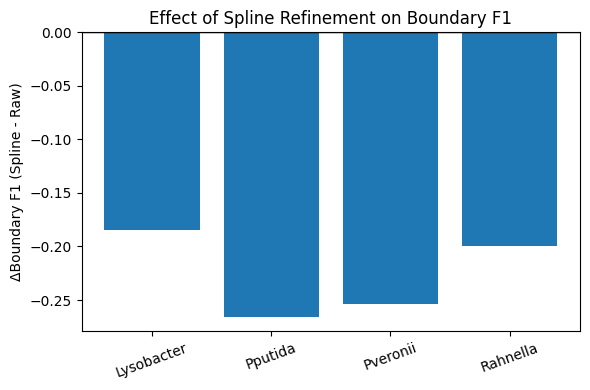

In [109]:
species_names = sorted(metrics_spline.keys())
delta_iou = []
delta_bf1 = []

for sp in species_names:
    vals = metrics_spline[sp]
    d_iou = np.mean(vals["iou_ref"]) - np.mean(vals["iou_raw"])
    d_bf1 = np.mean(vals["bf1_ref"]) - np.mean(vals["bf1_raw"])
    delta_iou.append(d_iou)
    delta_bf1.append(d_bf1)

x = np.arange(len(species_names))

plt.figure(figsize=(6,4))
plt.bar(x, delta_iou)
plt.axhline(0, color="black", linewidth=1)
plt.xticks(x, species_names, rotation=20)
plt.ylabel("ΔIoU (Spline - Raw)")
plt.title("Effect of Spline Refinement on IoU")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.bar(x, delta_bf1)
plt.axhline(0, color="black", linewidth=1)
plt.xticks(x, species_names, rotation=20)
plt.ylabel("ΔBoundary F1 (Spline - Raw)")
plt.title("Effect of Spline Refinement on Boundary F1")
plt.tight_layout()
plt.show()


Replace `some_library` with the actual name of the library you want to install.

In [110]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from skimage.measure import label as cc_label, find_contours
from skimage.draw import polygon
from scipy.interpolate import splprep, splev


In [111]:
def contour_to_spline_ctrl_points(inst_mask, num_ctrl=16):
    """
    inst_mask: [H,W] uint8 (0/1) for a single instance.
    Returns:
      ctrl_pts: [num_ctrl, 2] (row, col)
    """
    contours = find_contours(inst_mask, level=0.5)
    if not contours:
        return None

    # choose longest contour
    contour = max(contours, key=lambda c: c.shape[0])  # shape [N,2] (row, col)

    if contour.shape[0] < num_ctrl:
        # too few points, just pad or repeat
        idx = np.linspace(0, contour.shape[0]-1, num_ctrl).astype(int)
        ctrl_pts = contour[idx]
        return ctrl_pts

    # parametrize by arc-length
    d = np.sqrt(np.sum(np.diff(contour, axis=0)**2, axis=1))
    s = np.concatenate([[0], np.cumsum(d)])
    if s[-1] == 0:
        return None
    t = s / s[-1]  # normalize to [0,1]

    t_ctrl = np.linspace(0, 1, num_ctrl, endpoint=False)
    ctrl_rows = np.interp(t_ctrl, t, contour[:, 0])
    ctrl_cols = np.interp(t_ctrl, t, contour[:, 1])
    ctrl_pts = np.stack([ctrl_rows, ctrl_cols], axis=1)  # [num_ctrl, 2]
    return ctrl_pts


In [112]:
def build_splinedist_targets(mask, num_ctrl=16, min_area=10):
    """
    mask: [H,W] uint8 (0 or 255) GT instance segmentation (single class).
    Returns:
      obj_mask: [1,H,W] float32 (0/1) - objectness (same as binary mask)
      ctrl_offsets: [2*num_ctrl, H, W] float32 - dx,dy per control point
      valid_mask: [1,H,W] float32 (1 where offsets are valid, else 0)
    """
    H, W = mask.shape
    bin_mask = (mask > 0).astype(np.uint8)
    lbl = cc_label(bin_mask, connectivity=1)

    obj_mask = bin_mask.astype(np.float32)[None, ...]  # [1,H,W]
    ctrl_offsets = np.zeros((2 * num_ctrl, H, W), dtype=np.float32)
    valid_mask = np.zeros((1, H, W), dtype=np.float32)

    inst_ids = np.unique(lbl)
    inst_ids = inst_ids[inst_ids != 0]

    for inst_id in inst_ids:
        inst_mask = (lbl == inst_id).astype(np.uint8)
        if inst_mask.sum() < min_area:
            continue

        ctrl_pts = contour_to_spline_ctrl_points(inst_mask, num_ctrl=num_ctrl)
        if ctrl_pts is None:
            continue

        # coords of all pixels in this instance
        rr, cc = np.where(inst_mask > 0)

        # fill offsets for each pixel
        for k in range(num_ctrl):
            r_k, c_k = ctrl_pts[k]
            # offsets: control point coord - pixel coord
            ctrl_offsets[2*k,   rr, cc] = r_k - rr
            ctrl_offsets[2*k+1, rr, cc] = c_k - cc

        valid_mask[0, rr, cc] = 1.0

    return obj_mask, ctrl_offsets, valid_mask


In [115]:
num_ctrl = 16
spline_ds = STRackTemporalSplineDataset(ds, num_ctrl=num_ctrl)
spline_dl = DataLoader(spline_ds, batch_size=2, shuffle=True)


NameError: name 'STRackTemporalSplineDataset' is not defined

In [116]:
class STRackTemporalSplineDataset(Dataset):
    def __init__(self, base_ds, num_ctrl=16):
        """
        base_ds: your existing STRackTemporalFlowDataset
        """
        self.base_ds = base_ds
        self.num_ctrl = num_ctrl

    def __len__(self):
        return len(self.base_ds)

    def __getitem__(self, idx):
        base_item = self.base_ds[idx]
        x = base_item["input"]          # [C,H,W], float
        mask = base_item["mask"][0]     # [H,W], 0/1
        meta = base_item["meta"]

        mask_np = mask.cpu().numpy().astype(np.uint8) * 255

        obj_mask_np, ctrl_offsets_np, valid_mask_np = build_splinedist_targets(
            mask_np,
            num_ctrl=self.num_ctrl,
            min_area=10
        )

        obj_mask = torch.from_numpy(obj_mask_np).float()          # [1,H,W]
        ctrl_offsets = torch.from_numpy(ctrl_offsets_np).float()  # [2K,H,W]
        valid_mask = torch.from_numpy(valid_mask_np).float()      # [1,H,W]

        return {
            "input": x,
            "obj_mask": obj_mask,
            "ctrl_offsets": ctrl_offsets,
            "valid_mask": valid_mask,
            "meta": meta
        }


In [117]:
num_ctrl = 16
spline_ds = STRackTemporalSplineDataset(ds, num_ctrl=num_ctrl)
spline_dl = DataLoader(spline_ds, batch_size=2, shuffle=True)


In [118]:
batch = next(iter(spline_dl))

print("input:", batch["input"].shape)          # expect [B, C, H, W]
print("obj_mask:", batch["obj_mask"].shape)    # expect [B, 1, H, W]
print("ctrl_offsets:", batch["ctrl_offsets"].shape)  # expect [B, 2*num_ctrl, H, W]
print("valid_mask:", batch["valid_mask"].shape)      # expect [B, 1, H, W]
print("meta:", batch["meta"])


input: torch.Size([2, 13, 512, 512])
obj_mask: torch.Size([2, 1, 512, 512])
ctrl_offsets: torch.Size([2, 32, 512, 512])
valid_mask: torch.Size([2, 1, 512, 512])
meta: {'species': ['Pputida', 'Pveronii'], 'dataset': ['Time-lapse_dataset4', 'Time-lapse_dataset3'], 'position': tensor([5, 5]), 'time': tensor([11, 16])}


In [119]:
class SplineDistHead(nn.Module):
    def __init__(self, in_ch, num_ctrl=16):
        super().__init__()
        self.num_ctrl = num_ctrl
        out_ch = 1 + 2*num_ctrl   # 1 objness + 2*num_ctrl offsets

        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, in_ch, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_ch, out_ch, 1)
        )

    def forward(self, x):
        out = self.conv(x)
        obj_logit = out[:, :1]
        ctrl_offsets = out[:, 1:]
        return obj_logit, ctrl_offsets


In [120]:
class UNetTemporalFlow(nn.Module):
    ...
    def forward(self, x):
        feat = self.unet(x)  # [B,F,H,W]
        logits = self.final_conv(feat)
        return logits


In [121]:
class TemporalSplineDistNet(nn.Module):
    def __init__(self, backbone, feat_ch, num_ctrl=16):
        super().__init__()
        self.backbone = backbone                  # your UNet++ temporal model WITHOUT final conv
        self.head = SplineDistHead(feat_ch, num_ctrl)

    def forward(self, x):
        feat = self.backbone(x)
        obj_logit, ctrl_offsets = self.head(feat)
        return obj_logit, ctrl_offsets


In [122]:
def splinedist_loss(obj_logit, ctrl_pred, obj_gt, ctrl_gt, valid_mask, lambda_reg=1.0):
    # Objectness loss (same as segmentation)
    loss_obj = F.binary_cross_entropy_with_logits(obj_logit, obj_gt)

    # Control point regression loss
    diff = (ctrl_pred - ctrl_gt) * valid_mask   # mask out background pixels
    loss_reg = F.smooth_l1_loss(diff, torch.zeros_like(diff), reduction='sum')

    # Normalize by number of valid pixels
    denom = valid_mask.sum() * ctrl_gt.shape[1]  # each pixel has 2*K offsets
    if denom > 0:
        loss_reg = loss_reg / denom
    else:
        loss_reg = torch.tensor(0.0, device=obj_logit.device)

    return loss_obj + lambda_reg * loss_reg, loss_obj, loss_reg


In [123]:
model = TemporalSplineDistNet(backbone, feat_ch=64, num_ctrl=16).cuda()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

for epoch in range(20):
    total_loss = 0
    for batch in spline_dl:
        x = batch["input"].cuda()
        obj_gt = batch["obj_mask"].cuda()
        ctrl_gt = batch["ctrl_offsets"].cuda()
        valid_mask = batch["valid_mask"].cuda()

        obj_logit, ctrl_pred = model(x)

        loss, loss_obj, loss_reg = splinedist_loss(
            obj_logit, ctrl_pred, obj_gt, ctrl_gt, valid_mask
        )

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}: loss={total_loss:.4f}")


NameError: name 'backbone' is not defined

In [124]:
class UNetTemporalFlow(nn.Module):
    ...
    def forward(self, x):
        feat = self.unet(x)  # [B,F,H,W]
        logits = self.final_conv(feat)
        return logits


In [125]:
class TemporalSplineDistNet(nn.Module):
    def __init__(self, base_unet, feat_ch, num_ctrl=16):
        """
        base_unet: an instance of your UNetTemporalFlow
        feat_ch: number of channels in the last decoder feature map (output of base_unet.unet)
        """
        super().__init__()
        self.base_unet = base_unet
        self.head = SplineDistHead(feat_ch, num_ctrl)

    def forward(self, x):
        # use the internal UNet backbone, but skip final_conv
        feat = self.base_unet.unet(x)   # [B, feat_ch, H, W]
        obj_logit, ctrl_offsets = self.head(feat)
        return obj_logit, ctrl_offsets


In [126]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1. create your original UNetTemporalFlow
base_unet = UNetTemporalFlow(
    in_channels=13,      # whatever you used before
    window_size=5,       # if this is in your init
    num_classes=1,
    base_ch=32,          # or your actual base_ch
).to(device)

# 2. probe feature shape
with torch.no_grad():
    dummy = torch.randn(1, 13, 256, 256, device=device)  # [B,C,H,W]
    feat = base_unet.unet(dummy)                         # call internal UNet
    feat_ch = feat.shape[1]

print("Feature channels (feat_ch) =", feat_ch)


TypeError: UNetTemporalFlow.__init__() got an unexpected keyword argument 'in_channels'

Track-aware / motion-consistent segmentation loss

In [12]:
pkl_path = "/content/STRAck/models/temporal_unet_strack/data.pkl"

with open(pkl_path, "rb") as f:
    head = f.read(16)

print(head)




b'\x80\x02}q\x00(X\x0b\x00\x00\x00model'


In [13]:
!pip -q install joblib cloudpickle


In [19]:
import os

MODEL_DIR = "/content/STRAck/models/temporal_unet_strack"
PKL_PATH  = os.path.join(MODEL_DIR, "data.pkl")

print("MODEL_DIR exists:", os.path.isdir(MODEL_DIR))
print("data.pkl exists:", os.path.isfile(PKL_PATH))
print("data/ exists:", os.path.isdir(os.path.join(MODEL_DIR, "data")))




MODEL_DIR exists: True
data.pkl exists: True
data/ exists: True


In [23]:
import os, zipfile, torch

MODEL_DIR = "/content/STRAck/models/temporal_unet_strack"
ZIP_PATH  = "/content/temporal_unet_strack_ckpt_OK.zip"
TOP       = "temporal_unet_strack"   # top-level folder name inside zip

with zipfile.ZipFile(ZIP_PATH, "w", compression=zipfile.ZIP_DEFLATED) as z:
    for root, _, files in os.walk(MODEL_DIR):
        for fn in files:
            full = os.path.join(root, fn)
            rel  = os.path.relpath(full, MODEL_DIR)     # e.g. version, data/xxx
            arc  = f"{TOP}/{rel}"                       # IMPORTANT: put under subdir
            z.write(full, arcname=arc)

print("Wrote:", ZIP_PATH)

# quick verify
with zipfile.ZipFile(ZIP_PATH, "r") as z:
    names = z.namelist()
print("Zip entries sample:", names[:10])

# now load
ckpt = torch.load(ZIP_PATH, map_location="cpu", weights_only=False)
print("✅ Loaded type:", type(ckpt))
if isinstance(ckpt, dict):
    print("Keys:", list(ckpt.keys())[:50])



Wrote: /content/temporal_unet_strack_ckpt_OK.zip
Zip entries sample: ['temporal_unet_strack/data.pkl', 'temporal_unet_strack/.storage_alignment', 'temporal_unet_strack/.format_version', 'temporal_unet_strack/version', 'temporal_unet_strack/byteorder', 'temporal_unet_strack/.data/serialization_id', 'temporal_unet_strack/data/350', 'temporal_unet_strack/data/388', 'temporal_unet_strack/data/307', 'temporal_unet_strack/data/192']
✅ Loaded type: <class 'dict'>
Keys: ['model_state', 'optimizer_state', 'epoch', 'config']


In [24]:
import torch

def get_state_dict(ckpt):
    if isinstance(ckpt, dict):
        # raw state_dict
        if any(isinstance(k,str) and k.endswith(("weight","bias")) for k in ckpt.keys()):
            return ckpt
        # nested state_dict
        for k in ["model_state", "state_dict", "model", "net", "weights"]:
            if k in ckpt and isinstance(ckpt[k], dict):
                return ckpt[k]
    if hasattr(ckpt, "state_dict"):
        return ckpt.state_dict()
    return None

state = get_state_dict(ckpt)
print("state_dict found:", state is not None, "num_keys:", len(state) if state else None)

out_path = "/content/temporal_unet_strack_clean.pt"
torch.save({"model_state": state}, out_path)
print("✅ Saved clean checkpoint:", out_path)


state_dict found: True num_keys: 140
✅ Saved clean checkpoint: /content/temporal_unet_strack_clean.pt


In [25]:
import shutil, os
src = "/content/temporal_unet_strack_clean.pt"
dst = "/content/drive/MyDrive/STRAck_models/temporal_unet_strack_clean.pt"
os.makedirs(os.path.dirname(dst), exist_ok=True)
shutil.copy(src, dst)
print("Copied to:", dst)


Copied to: /content/drive/MyDrive/STRAck_models/temporal_unet_strack_clean.pt


In [34]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

ckpt_path = "/content/drive/MyDrive/STRAck_models/temporal_unet_strack_clean.pt"  # recommended
# or if not copied to Drive:
# ckpt_path = "/content/temporal_unet_strack_clean.pt"

model = UNetTemporalFlow(in_channels=13, window_size=5, num_classes=1, base_ch=32).to(device)

ckpt = torch.load(ckpt_path, map_location=device)
missing, unexpected = model.load_state_dict(ckpt["model_state"], strict=False)
print("Loaded. Missing:", len(missing), "Unexpected:", len(unexpected))

model.eval()


Device: cuda
Loaded. Missing: 0 Unexpected: 0


UNetTemporalFlow(
  (temporal_se): TemporalSE(
    (fc1): Linear(in_features=5, out_features=2, bias=True)
    (fc2): Linear(in_features=2, out_features=5, bias=True)
  )
  (enc1): ConvBlock(
    (conv): Sequential(
      (0): Conv2d(13, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc2): ConvBlock(
    (conv): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), str

In [40]:
import os
import torch
import numpy as np
from torch.utils.data import Dataset
from PIL import Image
import cv2
import re

class STRackTemporalDataset(Dataset):
    def __init__(self, root_dir, species, window_size=5):
        self.root_dir = root_dir
        self.species = species
        self.window = window_size
        self.samples = []

        for sp in species:
            sp_dir = os.path.join(root_dir, sp, sp)
            for dset in os.listdir(sp_dir):
                if not dset.startswith("Time-lapse"):
                    continue
                dpath = os.path.join(sp_dir, dset)
                img_dir = os.path.join(dpath, "raw_images")
                msk_dir = os.path.join(dpath, "manual_segmentation_masks")

                imgs = sorted(os.listdir(img_dir))
                masks = {self._time_id(f): f for f in os.listdir(msk_dir)}

                times = sorted([self._time_id(f) for f in imgs])
                for i in range(len(times)):
                    t = times[i]
                    if t not in masks:
                        continue
                    if i < window_size//2 or i >= len(times)-window_size//2:
                        continue

                    self.samples.append({
                        "species": sp,
                        "dataset": dset,
                        "img_dir": img_dir,
                        "msk_dir": msk_dir,
                        "time": t,
                        "times": times
                    })

        print("Total samples:", len(self.samples))

    def _time_id(self, fname):
        return int(re.findall(r"time(\d+)", fname)[0])

    def __len__(self):
        return len(self.samples)

    def _load_img(self, path):
        img = Image.open(path)
        arr = np.array(img, dtype=np.float32)
        arr = (arr - arr.min()) / (arr.max() - arr.min() + 1e-6)
        return arr

    def __getitem__(self, idx):
        s = self.samples[idx]
        img_dir, msk_dir = s["img_dir"], s["msk_dir"]
        t = s["time"]
        times = s["times"]

        mid = times.index(t)
        half = self.window // 2
        win_times = times[mid-half:mid+half+1]

        frames = []
        for wt in win_times:
            fname = [f for f in os.listdir(img_dir) if f"time{wt:04d}" in f][0]
            frames.append(self._load_img(os.path.join(img_dir, fname)))

        frames = np.stack(frames, axis=0)  # [5,H,W]

        # optical flow between consecutive frames
        flows = []
        for i in range(len(frames)-1):
            f1 = (frames[i] * 255).astype(np.uint8)
            f2 = (frames[i+1] * 255).astype(np.uint8)
            flow = cv2.calcOpticalFlowFarneback(
                f1, f2, None,
                pyr_scale=0.5, levels=3, winsize=21,
                iterations=3, poly_n=5, poly_sigma=1.2, flags=0
            )
            flows.append(flow.transpose(2,0,1))  # [2,H,W]

        flows = np.concatenate(flows, axis=0)  # [8,H,W]

        x = np.concatenate([frames, flows], axis=0)  # [13,H,W]

        mname = [f for f in os.listdir(msk_dir) if f"time{t:04d}" in f][0]
        mask = np.array(Image.open(os.path.join(msk_dir, mname)), dtype=np.float32)
        mask = (mask > 0).astype(np.float32)[None]

        return {
            "input": torch.tensor(x, dtype=torch.float32),
            "mask": torch.tensor(mask, dtype=torch.float32),
            "meta": {
                "species": s["species"],
                "dataset": s["dataset"],
                "time": t
            }
        }


In [42]:
ds = STRackTemporalDataset(
    root_dir="/content/STRAck",
    species=["Lysobacter", "Pputida", "Pveronii", "Rahnella"],
    window_size=5
)

print("Dataset length:", len(ds))


Total samples: 240
Dataset length: 240


In [43]:
model.eval()
with torch.no_grad():
    sample = ds[0]
    x = sample["input"].unsqueeze(0).to(device)
    out = model(x)

print("Output:", out.shape, out.min().item(), out.max().item())


Output: torch.Size([1, 1, 512, 512]) -6.488112926483154 9.28360366821289


In [46]:
import numpy as np
import matplotlib.pyplot as plt

def to_hw(a):
    a = np.array(a)
    a = np.squeeze(a)
    # if still not 2D, try last-resort reshape for 512x512
    if a.ndim == 1 and a.size == 512*512:
        a = a.reshape(512, 512)
    return a

def show_triplet(img, gt, pred, title=""):
    img  = to_hw(img)
    gt   = to_hw(gt)
    pred = to_hw(pred)

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(img, cmap="gray")
    axs[0].set_title("Original (center)")
    axs[0].axis("off")

    axs[1].imshow(img, cmap="gray")
    axs[1].imshow(gt, alpha=0.4)
    axs[1].set_title(f"GT overlay ({gt.shape})")
    axs[1].axis("off")

    axs[2].imshow(img, cmap="gray")
    axs[2].imshow(pred, alpha=0.4)
    axs[2].set_title(f"Pred overlay ({pred.shape})")
    axs[2].axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()



In [48]:
import numpy as np
import torch

def inspect_one_species(ds, model, species_name, n_frames=6, thresh=0.5):
    model.eval()
    count = 0

    for i in range(len(ds)):
        item = ds[i]
        if item["meta"]["species"] != species_name:
            continue

        x = item["input"].unsqueeze(0).to(device)   # [1,13,H,W]

        img = item["input"].cpu().numpy()[2]         # center frame [H,W]
        y   = np.squeeze(item["mask"].cpu().numpy()) # GT [H,W] (robust)

        with torch.no_grad():
            logits = model(x)[0,0].cpu().numpy()
            prob = 1 / (1 + np.exp(-logits))
            pred = (prob > thresh).astype(np.float32)

        title = f"{species_name} | {item['meta']['dataset']} | time={item['meta']['time']}"
        show_triplet(img, y, pred, title=title)

        count += 1
        if count >= n_frames:
            break



In [49]:
species_list = ["Lysobacter", "Pputida", "Pveronii", "Rahnella"]
for sp in species_list:
    print("====", sp, "====")
    inspect_one_species(ds, model, sp, n_frames=6, thresh=0.5)


Output hidden; open in https://colab.research.google.com to view.

track-aware motion-consistency fine-tuning

In [50]:
import random
from collections import defaultdict

def build_pairs(ds):
    buckets = defaultdict(list)
    for i in range(len(ds)):
        m = ds[i]["meta"]
        key = (m["species"], m["dataset"])
        buckets[key].append((m["time"], i))
    pairs = []
    for key, lst in buckets.items():
        lst.sort(key=lambda x: x[0])
        for k in range(len(lst)-1):
            pairs.append((lst[k][1], lst[k+1][1]))
    return pairs

pairs = build_pairs(ds)
print("Consecutive pairs:", len(pairs))


Consecutive pairs: 220


In [51]:
import numpy as np
import cv2
import torch
import torch.nn.functional as F

def farneback_flow(img_t, img_tp1):
    """
    img_t/img_tp1: [B,1,H,W] torch float in [0,1]
    returns flow: [B,2,H,W] torch float (dx,dy) pixels
    """
    B, _, H, W = img_t.shape
    flows = []
    it = img_t.detach().cpu().numpy()
    it1 = img_tp1.detach().cpu().numpy()

    for b in range(B):
        a = (it[b,0] * 255).astype(np.uint8)
        bimg = (it1[b,0] * 255).astype(np.uint8)
        flow = cv2.calcOpticalFlowFarneback(
            a, bimg, None,
            pyr_scale=0.5, levels=3, winsize=21,
            iterations=3, poly_n=5, poly_sigma=1.2, flags=0
        )  # [H,W,2] dx,dy
        flows.append(flow.transpose(2,0,1))  # [2,H,W]

    return torch.from_numpy(np.stack(flows)).float().to(img_t.device)

def warp_prob(prob, flow):
    """
    prob: [B,1,H,W] in [0,1]
    flow: [B,2,H,W] dx,dy pixels mapping t -> t+1 coordinates
    """
    B, _, H, W = prob.shape
    device = prob.device

    yy, xx = torch.meshgrid(
        torch.arange(H, device=device),
        torch.arange(W, device=device),
        indexing="ij"
    )
    xx = xx.float()[None,None]  # [1,1,H,W]
    yy = yy.float()[None,None]

    dx = flow[:,0:1]
    dy = flow[:,1:2]

    x2 = xx + dx
    y2 = yy + dy

    grid_x = 2.0 * (x2 / max(W-1,1)) - 1.0
    grid_y = 2.0 * (y2 / max(H-1,1)) - 1.0
    grid = torch.cat([grid_x, grid_y], dim=1).permute(0,2,3,1)  # [B,H,W,2]

    return F.grid_sample(prob, grid, mode="bilinear", padding_mode="border", align_corners=True)

def motion_consistency_loss(logits_t, logits_tp1, x_t, x_tp1, w=0.2):
    """
    logits_t/logits_tp1: [B,1,H,W]
    x_t/x_tp1: [B,13,H,W] inputs (we use center frame channel=2)
    """
    prob_t   = torch.sigmoid(logits_t)
    prob_tp1 = torch.sigmoid(logits_tp1)

    img_t   = x_t[:, 2:3]    # center frame
    img_tp1 = x_tp1[:, 2:3]

    flow = farneback_flow(img_t, img_tp1)  # t -> t+1
    warped = warp_prob(prob_t, flow)
    return w * F.l1_loss(warped, prob_tp1.detach())


In [52]:
import copy
import torch

model_before = model  # baseline already loaded
model_after = copy.deepcopy(model_before).to(device)

lr = 2e-5        # small LR = safe fine-tune
w_tc = 0.2       # TC strength (0.05–0.3)
epochs = 4       # 3–6 is enough to show effect
batch_pairs = 2  # keep small (flow is CPU-ish)

optim = torch.optim.Adam(model_after.parameters(), lr=lr)

model_after.train()
for ep in range(epochs):
    random.shuffle(pairs)
    total = 0.0

    for k in range(0, len(pairs), batch_pairs):
        batch = pairs[k:k+batch_pairs]
        xs_t, ys_t, xs_tp1, ys_tp1 = [], [], [], []

        for (i, j) in batch:
            a = ds[i]; b = ds[j]
            xs_t.append(a["input"])
            ys_t.append(a["mask"])
            xs_tp1.append(b["input"])
            ys_tp1.append(b["mask"])

        x_t   = torch.stack(xs_t).to(device)     # [B,13,H,W]
        y_t   = torch.stack(ys_t).to(device)     # [B,1,H,W]
        x_tp1 = torch.stack(xs_tp1).to(device)
        y_tp1 = torch.stack(ys_tp1).to(device)

        # (optional but helps like your training): FG crop
        x_t, y_t = random_fg_crops(x_t, y_t, crop_size=256)
        x_tp1, y_tp1 = random_fg_crops(x_tp1, y_tp1, crop_size=256)

        optim.zero_grad()
        lt = model_after(x_t)
        ltp1 = model_after(x_tp1)

        loss_sup = bce_dice_loss(lt, y_t) + bce_dice_loss(ltp1, y_tp1)
        loss_tc  = motion_consistency_loss(lt, ltp1, x_t, x_tp1, w=w_tc)

        loss = loss_sup + loss_tc
        loss.backward()
        optim.step()

        total += loss.item()

    print(f"TC Fine-tune Epoch [{ep+1}/{epochs}] Loss: {total/max(1,(len(pairs)//batch_pairs)):.4f}")


TC Fine-tune Epoch [1/4] Loss: 0.4748
TC Fine-tune Epoch [2/4] Loss: 0.4564
TC Fine-tune Epoch [3/4] Loss: 0.4404
TC Fine-tune Epoch [4/4] Loss: 0.4308


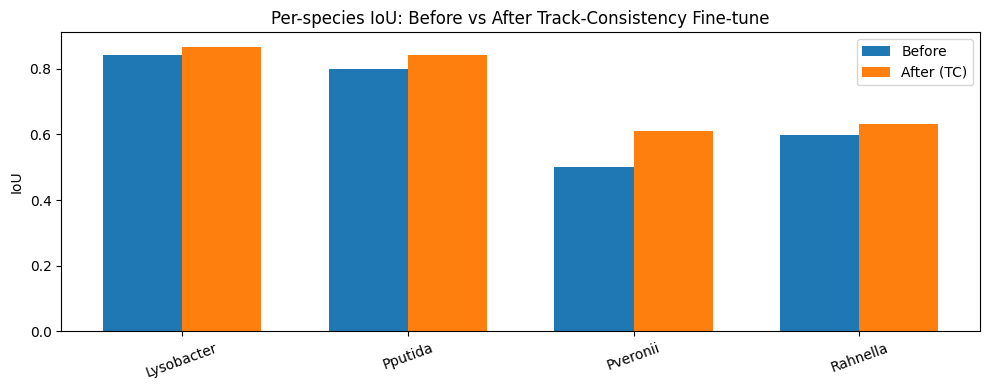

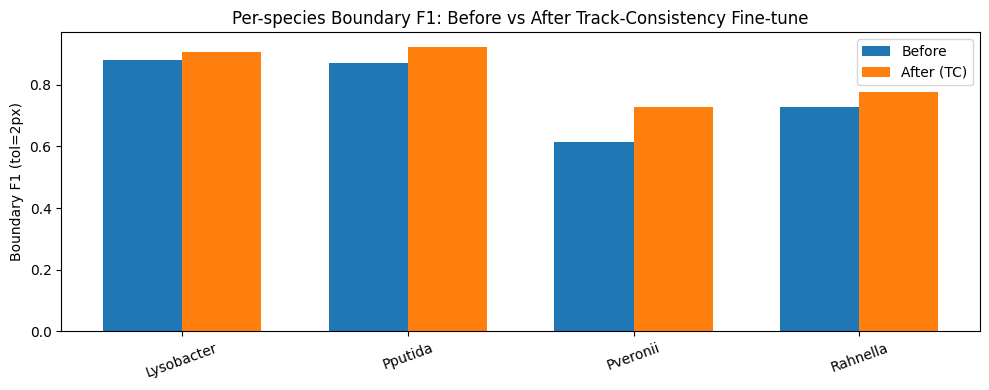

Before: {'Lysobacter': {'iou': 0.8424037866527341, 'bf1': 0.8802785458604638}, 'Pputida': {'iou': 0.7990665219326174, 'bf1': 0.8695005775610589}, 'Pveronii': {'iou': 0.4994671024216489, 'bf1': 0.6140292663458404}, 'Rahnella': {'iou': 0.5991017046051548, 'bf1': 0.7279979985028605}}
After : {'Lysobacter': {'iou': 0.8678542750466726, 'bf1': 0.9077305735025574}, 'Pputida': {'iou': 0.842097339651457, 'bf1': 0.9240303727064145}, 'Pveronii': {'iou': 0.6104074585167355, 'bf1': 0.729430237713441}, 'Rahnella': {'iou': 0.6306186982461629, 'bf1': 0.7763598860073538}}


In [53]:
import numpy as np
import matplotlib.pyplot as plt

def iou_bin(pred, gt, eps=1e-6):
    pred = pred.astype(bool); gt = gt.astype(bool)
    inter = (pred & gt).sum()
    union = (pred | gt).sum()
    return (inter + eps) / (union + eps)

def boundary_map(mask):
    # morphological edge (fast, robust)
    m = (mask.astype(np.uint8) * 255)
    k = np.ones((3,3), np.uint8)
    grad = cv2.morphologyEx(m, cv2.MORPH_GRADIENT, k)
    return (grad > 0).astype(np.uint8)

def boundary_f1(pred, gt, tol=2):
    # tolerant boundary matching via dilation
    pb = boundary_map(pred)
    gb = boundary_map(gt)

    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*tol+1, 2*tol+1))
    pb_d = cv2.dilate(pb, k)
    gb_d = cv2.dilate(gb, k)

    tp_p = (pb & gb_d).sum()
    tp_g = (gb & pb_d).sum()

    prec = tp_p / (pb.sum() + 1e-6)
    rec  = tp_g / (gb.sum() + 1e-6)
    return 2*prec*rec/(prec+rec+1e-6)

def eval_by_species(ds, model, thresh=0.5, max_per_species=40):
    model.eval()
    stats = {}
    counts = {}
    with torch.no_grad():
        for i in range(len(ds)):
            sp = ds[i]["meta"]["species"]
            counts.setdefault(sp, 0)
            if counts[sp] >= max_per_species:
                continue

            item = ds[i]
            x = item["input"].unsqueeze(0).to(device)
            gt = np.squeeze(item["mask"].cpu().numpy()) > 0

            logits = model(x)[0,0].cpu().numpy()
            prob = 1/(1+np.exp(-logits))
            pred = (prob > thresh)

            stats.setdefault(sp, {"iou": [], "bf1": []})
            stats[sp]["iou"].append(iou_bin(pred, gt))
            stats[sp]["bf1"].append(boundary_f1(pred.astype(np.uint8), gt.astype(np.uint8), tol=2))
            counts[sp] += 1

    # mean
    out = {sp: {"iou": float(np.mean(v["iou"])), "bf1": float(np.mean(v["bf1"]))} for sp, v in stats.items()}
    return out

before = eval_by_species(ds, model_before, thresh=0.5, max_per_species=40)
after  = eval_by_species(ds, model_after,  thresh=0.5, max_per_species=40)

species = sorted(before.keys())
iou_b = [before[s]["iou"] for s in species]
iou_a = [after[s]["iou"]  for s in species]
bf_b  = [before[s]["bf1"] for s in species]
bf_a  = [after[s]["bf1"]  for s in species]

# Plot IoU before/after
x = np.arange(len(species))
w = 0.35

plt.figure(figsize=(10,4))
plt.bar(x - w/2, iou_b, width=w, label="Before")
plt.bar(x + w/2, iou_a, width=w, label="After (TC)")
plt.xticks(x, species, rotation=20)
plt.ylabel("IoU")
plt.title("Per-species IoU: Before vs After Track-Consistency Fine-tune")
plt.legend()
plt.tight_layout()
plt.show()

# Plot Boundary F1 before/after
plt.figure(figsize=(10,4))
plt.bar(x - w/2, bf_b, width=w, label="Before")
plt.bar(x + w/2, bf_a, width=w, label="After (TC)")
plt.xticks(x, species, rotation=20)
plt.ylabel("Boundary F1 (tol=2px)")
plt.title("Per-species Boundary F1: Before vs After Track-Consistency Fine-tune")
plt.legend()
plt.tight_layout()
plt.show()

print("Before:", before)
print("After :", after)


In [54]:
import os, torch
out = "/content/drive/MyDrive/STRAck_models/temporal_unet_TC_finetuned.pt"
os.makedirs(os.path.dirname(out), exist_ok=True)
torch.save({"model_state": model_after.state_dict()}, out)
print("Saved:", out)


Saved: /content/drive/MyDrive/STRAck_models/temporal_unet_TC_finetuned.pt


GROWTH RATE PREDICTION

In [55]:
import numpy as np
import cv2

def count_cells_cc(mask_bin, min_area=30):
    """
    mask_bin: (H,W) {0,1} or bool
    returns: (count, areas_list)
    """
    m = (mask_bin.astype(np.uint8) * 255)
    num, labels, stats, _ = cv2.connectedComponentsWithStats((m > 0).astype(np.uint8), connectivity=8)

    # stats: [label, x, y, w, h, area], label 0 is background
    areas = stats[1:, cv2.CC_STAT_AREA]
    keep = areas >= min_area
    areas_kept = areas[keep].tolist()
    return int(np.sum(keep)), areas_kept


In [56]:
def get_sequence_indices(ds, species, dataset):
    idxs = []
    for i in range(len(ds)):
        m = ds[i]["meta"]
        if m["species"] == species and m["dataset"] == dataset:
            idxs.append((m["time"], i))
    idxs.sort(key=lambda x: x[0])
    return idxs  # list of (time, idx)


In [57]:
import torch

def sequence_counts_and_area(ds, model, species, dataset, thresh=0.5, min_area=30, max_frames=None):
    seq = get_sequence_indices(ds, species, dataset)
    if max_frames is not None:
        seq = seq[:max_frames]

    times = []
    gt_count, gt_area = [], []
    pr_count, pr_area = [], []

    model.eval()
    with torch.no_grad():
        for t, idx in seq:
            item = ds[idx]
            x = item["input"].unsqueeze(0).to(device)         # [1,13,H,W]
            gt = np.squeeze(item["mask"].cpu().numpy()) > 0   # (H,W)

            logits = model(x)[0,0].cpu().numpy()
            prob = 1/(1+np.exp(-logits))
            pred = prob > thresh

            c_gt, _ = count_cells_cc(gt,   min_area=min_area)
            c_pr, _ = count_cells_cc(pred, min_area=min_area)

            times.append(t)
            gt_count.append(c_gt)
            pr_count.append(c_pr)

            gt_area.append(float(gt.sum()))
            pr_area.append(float(pred.sum()))

    return np.array(times), np.array(gt_count), np.array(pr_count), np.array(gt_area), np.array(pr_area)


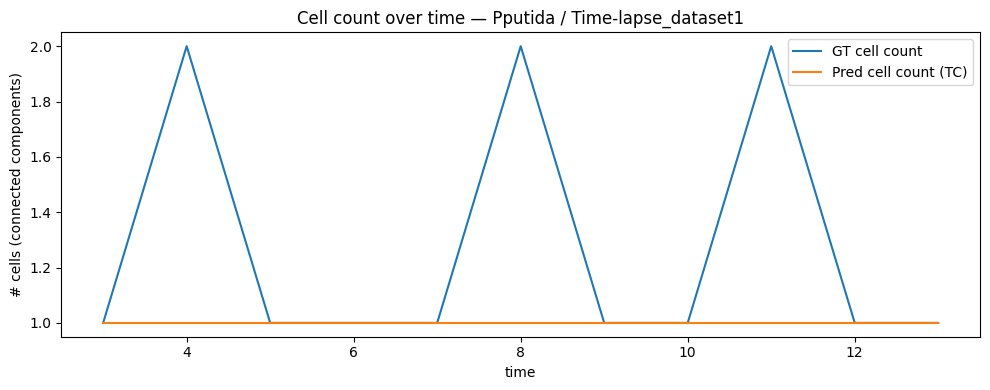

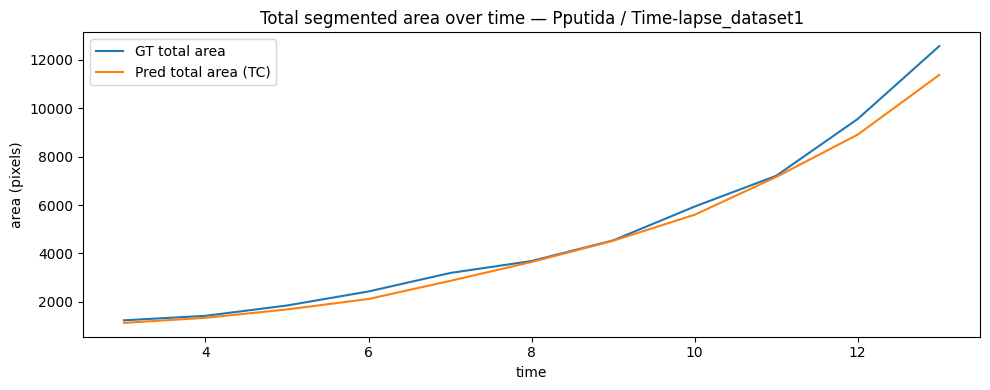

In [58]:
import matplotlib.pyplot as plt

species = "Pputida"
dataset = "Time-lapse_dataset1"

times, gtC, prC, gtA, prA = sequence_counts_and_area(
    ds, model_after, species, dataset,
    thresh=0.5, min_area=30, max_frames=60
)

plt.figure(figsize=(10,4))
plt.plot(times, gtC, label="GT cell count")
plt.plot(times, prC, label="Pred cell count (TC)")
plt.title(f"Cell count over time — {species} / {dataset}")
plt.xlabel("time")
plt.ylabel("# cells (connected components)")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,4))
plt.plot(times, gtA, label="GT total area")
plt.plot(times, prA, label="Pred total area (TC)")
plt.title(f"Total segmented area over time — {species} / {dataset}")
plt.xlabel("time")
plt.ylabel("area (pixels)")
plt.legend()
plt.tight_layout()
plt.show()


In [59]:
import cv2
import numpy as np
import torch


In [60]:
def overlay_mask(img, mask, color):
    """
    img: (H,W) float [0,1]
    mask: (H,W) bool
    color: (B,G,R)
    """
    img_rgb = np.stack([img, img, img], axis=-1)
    overlay = img_rgb.copy()
    overlay[mask] = np.array(color) / 255.0
    return (0.6*img_rgb + 0.4*overlay)


In [61]:
def make_sequence_video(
    ds,
    model,
    species,
    dataset,
    out_path,
    thresh=0.5,
    min_area=30,
    fps=3,
    max_frames=None
):
    seq = get_sequence_indices(ds, species, dataset)
    if max_frames:
        seq = seq[:max_frames]

    model.eval()

    H, W = 512, 512
    canvas_w = W * 3
    canvas_h = H

    writer = cv2.VideoWriter(
        out_path,
        cv2.VideoWriter_fourcc(*"mp4v"),
        fps,
        (canvas_w, canvas_h)
    )

    with torch.no_grad():
        for t, idx in seq:
            item = ds[idx]

            x = item["input"].unsqueeze(0).to(device)
            img = item["input"][2].cpu().numpy()          # center frame
            gt  = np.squeeze(item["mask"].cpu().numpy()) > 0

            logits = model(x)[0,0].cpu().numpy()
            prob = 1/(1+np.exp(-logits))
            pred = prob > thresh

            gt_c, _ = count_cells_cc(gt, min_area)
            pr_c, _ = count_cells_cc(pred, min_area)

            gt_a = int(gt.sum())
            pr_a = int(pred.sum())

            left  = overlay_mask(img, np.zeros_like(gt), (0,0,0))
            mid   = overlay_mask(img, gt,   (0,255,0))
            right = overlay_mask(img, pred, (255,165,0))

            # text overlays
            cv2.putText(mid,   f"GT | cells={gt_c} area={gt_a}", (10,30),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2)
            cv2.putText(right, f"Pred | cells={pr_c} area={pr_a}", (10,30),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,165,0), 2)
            cv2.putText(left,  f"time={t}", (10,30),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2)

            frame = np.concatenate([left, mid, right], axis=1)
            frame = (frame * 255).astype(np.uint8)
            frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

            writer.write(frame)

    writer.release()
    print("Saved video:", out_path)


In [81]:

out_video = "/content/Lysobacter_TC_growth_demo.mp4"
make_sequence_video(
    ds,
    model_after,                         # TC-finetuned model
    species="Lysobacter",
    dataset="Time-lapse_dataset1",
    out_path=out_video,
    thresh=0.5,
    fps=3,
    max_frames=30
)


Saved video: /content/Lysobacter_TC_growth_demo.mp4


In [ ]:
import numpy as np, cv2

def count_cells_watershed(mask_bin, min_area=30):
    """
    mask_bin: (H,W) bool
    Returns: count, instance_labels (H,W int)
    """
    m = (mask_bin.astype(np.uint8) * 255)

    # clean small noise
    m = cv2.morphologyEx(m, cv2.MORPH_OPEN, np.ones((3,3), np.uint8), iterations=1)

    # distance transform
    dist = cv2.distanceTransform((m > 0).astype(np.uint8), cv2.DIST_L2, 5)
    dist_norm = cv2.normalize(dist, None, 0, 1.0, cv2.NORM_MINMAX)

    # sure foreground peaks
    _, sure_fg = cv2.threshold(dist_norm, 0.35, 1.0, cv2.THRESH_BINARY)
    sure_fg = (sure_fg * 255).astype(np.uint8)

    # markers
    num_markers, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[m == 0] = 0

    # watershed needs 3-channel image
    img3 = cv2.cvtColor((m).astype(np.uint8), cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(img3, markers)

    # markers: -1 boundaries, 1 background, 2..K instances
    inst = markers.copy()
    inst[inst <= 1] = 0

    # filter tiny instances
    kept = 0
    out = np.zeros_like(inst, dtype=np.int32)
    for lab in np.unique(inst):
        if lab == 0:
            continue
        area = (inst == lab).sum()
        if area >= min_area:
            kept += 1
            out[inst == lab] = kept

    return kept, out


In [65]:
import numpy as np, cv2

def count_cells_watershed(mask_bin, min_area=30):
    """
    mask_bin: (H,W) bool
    Returns: count, instance_labels (H,W int)
    """
    m = (mask_bin.astype(np.uint8) * 255)

    # clean small noise
    m = cv2.morphologyEx(m, cv2.MORPH_OPEN, np.ones((3,3), np.uint8), iterations=1)

    # distance transform
    dist = cv2.distanceTransform((m > 0).astype(np.uint8), cv2.DIST_L2, 5)
    dist_norm = cv2.normalize(dist, None, 0, 1.0, cv2.NORM_MINMAX)

    # sure foreground peaks
    _, sure_fg = cv2.threshold(dist_norm, 0.35, 1.0, cv2.THRESH_BINARY)
    sure_fg = (sure_fg * 255).astype(np.uint8)

    # markers
    num_markers, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[m == 0] = 0

    # watershed needs 3-channel image
    img3 = cv2.cvtColor((m).astype(np.uint8), cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(img3, markers)

    # markers: -1 boundaries, 1 background, 2..K instances
    inst = markers.copy()
    inst[inst <= 1] = 0

    # filter tiny instances
    kept = 0
    out = np.zeros_like(inst, dtype=np.int32)
    for lab in np.unique(inst):
        if lab == 0:
            continue
        area = (inst == lab).sum()
        if area >= min_area:
            kept += 1
            out[inst == lab] = kept

    return kept, out


In [71]:
ckpt_path = "/content/drive/MyDrive/STRAck_models/temporal_unet_TC_finetuned.pt"
ckpt = torch.load(ckpt_path, map_location=device)

model_after = UNetTemporalFlow(in_channels=13, window_size=5, num_classes=1, base_ch=32).to(device)
model_after.load_state_dict(ckpt["model_state"])
model_after.eval()
print("✅ TC model restored with return_feat support")


✅ TC model restored with return_feat support


In [4]:
import torch.nn.functional as F
import torch

class UNetTemporalFlow(nn.Module):
    # keep your __init__ exactly as you already have

    def forward(self, x, return_feat=False):
        B, C, H, W = x.shape
        x_frames = x[:, :self.frame_ch]          # [B,5,H,W]
        x_flows  = x[:, self.frame_ch:]          # [B,8,H,W]

        x_frames = self.temporal_se(x_frames)
        x0 = torch.cat([x_frames, x_flows], dim=1)

        e1 = self.enc1(x0)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        e4 = self.enc4(p3)
        p4 = self.pool4(e4)

        b = self.bottleneck(p4)   # << FEATURE MAP FOR GROWTH HEAD

        d4 = self.up4(b)
        if d4.shape[-2:] != e4.shape[-2:]:
            d4 = F.interpolate(d4, size=e4.shape[-2:], mode="bilinear", align_corners=False)
        d4 = self.dec4(torch.cat([d4, e4], dim=1))

        d3 = self.up3(d4)
        if d3.shape[-2:] != e3.shape[-2:]:
            d3 = F.interpolate(d3, size=e3.shape[-2:], mode="bilinear", align_corners=False)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))

        d2 = self.up2(d3)
        if d2.shape[-2:] != e2.shape[-2:]:
            d2 = F.interpolate(d2, size=e2.shape[-2:], mode="bilinear", align_corners=False)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))

        d1 = self.up1(d2)
        if d1.shape[-2:] != e1.shape[-2:]:
            d1 = F.interpolate(d1, size=e1.shape[-2:], mode="bilinear", align_corners=False)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        out = self.out_conv(d1)

        if return_feat:
            return out, b
        return out


In [76]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SegWithGrowthHeadHook(nn.Module):
    def __init__(self, seg_model, bottleneck_module, bottleneck_ch=512):
        super().__init__()
        self.seg = seg_model
        self._feat = None

        # hook to capture bottleneck output
        def _hook(mod, inp, out):
            self._feat = out
        self._h = bottleneck_module.register_forward_hook(_hook)

        self.growth = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(bottleneck_ch, bottleneck_ch // 4),
            nn.ReLU(inplace=True),
            nn.Linear(bottleneck_ch // 4, 1)
        )

    def forward(self, x):
        logits = self.seg(x)            # normal forward (no return_feat)
        feat = self._feat               # grabbed by hook
        if feat is None:
            raise RuntimeError("Hook did not capture bottleneck features. Check the module passed in.")
        g = self.growth(feat)
        return logits, g

    def close(self):
        # optional: remove hook cleanly
        self._h.remove()


In [77]:
mt_model = SegWithGrowthHeadHook(
    seg_model=model_after.to(device),
    bottleneck_module=model_after.bottleneck,
    bottleneck_ch=512
).to(device)


In [78]:
mt_model.eval()
with torch.no_grad():
    x = ds[0]["input"].unsqueeze(0).to(device)
    logits, g = mt_model(x)

print("logits:", logits.shape)   # [1,1,512,512]
print("growth:", float(g.item()))


logits: torch.Size([1, 1, 512, 512])
growth: -0.06816674023866653


In [79]:
import random
import torch.nn.functional as F

# freeze segmentation backbone so only growth learns first
for p in mt_model.seg.parameters():
    p.requires_grad = False
for p in mt_model.growth.parameters():
    p.requires_grad = True

opt = torch.optim.Adam(mt_model.growth.parameters(), lr=1e-4)

def gt_growth(y_t, y_tp1, eps=1e-6, clip=0.5):
    A_t = y_t.sum(dim=(2,3))   # [B,1]
    A_n = y_tp1.sum(dim=(2,3))
    g = (A_n - A_t) / (A_t + eps)
    return torch.clamp(g, -clip, clip)

epochs = 6
pair_bs = 4

mt_model.train()
for ep in range(epochs):
    random.shuffle(pairs)
    tot = 0.0

    for k in range(0, len(pairs), pair_bs):
        batch = pairs[k:k+pair_bs]
        xs_t, ys_t, ys_n = [], [], []

        for i, j in batch:
            xs_t.append(ds[i]["input"])
            ys_t.append(ds[i]["mask"])
            ys_n.append(ds[j]["mask"])

        x_t = torch.stack(xs_t).to(device)
        y_t = torch.stack(ys_t).to(device)
        y_n = torch.stack(ys_n).to(device)

        _, g_pred = mt_model(x_t)
        g_gt = gt_growth(y_t, y_n)

        loss = F.smooth_l1_loss(g_pred, g_gt)

        opt.zero_grad()
        loss.backward()
        opt.step()
        tot += loss.item()

    print(f"[GrowthHead ep {ep+1}/{epochs}] loss={tot/max(1,(len(pairs)//pair_bs)):.4f}")


[GrowthHead ep 1/6] loss=0.0085
[GrowthHead ep 2/6] loss=0.0056
[GrowthHead ep 3/6] loss=0.0054
[GrowthHead ep 4/6] loss=0.0055
[GrowthHead ep 5/6] loss=0.0057
[GrowthHead ep 6/6] loss=0.0053


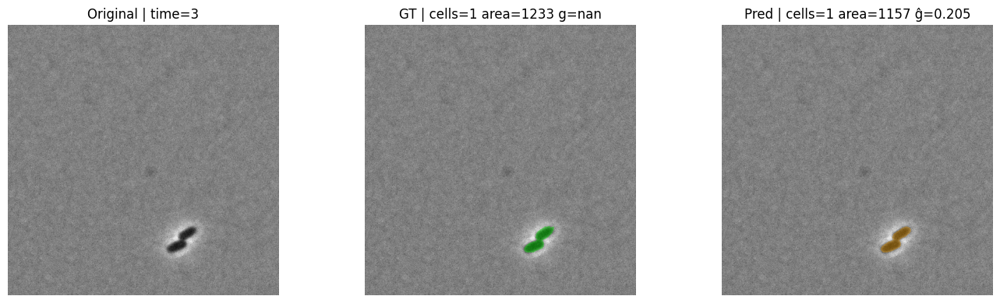

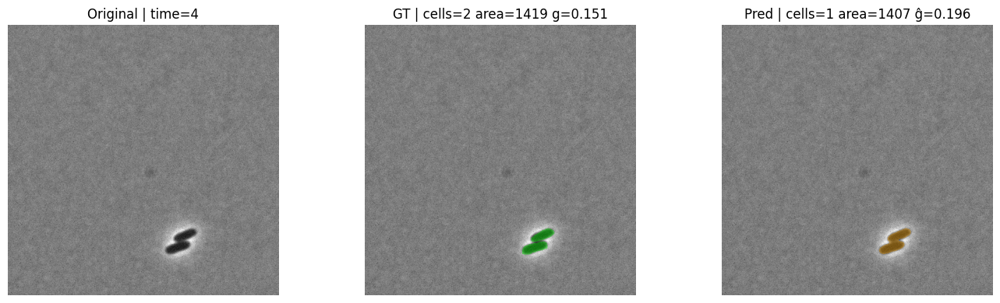

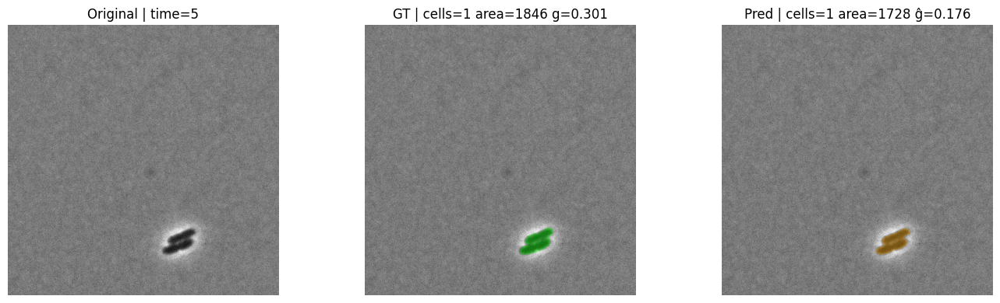

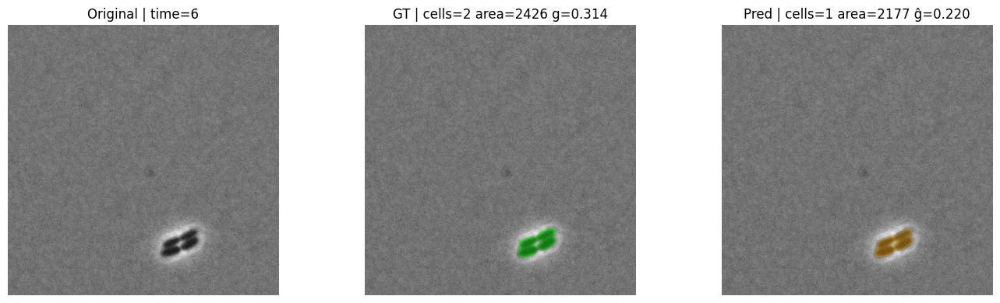

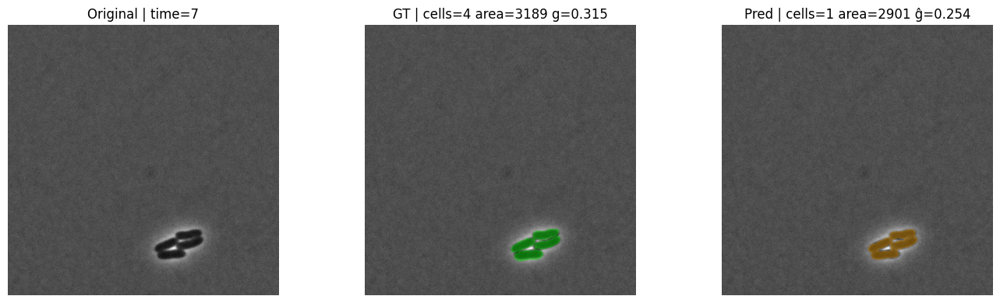

...

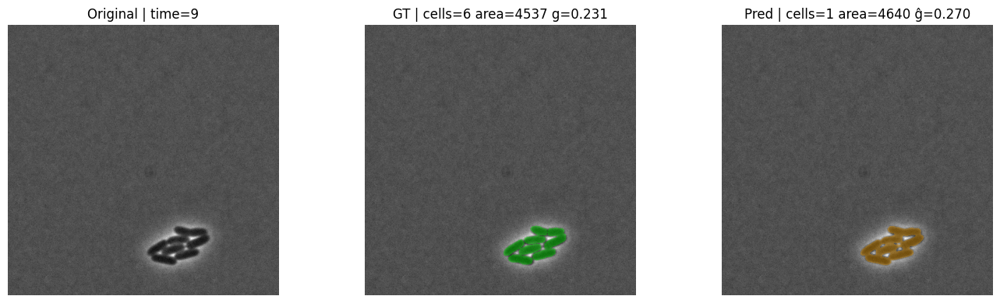

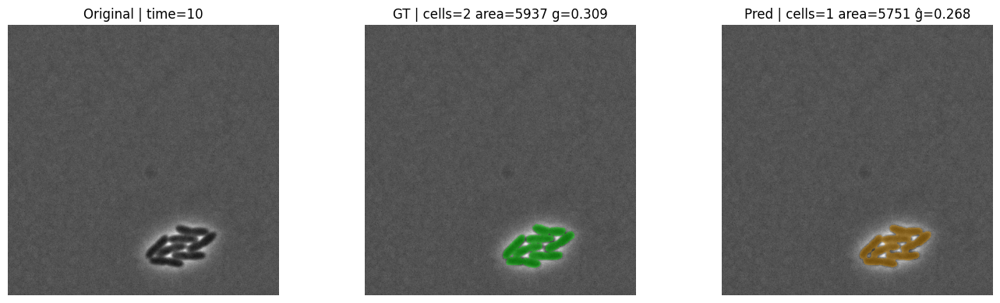

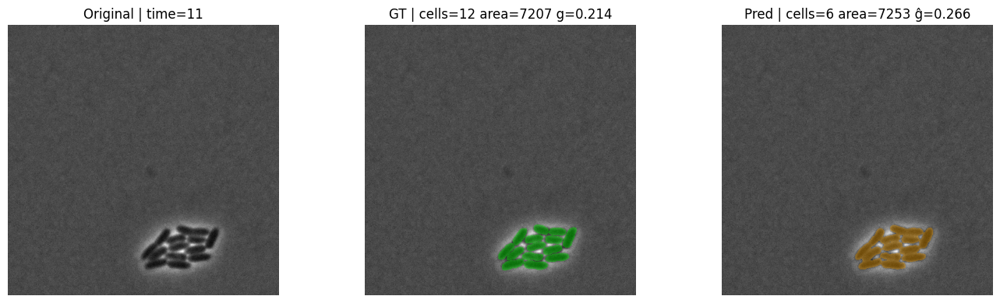

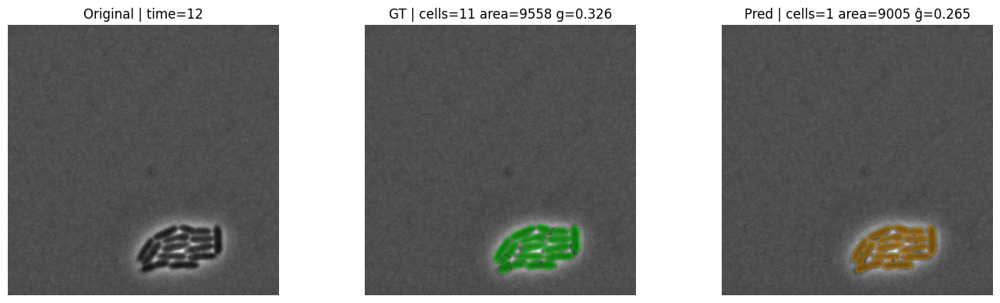

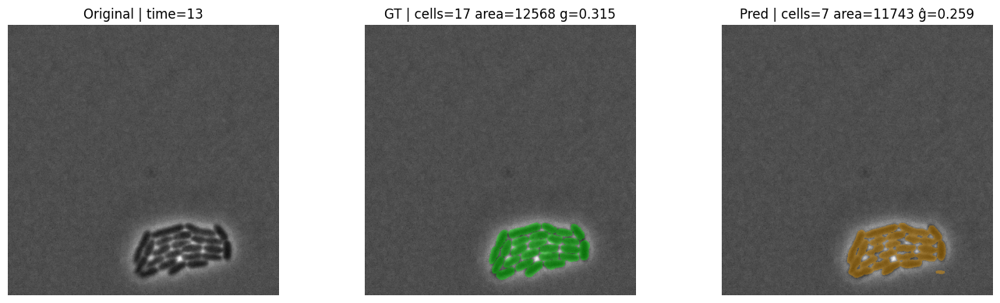

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import torch

def framewise_inspect(ds, mt_model, species, dataset, thresh=0.5, min_area=30, max_frames=30):
    seq = get_sequence_indices(ds, species, dataset)[:max_frames]
    mt_model.eval()

    # GT growth from total GT area
    gt_areas = []
    for t, idx in seq:
        gt = np.squeeze(ds[idx]["mask"].cpu().numpy()) > 0
        gt_areas.append(float(gt.sum()))
    gt_growths = [np.nan] + [np.clip((gt_areas[i]-gt_areas[i-1])/(gt_areas[i-1]+1e-6), -0.5, 0.5)
                             for i in range(1, len(gt_areas))]

    with torch.no_grad():
        for k, (t, idx) in enumerate(seq):
            item = ds[idx]
            x = item["input"].unsqueeze(0).to(device)
            img = item["input"][2].cpu().numpy()
            gt  = np.squeeze(item["mask"].cpu().numpy()) > 0

            logits, g_pred = mt_model(x)
            prob = torch.sigmoid(logits)[0,0].cpu().numpy()
            pred = (prob > thresh)

            gt_c, _ = count_cells_watershed(gt, min_area=min_area)
            pr_c, _ = count_cells_watershed(pred, min_area=min_area)

            ggt = gt_growths[k]
            gpr = float(g_pred.item())

            left  = overlay_mask(img, np.zeros_like(gt), (0,0,0))
            mid   = overlay_mask(img, gt,   (0,255,0))
            right = overlay_mask(img, pred, (255,165,0))

            plt.figure(figsize=(14,4))
            titles = [
                f"Original | time={t}",
                f"GT | cells={gt_c} area={int(gt.sum())} g={ggt:.3f}",
                f"Pred | cells={pr_c} area={int(pred.sum())} ĝ={gpr:.3f}"
            ]
            for i,(im,ti) in enumerate([(left,titles[0]),(mid,titles[1]),(right,titles[2])]):
                ax = plt.subplot(1,3,i+1)
                ax.imshow(im)
                ax.set_title(ti)
                ax.axis("off")
            plt.tight_layout()
            plt.show()

# Example:
framewise_inspect(ds, mt_model, "Pputida", "Time-lapse_dataset1", max_frames=25)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch

def framewise_inspect(ds, mt_model, species, dataset, thresh=0.5, min_area=30, max_frames=30):
    seq = get_sequence_indices(ds, species, dataset)[:max_frames]
    mt_model.eval()

    # GT growth from total GT area
    gt_areas = []
    for t, idx in seq:
        gt = np.squeeze(ds[idx]["mask"].cpu().numpy()) > 0
        gt_areas.append(float(gt.sum()))
    gt_growths = [np.nan] + [np.clip((gt_areas[i]-gt_areas[i-1])/(gt_areas[i-1]+1e-6), -0.5, 0.5)
                             for i in range(1, len(gt_areas))]

    with torch.no_grad():
        for k, (t, idx) in enumerate(seq):
            item = ds[idx]
            x = item["input"].unsqueeze(0).to(device)
            img = item["input"][2].cpu().numpy()
            gt  = np.squeeze(item["mask"].cpu().numpy()) > 0

            logits, g_pred = mt_model(x)
            prob = torch.sigmoid(logits)[0,0].cpu().numpy()
            pred = (prob > thresh)

            gt_c, _ = count_cells_watershed(gt, min_area=min_area)
            pr_c, _ = count_cells_watershed(pred, min_area=min_area)

            ggt = gt_growths[k]
            gpr = float(g_pred.item())

            left  = overlay_mask(img, np.zeros_like(gt), (0,0,0))
            mid   = overlay_mask(img, gt,   (0,255,0))
            right = overlay_mask(img, pred, (255,165,0))

            plt.figure(figsize=(14,4))
            titles = [
                f"Original | time={t}",
                f"GT | cells={gt_c} area={int(gt.sum())} g={ggt:.3f}",
                f"Pred | cells={pr_c} area={int(pred.sum())} ĝ={gpr:.3f}"
            ]
            for i,(im,ti) in enumerate([(left,titles[0]),(mid,titles[1]),(right,titles[2])]):
                ax = plt.subplot(1,3,i+1)
                ax.imshow(im)
                ax.set_title(ti)
                ax.axis("off")
            plt.tight_layout()
            plt.show()

# Example:
framewise_inspect(ds, mt_model, "Pputida", "Time-lapse_dataset1", max_frames=25)


DIVISION CODE IMPLEMENTATION

In [82]:
!pip -q install scikit-image


In [83]:
import numpy as np
import cv2
import torch
from skimage.morphology import skeletonize

def skeleton_length(mask_bin):
    sk = skeletonize(mask_bin.astype(bool))
    return int(sk.sum())

def compute_frame_metrics(ds, model, species, dataset, thresh=0.5, min_area=30, max_frames=None):
    seq = get_sequence_indices(ds, species, dataset)
    if max_frames:
        seq = seq[:max_frames]

    times, A_gt, A_pr, C_gt, C_pr, L_gt, L_pr = [], [], [], [], [], [], []

    model.eval()
    with torch.no_grad():
        for t, idx in seq:
            item = ds[idx]
            x = item["input"].unsqueeze(0).to(device)
            gt = (np.squeeze(item["mask"].cpu().numpy()) > 0)

            # prediction
            logits = model(x)[0,0].detach().cpu().numpy()
            prob = 1/(1+np.exp(-logits))
            pred = (prob > thresh)

            # watershed counts (instances)
            c_gt, _ = count_cells_watershed(gt,   min_area=min_area)
            c_pr, _ = count_cells_watershed(pred, min_area=min_area)

            # areas
            a_gt = float(gt.sum())
            a_pr = float(pred.sum())

            # skeleton length
            l_gt = skeleton_length(gt)
            l_pr = skeleton_length(pred)

            times.append(t)
            A_gt.append(a_gt); A_pr.append(a_pr)
            C_gt.append(c_gt); C_pr.append(c_pr)
            L_gt.append(l_gt); L_pr.append(l_pr)

    return {
        "times": np.array(times),
        "A_gt": np.array(A_gt), "A_pr": np.array(A_pr),
        "C_gt": np.array(C_gt), "C_pr": np.array(C_pr),
        "L_gt": np.array(L_gt), "L_pr": np.array(L_pr),
        "seq": seq
    }


In [84]:
def detect_divisions(metrics, use="pred", drop_tol=0.90, w_count=1.0, w_area=0.5, w_len=0.3):
    """
    use: 'pred' or 'gt'
    returns: score[t], events (list of indices into times)
    """
    if use == "pred":
        A = metrics["A_pr"]; C = metrics["C_pr"]; L = metrics["L_pr"]
    else:
        A = metrics["A_gt"]; C = metrics["C_gt"]; L = metrics["L_gt"]

    # deltas
    dC = np.diff(C, prepend=C[0])
    dA = np.diff(A, prepend=A[0]) / (A + 1e-6)   # relative
    dL = np.diff(L, prepend=L[0]) / (L + 1e-6)   # relative

    # gates
    count_gate = (dC >= 1).astype(float)
    area_gate  = (A >= drop_tol * np.roll(A, 1)).astype(float)
    area_gate[0] = 0.0  # first frame no event

    # score (continuous)
    score = (
        w_count * count_gate
        + w_area * np.clip(dA, 0, 1)
        + w_len  * np.clip(dL, 0, 1)
    ) * area_gate

    # final events: score high + count jump
    events = np.where((score > 0.9) & (dC >= 1) & (area_gate > 0))[0].tolist()
    return score, events


In [85]:
import matplotlib.pyplot as plt

def plot_division_timeline(metrics, score, events, title):
    t = metrics["times"]
    plt.figure(figsize=(10,4))
    plt.plot(t, score, label="division score")
    if len(events) > 0:
        plt.scatter(t[events], score[events], marker="x", s=80, label="division frames")
    plt.title(title)
    plt.xlabel("time")
    plt.ylabel("score")
    plt.ylim(-0.05, max(1.2, score.max()+0.1))
    plt.legend()
    plt.tight_layout()
    plt.show()


Pred division frames: [11 13]
GT   division frames: [ 4  6  7  8 11 13]


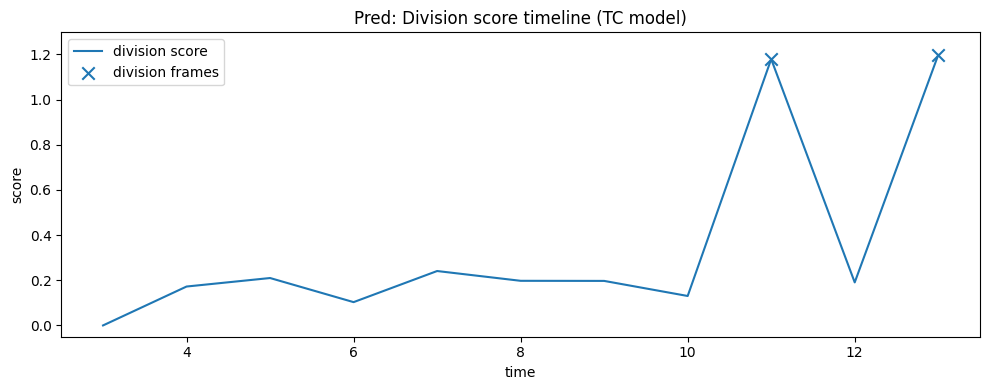

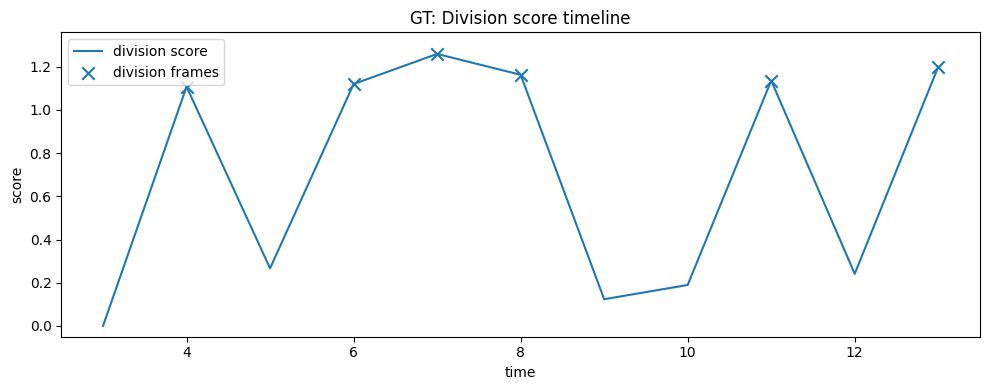

In [86]:
metrics = compute_frame_metrics(ds, model_after, "Pputida", "Time-lapse_dataset1", thresh=0.5, min_area=30)

score_pr, events_pr = detect_divisions(metrics, use="pred", drop_tol=0.90)
score_gt, events_gt = detect_divisions(metrics, use="gt",   drop_tol=0.90)

print("Pred division frames:", metrics["times"][events_pr] if len(events_pr) else [])
print("GT   division frames:", metrics["times"][events_gt] if len(events_gt) else [])

plot_division_timeline(metrics, score_pr, events_pr, "Pred: Division score timeline (TC model)")
plot_division_timeline(metrics, score_gt, events_gt, "GT: Division score timeline")


In [87]:
import cv2
import numpy as np
import torch

def make_division_video(ds, model, metrics, score, events, out_path, thresh=0.5, fps=3, min_area=30):
    seq = metrics["seq"]
    H, W = 512, 512
    writer = cv2.VideoWriter(out_path, cv2.VideoWriter_fourcc(*"mp4v"), fps, (W*3, H))

    events_set = set(events)

    model.eval()
    with torch.no_grad():
        for k, (t, idx) in enumerate(seq):
            item = ds[idx]
            x = item["input"].unsqueeze(0).to(device)
            img = item["input"][2].cpu().numpy()
            gt  = (np.squeeze(item["mask"].cpu().numpy()) > 0)

            logits = model(x)[0,0].cpu().numpy()
            prob = 1/(1+np.exp(-logits))
            pred = (prob > thresh)

            c_gt, _ = count_cells_watershed(gt,   min_area=min_area)
            c_pr, _ = count_cells_watershed(pred, min_area=min_area)

            a_gt = int(gt.sum()); a_pr = int(pred.sum())
            sc = float(score[k])

            left  = overlay_mask(img, np.zeros_like(gt), (0,0,0))
            mid   = overlay_mask(img, gt,   (0,255,0))
            right = overlay_mask(img, pred, (255,165,0))

            left_u  = cv2.cvtColor((left  * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
            mid_u   = cv2.cvtColor((mid   * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
            right_u = cv2.cvtColor((right * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)

            cv2.putText(left_u,  f"time={t}", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2)
            cv2.putText(mid_u,   f"GT cells={c_gt} area={a_gt}", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2)
            cv2.putText(right_u, f"Pred cells={c_pr} area={a_pr} score={sc:.2f}", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,165,255), 2)

            if k in events_set:
                cv2.putText(right_u, "DIVISION EVENT", (10,70), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,0,255), 3)

            frame = np.concatenate([left_u, mid_u, right_u], axis=1)
            writer.write(frame)

    writer.release()
    print("Saved:", out_path)

out_mp4 = "/content/Pputida_division_events.mp4"
make_division_video(ds, model_after, metrics, score_pr, events_pr, out_mp4, fps=3)


Saved: /content/Pputida_division_events.mp4


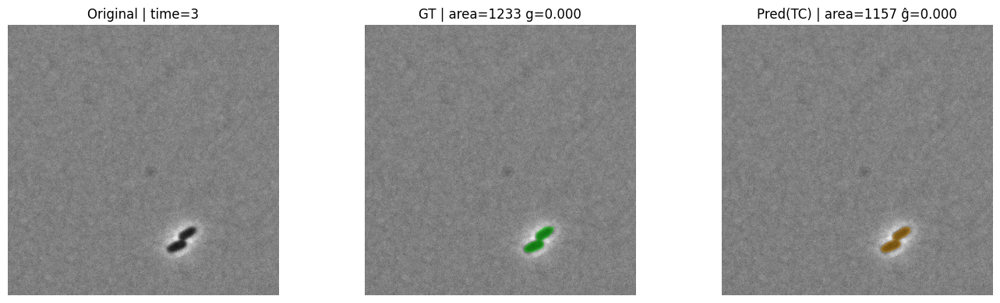

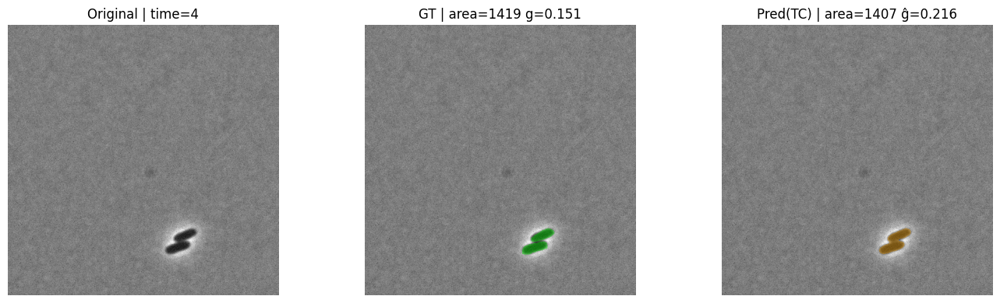

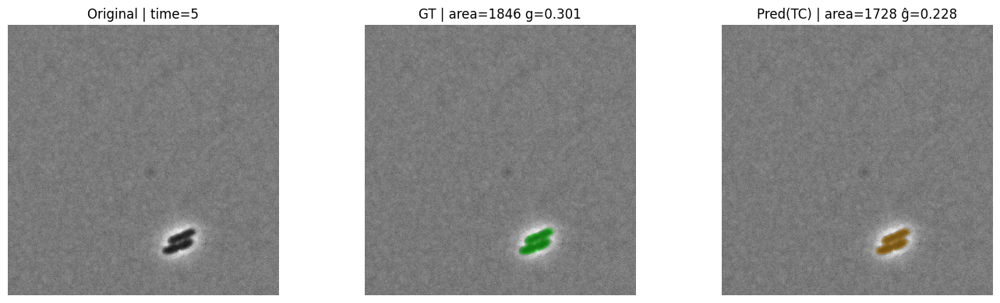

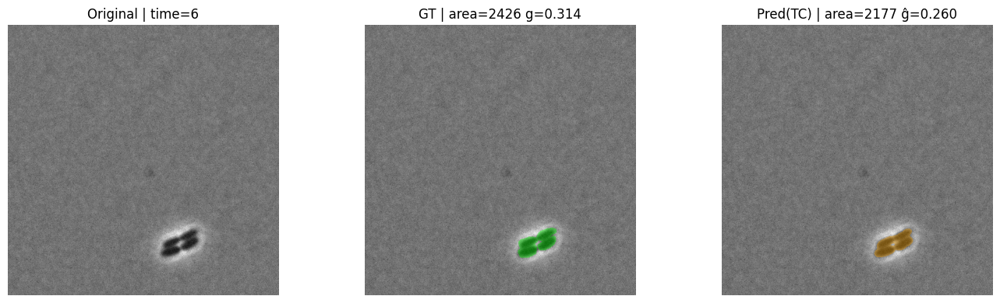

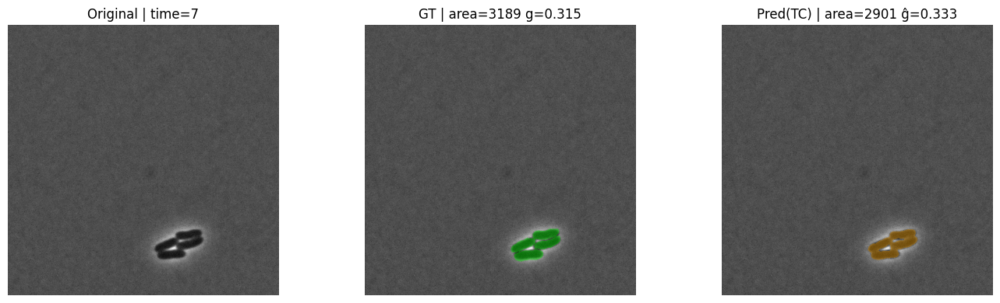

...

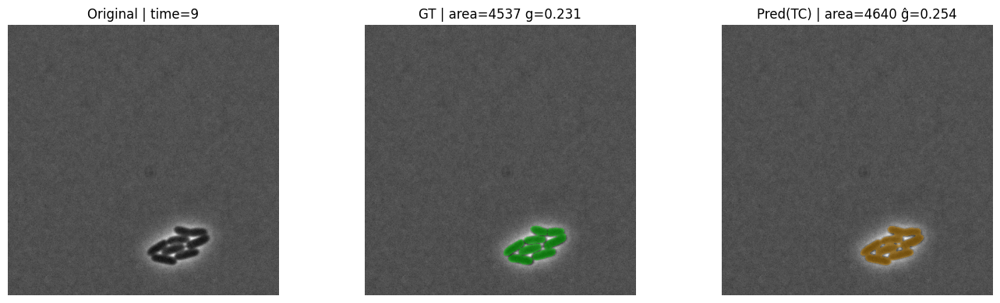

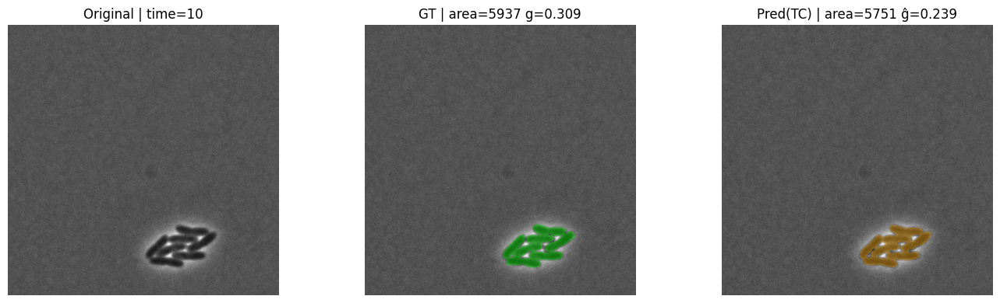

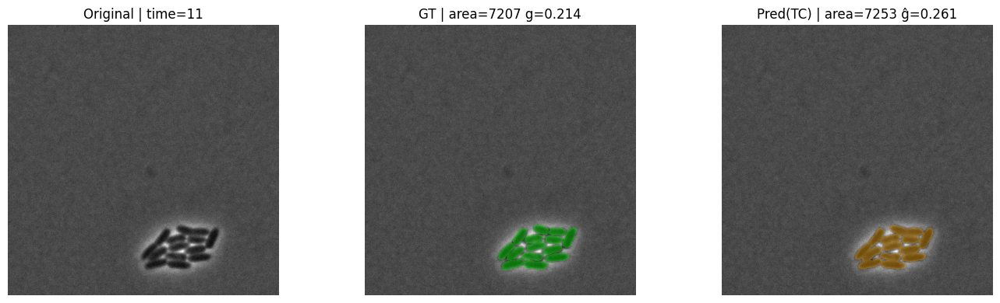

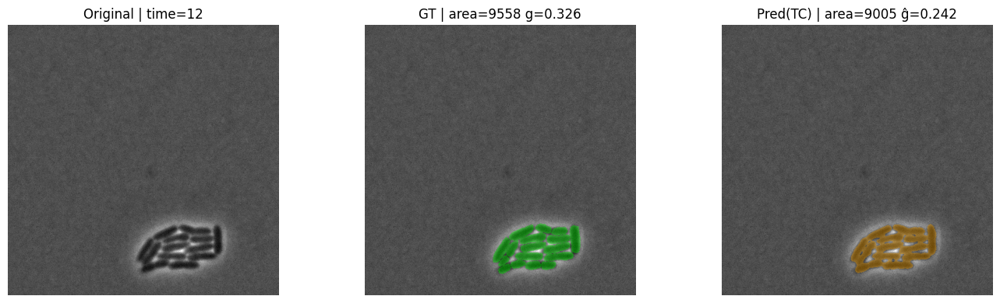

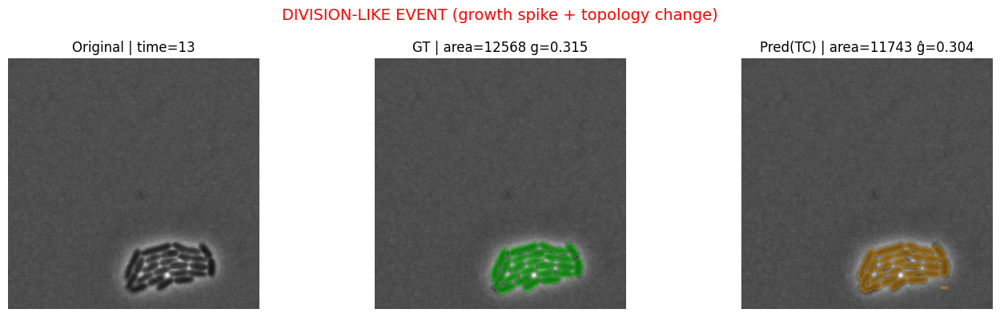

Division-like event frames (time): [13]
Saved video: /content/Pputida_Time-lapse_dataset1_division_like.mp4
Division-like event frames (time): [13]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [88]:
# =========================
# 0) imports
# =========================
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

# =========================
# 1) Utility: get binary pred mask + area-based growth
# =========================
def pred_mask_from_model(model, x, thresh=0.5):
    # x: [1,C,H,W]
    logits = model(x)[0,0].detach().cpu().numpy()
    prob = 1/(1+np.exp(-logits))
    return (prob > thresh)

def area_growth(area_prev, area_now, eps=1e-6, clip=0.5):
    g = (area_now - area_prev) / (area_prev + eps)
    return float(np.clip(g, -clip, clip))

# =========================
# 2) Topology change score (NO "cell count")
#    We use number of components as a TOPOLOGY indicator only.
# =========================
def num_components(mask_bin, min_area=30):
    m = (mask_bin.astype(np.uint8) * 255)
    m = cv2.morphologyEx(m, cv2.MORPH_OPEN, np.ones((3,3), np.uint8), iterations=1)

    num, labels, stats, _ = cv2.connectedComponentsWithStats((m > 0).astype(np.uint8), connectivity=8)
    # stats includes background at index 0
    areas = stats[1:, cv2.CC_STAT_AREA]
    keep = areas >= min_area
    return int(np.sum(keep))

# =========================
# 3) Division-like event detection (biologically meaningful)
#    Event when:
#      - growth spike AND
#      - topology changes (components increase)
#    We DO NOT display components count in video.
# =========================
def detect_division_like_events(times, areas, comps, g_thresh=0.12, dcomp_thresh=1):
    growth = [np.nan]
    dcomp  = [0]

    for i in range(1, len(areas)):
        growth.append(area_growth(areas[i-1], areas[i]))
        dcomp.append(int(comps[i] - comps[i-1]))

    growth = np.array(growth, dtype=np.float32)
    dcomp  = np.array(dcomp, dtype=np.int32)

    events = np.where((growth >= g_thresh) & (dcomp >= dcomp_thresh))[0].tolist()
    return growth, dcomp, events

# =========================
# 4) Frame-wise slideshow (in notebook)
# =========================
def framewise_show(ds, model, species, dataset, thresh=0.5, min_area=30, max_frames=30):
    seq = get_sequence_indices(ds, species, dataset)[:max_frames]

    # precompute area + topology (components) for GT & Pred
    times, Agt, Apr, Cgt, Cpr = [], [], [], [], []
    for t, idx in seq:
        item = ds[idx]
        gt = (np.squeeze(item["mask"].cpu().numpy()) > 0)
        Agt.append(float(gt.sum()))
        Cgt.append(num_components(gt, min_area=min_area))

        x = item["input"].unsqueeze(0).to(device)
        pr = pred_mask_from_model(model, x, thresh=thresh)
        Apr.append(float(pr.sum()))
        Cpr.append(num_components(pr, min_area=min_area))

        times.append(t)

    times = np.array(times)
    Agt, Apr = np.array(Agt), np.array(Apr)
    Cgt, Cpr = np.array(Cgt), np.array(Cpr)

    # events based on PRED dynamics (what you’d use in practice)
    gpr, dcomp_pr, events = detect_division_like_events(times, Apr, Cpr, g_thresh=0.12, dcomp_thresh=1)

    model.eval()
    with torch.no_grad():
        for k, (t, idx) in enumerate(seq):
            item = ds[idx]
            img = item["input"][2].cpu().numpy()
            gt  = (np.squeeze(item["mask"].cpu().numpy()) > 0)

            x = item["input"].unsqueeze(0).to(device)
            pr = pred_mask_from_model(model, x, thresh=thresh)

            # overlays
            left  = overlay_mask(img, np.zeros_like(gt), (0,0,0))
            mid   = overlay_mask(img, gt, (0,255,0))
            right = overlay_mask(img, pr, (255,165,0))

            # growth display
            ggt = np.nan if k == 0 else area_growth(Agt[k-1], Agt[k])
            gpp = gpr[k]

            titleL = f"Original | time={t}"
            titleM = f"GT | area={int(Agt[k])} g={ggt if not np.isnan(ggt) else 0:.3f}"
            titleR = f"Pred(TC) | area={int(Apr[k])} ĝ={gpp if not np.isnan(gpp) else 0:.3f}"

            plt.figure(figsize=(14,4))
            for i,(im,ti) in enumerate([(left,titleL),(mid,titleM),(right,titleR)]):
                ax = plt.subplot(1,3,i+1)
                ax.imshow(im)
                ax.set_title(ti)
                ax.axis("off")

            if k in events:
                plt.suptitle("DIVISION-LIKE EVENT (growth spike + topology change)", fontsize=14, color="red")
            plt.tight_layout()
            plt.show()

    print("Division-like event frames (time):", times[events] if len(events) else [])

# =========================
# 5) MP4 video generator (clean labels, no cell counts)
# =========================
def make_division_video(ds, model, species, dataset, out_path,
                        thresh=0.5, min_area=30, fps=3, max_frames=60,
                        g_thresh=0.12, dcomp_thresh=1):
    seq = get_sequence_indices(ds, species, dataset)[:max_frames]

    # precompute Pred area + topology to decide events
    times, Apr, Cpr = [], [], []
    model.eval()
    with torch.no_grad():
        for t, idx in seq:
            item = ds[idx]
            x = item["input"].unsqueeze(0).to(device)
            pr = pred_mask_from_model(model, x, thresh=thresh)
            Apr.append(float(pr.sum()))
            Cpr.append(num_components(pr, min_area=min_area))
            times.append(t)

    times = np.array(times)
    Apr = np.array(Apr)
    Cpr = np.array(Cpr)

    gpr, dcomp_pr, events = detect_division_like_events(times, Apr, Cpr,
                                                        g_thresh=g_thresh, dcomp_thresh=dcomp_thresh)
    events_set = set(events)

    H, W = 512, 512
    writer = cv2.VideoWriter(out_path, cv2.VideoWriter_fourcc(*"mp4v"), fps, (W*3, H))

    with torch.no_grad():
        for k, (t, idx) in enumerate(seq):
            item = ds[idx]
            img = item["input"][2].cpu().numpy()
            gt  = (np.squeeze(item["mask"].cpu().numpy()) > 0)

            x = item["input"].unsqueeze(0).to(device)
            pr = pred_mask_from_model(model, x, thresh=thresh)

            # compute GT growth just for reference (optional)
            # (We show it because it helps your report; you can remove it if you want)
            a_gt = int(gt.sum())
            a_pr = int(Apr[k])
            gpp  = float(gpr[k]) if not np.isnan(gpr[k]) else 0.0

            left  = overlay_mask(img, np.zeros_like(gt), (0,0,0))
            mid   = overlay_mask(img, gt, (0,255,0))
            right = overlay_mask(img, pr, (255,165,0))

            left_u  = cv2.cvtColor((left  * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
            mid_u   = cv2.cvtColor((mid   * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
            right_u = cv2.cvtColor((right * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)

            cv2.putText(left_u,  f"time={t}", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255,255,255), 2)
            cv2.putText(mid_u,   f"GT area={a_gt}", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255,0), 2)
            cv2.putText(right_u, f"Pred area={a_pr}  growth^={gpp:.3f}", (10,30),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,165,255), 2)

            if k in events_set:
                cv2.putText(right_u, "DIVISION-LIKE EVENT", (10,70),
                            cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0,0,255), 3)

            frame = np.concatenate([left_u, mid_u, right_u], axis=1)
            writer.write(frame)

    writer.release()
    print("Saved video:", out_path)
    print("Division-like event frames (time):", times[events] if len(events) else [])
    return out_path

# =========================
# 6) RUN (example)
# =========================
species = "Pputida"
dataset = "Time-lapse_dataset1"

# 6A) slideshow
framewise_show(ds, model_after, species, dataset, thresh=0.5, min_area=30, max_frames=30)

# 6B) video
out_mp4 = f"/content/{species}_{dataset}_division_like.mp4"
make_division_video(ds, model_after, species, dataset, out_mp4,
                    thresh=0.5, min_area=30, fps=3, max_frames=60,
                    g_thresh=0.12, dcomp_thresh=1)

# 6C) download (Colab)
from google.colab import files
files.download(out_mp4)


In [89]:
# =========================
# 6) RUN (example)
# =========================
species = "Lysobacter"
dataset = "Time-lapse_dataset2"

# 6A) slideshow
framewise_show(ds, model_after, species, dataset, thresh=0.5, min_area=30, max_frames=30)

# 6B) video
out_mp4 = f"/content/{species}_{dataset}_division_like.mp4"
make_division_video(ds, model_after, species, dataset, out_mp4,
                    thresh=0.5, min_area=30, fps=3, max_frames=60,
                    g_thresh=0.12, dcomp_thresh=1)

# 6C) download (Colab)
from google.colab import files
files.download(out_mp4)

Output hidden; open in https://colab.research.google.com to view.

In [90]:
# =========================
# 6) RUN (example)
# =========================
species = "Pveronii"
dataset = "Time-lapse_dataset1"

# 6A) slideshow
framewise_show(ds, model_after, species, dataset, thresh=0.5, min_area=30, max_frames=30)

# 6B) video
out_mp4 = f"/content/{species}_{dataset}_division_like.mp4"
make_division_video(ds, model_after, species, dataset, out_mp4,
                    thresh=0.5, min_area=30, fps=3, max_frames=60,
                    g_thresh=0.12, dcomp_thresh=1)

# 6C) download (Colab)
from google.colab import files
files.download(out_mp4)

Output hidden; open in https://colab.research.google.com to view.

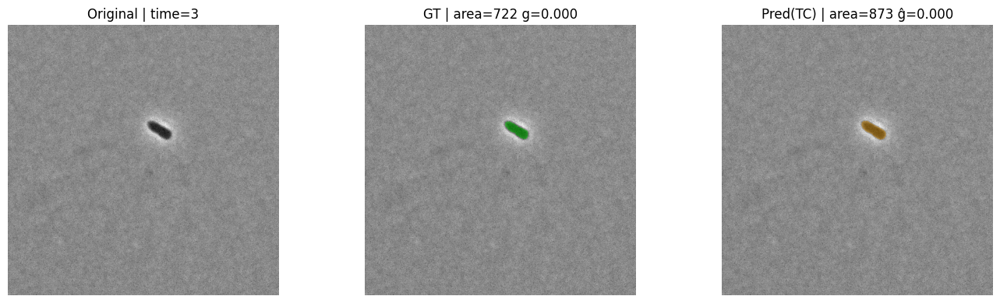

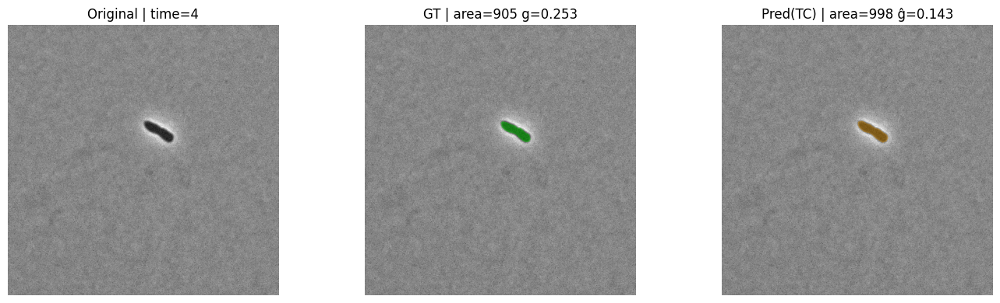

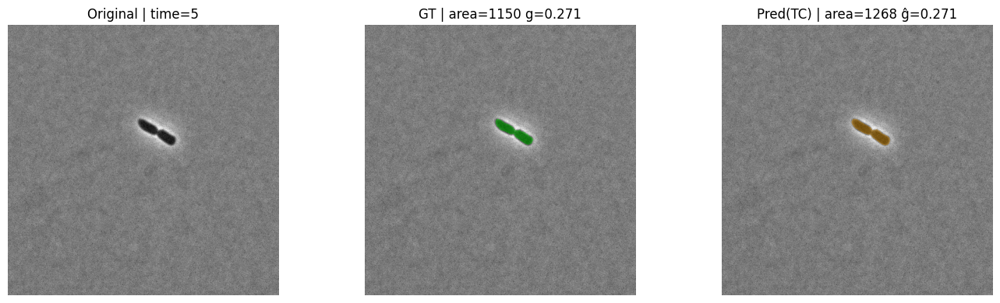

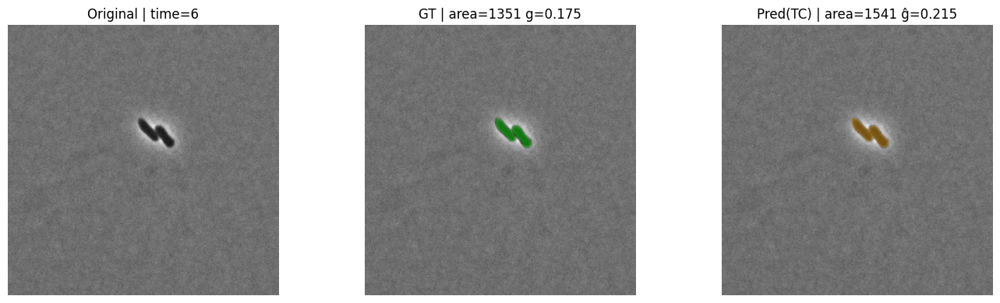

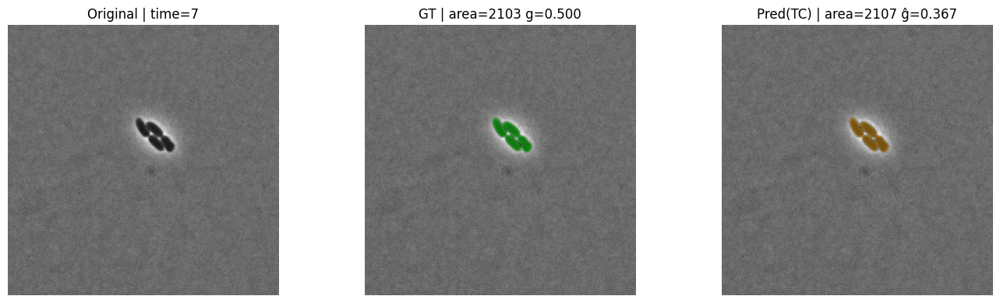

...

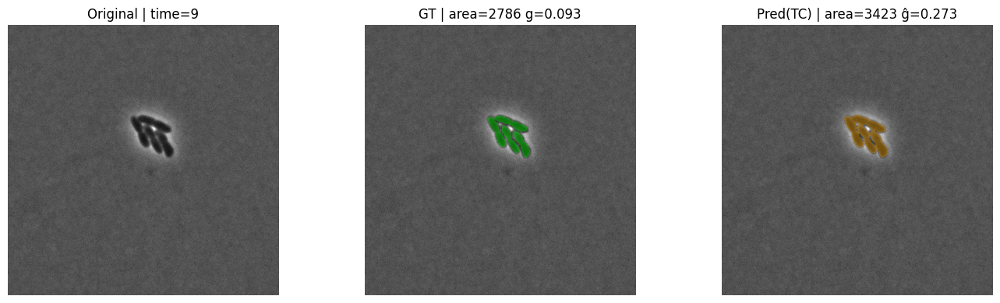

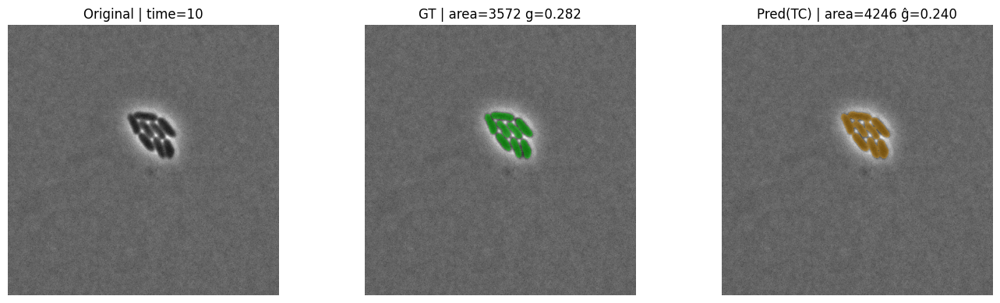

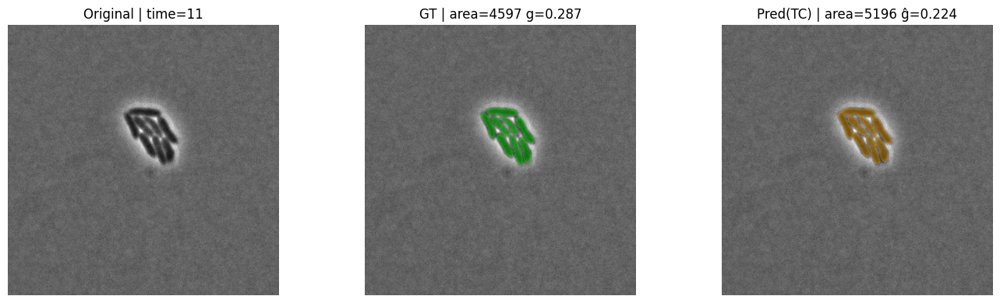

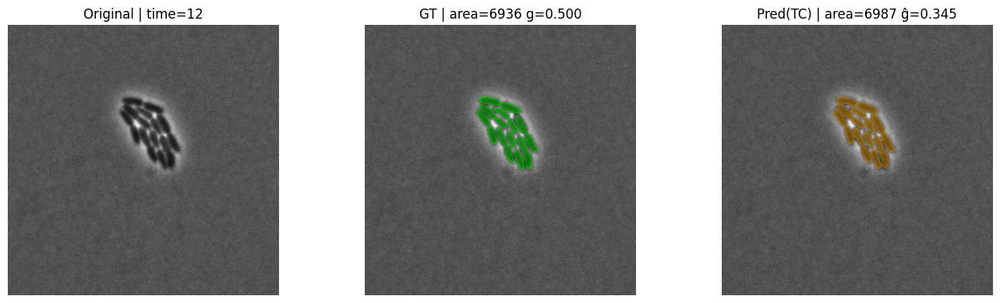

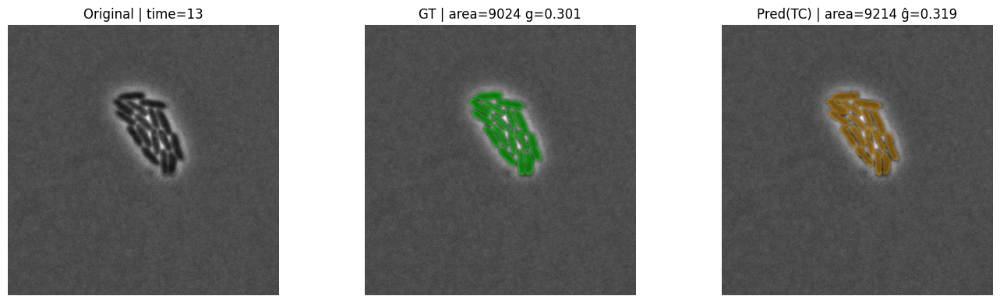

Division-like event frames (time): []
Saved video: /content/Pputida_Time-lapse_dataset3_division_like.mp4
Division-like event frames (time): []


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [91]:
# =========================
# 6) RUN (example)
# =========================
species = "Pputida"
dataset = "Time-lapse_dataset3"

# 6A) slideshow
framewise_show(ds, model_after, species, dataset, thresh=0.5, min_area=30, max_frames=30)

# 6B) video
out_mp4 = f"/content/{species}_{dataset}_division_like.mp4"
make_division_video(ds, model_after, species, dataset, out_mp4,
                    thresh=0.5, min_area=30, fps=3, max_frames=60,
                    g_thresh=0.12, dcomp_thresh=1)

# 6C) download (Colab)
from google.colab import files
files.download(out_mp4)

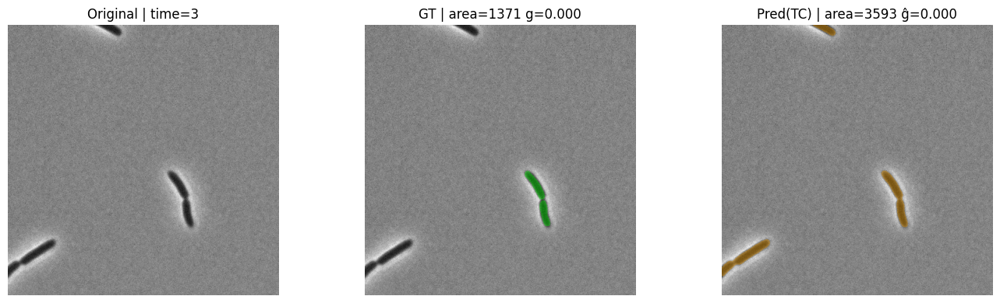

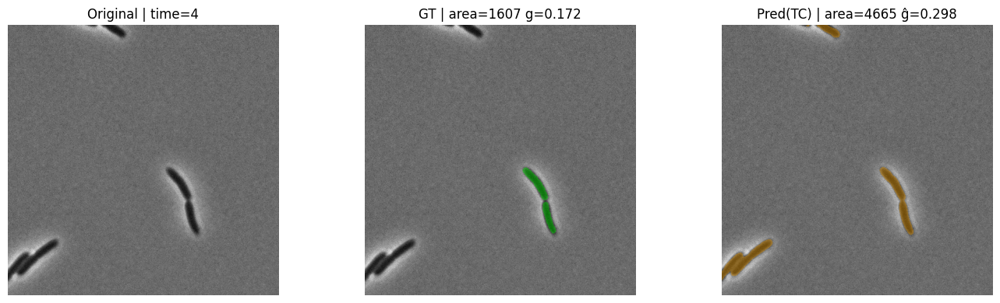

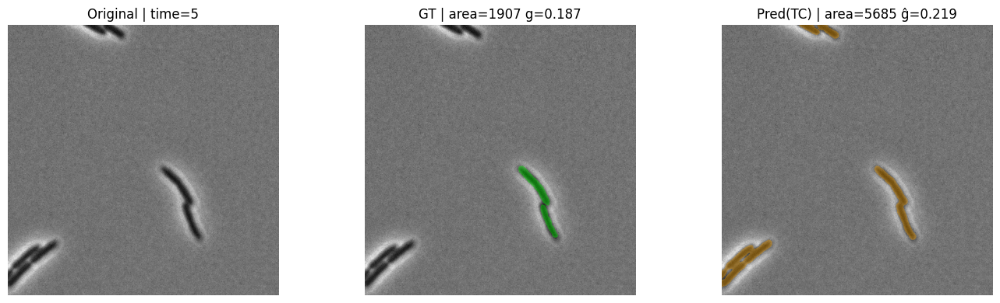

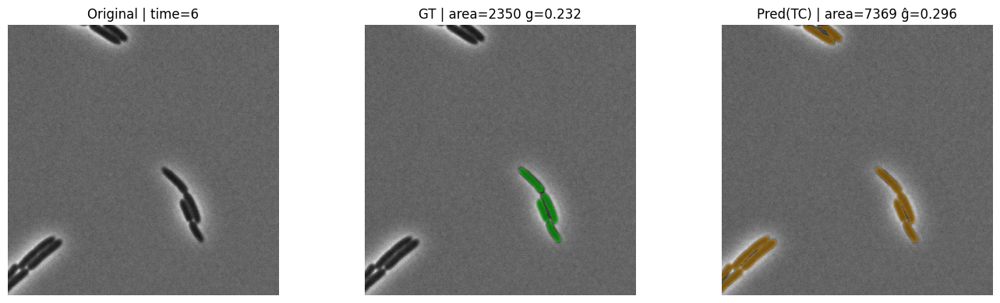

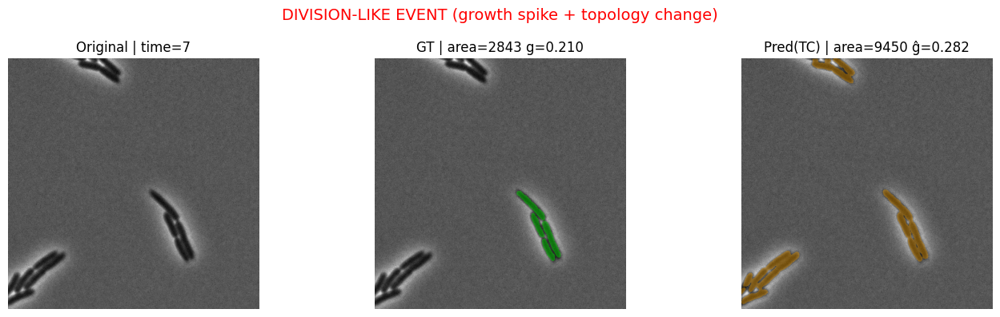

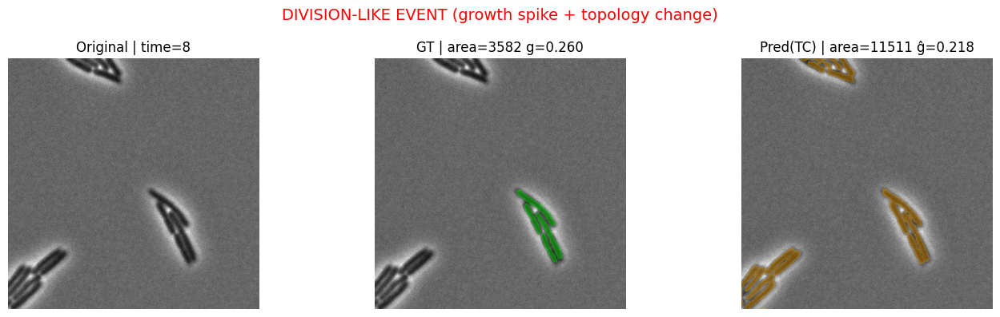

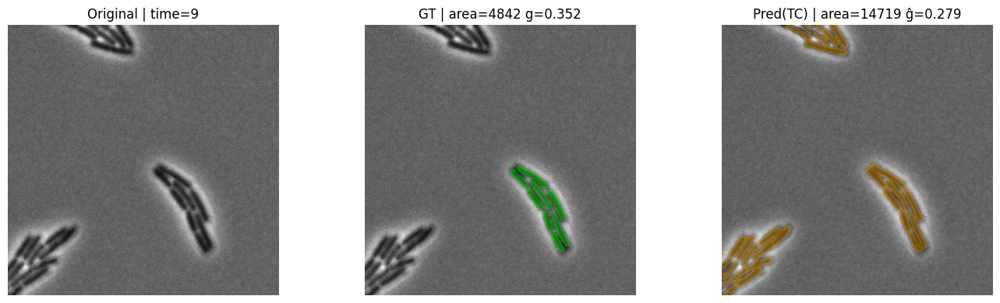

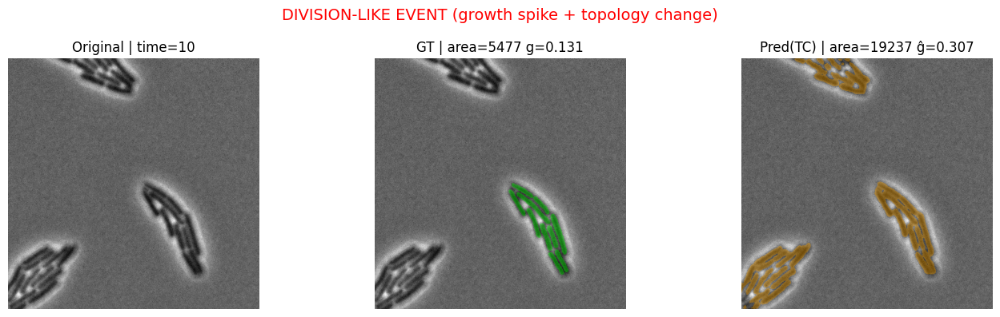

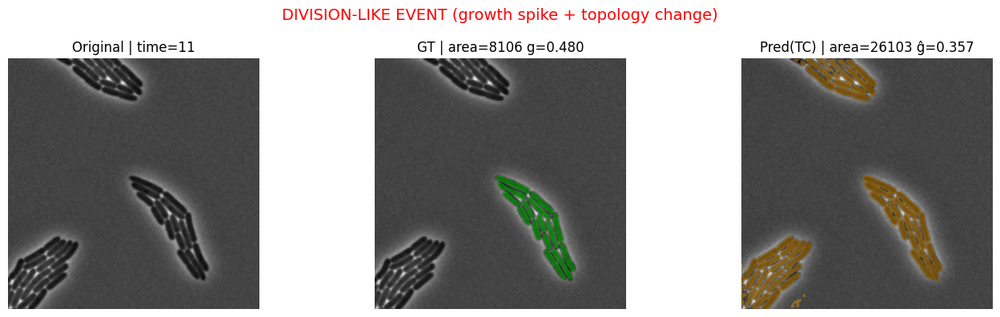

Division-like event frames (time): [ 7  8 10 11]
Saved video: /content/Rahnella_Time-lapse_dataset1_division_like.mp4
Division-like event frames (time): [ 7  8 10 11]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [92]:
# =========================
# 6) RUN (example)
# =========================
species = "Rahnella"
dataset = "Time-lapse_dataset1"

# 6A) slideshow
framewise_show(ds, model_after, species, dataset, thresh=0.5, min_area=30, max_frames=30)

# 6B) video
out_mp4 = f"/content/{species}_{dataset}_division_like.mp4"
make_division_video(ds, model_after, species, dataset, out_mp4,
                    thresh=0.5, min_area=30, fps=3, max_frames=60,
                    g_thresh=0.12, dcomp_thresh=1)

# 6C) download (Colab)
from google.colab import files
files.download(out_mp4)

BIO ANALYTICS (PHASES + DOUBLING TIME)

=== Pputida / Time-lapse_dataset1 ===
GT:  exp range = None-None | r=None | Td=None
Pred: exp range = None-None | r=None | Td=None


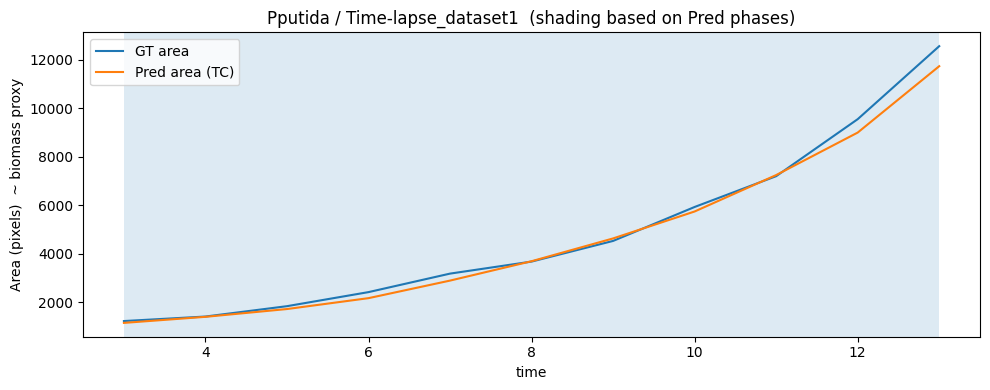

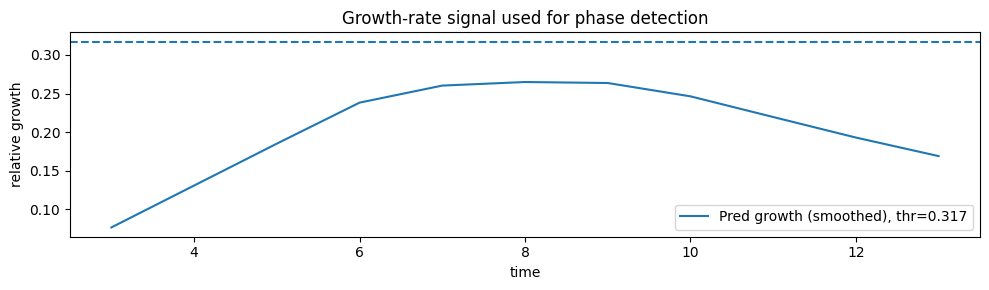

In [93]:
import numpy as np
import torch
import matplotlib.pyplot as plt

# ----------------------------
# 1) Extract area vs time curve
# ----------------------------
def area_curve_from_sequence(ds, model, species, dataset, thresh=0.5, max_frames=None):
    seq = get_sequence_indices(ds, species, dataset)
    if max_frames: seq = seq[:max_frames]

    times, A_gt, A_pr = [], [], []
    model.eval()
    with torch.no_grad():
        for t, idx in seq:
            item = ds[idx]
            gt = (np.squeeze(item["mask"].cpu().numpy()) > 0)
            A_gt.append(float(gt.sum()))

            x = item["input"].unsqueeze(0).to(device)
            logits = model(x)[0,0].detach().cpu().numpy()
            prob = 1/(1+np.exp(-logits))
            pr = (prob > thresh)
            A_pr.append(float(pr.sum()))

            times.append(t)

    return np.array(times), np.array(A_gt), np.array(A_pr)

# ----------------------------
# 2) Helper: smoothing + growth rate
# ----------------------------
def moving_average(x, w=5):
    if w <= 1: return x.copy()
    pad = w//2
    xp = np.pad(x, (pad,pad), mode="edge")
    return np.convolve(xp, np.ones(w)/w, mode="valid")

def rel_growth(A):
    g = np.zeros_like(A, dtype=np.float32)
    g[1:] = (A[1:] - A[:-1]) / (A[:-1] + 1e-6)
    return g

# ----------------------------
# 3) Phase detection (Lag / Exp / Stationary)
#    rule-based but biologically standard:
#    - compute smoothed relative growth
#    - exponential = sustained growth above threshold
# ----------------------------
def detect_phases(times, A, smooth_w=5, g_thr=None, sustain=3):
    A_s = moving_average(A, smooth_w)
    g = rel_growth(A_s)
    g_s = moving_average(g, smooth_w)

    # auto threshold if not given: robust "high growth" cutoff
    if g_thr is None:
        med = np.nanmedian(g_s[1:])
        mad = np.nanmedian(np.abs(g_s[1:] - med)) + 1e-6
        g_thr = max(0.02, med + 2.5*mad)   # conservative

    # find sustained "exp" region
    exp_mask = (g_s >= g_thr).astype(np.int32)

    # enforce sustain length (remove isolated spikes)
    exp_mask2 = exp_mask.copy()
    for i in range(len(exp_mask)):
        if exp_mask[i] == 1:
            # require at least `sustain` consecutive ones starting here
            if i + sustain <= len(exp_mask) and exp_mask[i:i+sustain].sum() < sustain:
                exp_mask2[i] = 0
    exp_mask = exp_mask2

    # pick first and last exp indices
    exp_idx = np.where(exp_mask == 1)[0]
    if len(exp_idx) == 0:
        # no clear exponential phase
        phases = np.array(["Lag"] * len(times))
        return phases, g_s, g_thr, None, None

    exp_start = int(exp_idx[0])
    exp_end   = int(exp_idx[-1])

    phases = np.array(["Lag"] * len(times), dtype=object)
    phases[exp_start:exp_end+1] = "Exponential"
    phases[exp_end+1:] = "Stationary"

    return phases, g_s, g_thr, exp_start, exp_end

# ----------------------------
# 4) Doubling time from exponential phase
#    Fit log(A) = a + r*t  => Td = ln(2)/r
# ----------------------------
def doubling_time(times, A, exp_start, exp_end):
    if exp_start is None or exp_end is None or exp_end - exp_start < 3:
        return None, None  # (r, Td)
    t = times[exp_start:exp_end+1].astype(np.float32)
    y = A[exp_start:exp_end+1].astype(np.float32)

    # avoid log(0)
    y = np.maximum(y, 1.0)
    logy = np.log(y)

    # linear fit
    r, a = np.polyfit(t, logy, 1)  # slope r
    if r <= 0:
        return float(r), None
    Td = np.log(2.0) / r
    return float(r), float(Td)

# ----------------------------
# 5) Plot helper
# ----------------------------
def plot_growth_phases(times, A_gt, A_pr, phases_gt, phases_pr, title):
    plt.figure(figsize=(10,4))
    plt.plot(times, A_gt, label="GT area")
    plt.plot(times, A_pr, label="Pred area (TC)")

    # shade phases for Pred (what you’ll report)
    for phase, color in [("Lag", 0.15), ("Exponential", 0.10), ("Stationary", 0.15)]:
        idx = np.where(phases_pr == phase)[0]
        if len(idx):
            plt.axvspan(times[idx[0]], times[idx[-1]], alpha=color)

    plt.title(title + "  (shading based on Pred phases)")
    plt.xlabel("time")
    plt.ylabel("Area (pixels)  ~ biomass proxy")
    plt.legend()
    plt.tight_layout()
    plt.show()

# ----------------------------
# 6) RUN for one sequence
# ----------------------------
species = "Pputida"
dataset = "Time-lapse_dataset1"

times, Agt, Apr = area_curve_from_sequence(ds, model_after, species, dataset, thresh=0.5, max_frames=120)

ph_gt, g_gt, thr_gt, s_gt, e_gt = detect_phases(times, Agt, smooth_w=5, sustain=3)
ph_pr, g_pr, thr_pr, s_pr, e_pr = detect_phases(times, Apr, smooth_w=5, sustain=3)

r_gt, Td_gt = doubling_time(times, Agt, s_gt, e_gt)
r_pr, Td_pr = doubling_time(times, Apr, s_pr, e_pr)

print(f"=== {species} / {dataset} ===")
print(f"GT:  exp range = {s_gt}-{e_gt} | r={r_gt} | Td={Td_gt}")
print(f"Pred: exp range = {s_pr}-{e_pr} | r={r_pr} | Td={Td_pr}")

plot_growth_phases(times, Agt, Apr, ph_gt, ph_pr, f"{species} / {dataset}")

# growth-rate plot (optional but great for Results)
plt.figure(figsize=(10,3))
plt.plot(times, g_pr, label=f"Pred growth (smoothed), thr={thr_pr:.3f}")
plt.axhline(thr_pr, linestyle="--")
plt.title("Growth-rate signal used for phase detection")
plt.xlabel("time")
plt.ylabel("relative growth")
plt.legend()
plt.tight_layout()
plt.show()


In [94]:
species_list = ["Lysobacter","Pputida","Pveronii","Rahnella"]
datasets_pick = {
    "Lysobacter": "Time-lapse_dataset1",
    "Pputida":    "Time-lapse_dataset1",
    "Pveronii":   "Time-lapse_dataset1",
    "Rahnella":   "Time-lapse_dataset1",
}

results = []
for sp in species_list:
    dsname = datasets_pick[sp]
    times, Agt, Apr = area_curve_from_sequence(ds, model_after, sp, dsname, thresh=0.5, max_frames=120)

    ph_gt, g_gt, thr_gt, s_gt, e_gt = detect_phases(times, Agt, smooth_w=5, sustain=3)
    ph_pr, g_pr, thr_pr, s_pr, e_pr = detect_phases(times, Apr, smooth_w=5, sustain=3)

    r_gt, Td_gt = doubling_time(times, Agt, s_gt, e_gt)
    r_pr, Td_pr = doubling_time(times, Apr, s_pr, e_pr)

    results.append([sp, dsname, r_gt, Td_gt, r_pr, Td_pr])

print("\nSpecies | Dataset | r_GT | Td_GT | r_Pred | Td_Pred")
for row in results:
    print(row)



Species | Dataset | r_GT | Td_GT | r_Pred | Td_Pred
['Lysobacter', 'Time-lapse_dataset1', None, None, None, None]
['Pputida', 'Time-lapse_dataset1', None, None, None, None]
['Pveronii', 'Time-lapse_dataset1', None, None, None, None]
['Rahnella', 'Time-lapse_dataset1', None, None, None, None]


In [96]:
species_list = ["Lysobacter","Pputida","Pveronii","Rahnella"]
datasets_pick = {
    "Lysobacter": "Time-lapse_dataset3",
    "Pputida":    "Time-lapse_dataset3",
    "Pveronii":   "Time-lapse_dataset3",
    "Rahnella":   "Time-lapse_dataset3",
}

results = []
for sp in species_list:
    dsname = datasets_pick[sp]
    times, Agt, Apr = area_curve_from_sequence(ds, model_after, sp, dsname, thresh=0.5, max_frames=120)

    ph_gt, g_gt, thr_gt, s_gt, e_gt = detect_phases(times, Agt, smooth_w=5, sustain=3)
    ph_pr, g_pr, thr_pr, s_pr, e_pr = detect_phases(times, Apr, smooth_w=5, sustain=3)

    r_gt, Td_gt = doubling_time(times, Agt, s_gt, e_gt)
    r_pr, Td_pr = doubling_time(times, Apr, s_pr, e_pr)

    results.append([sp, dsname, r_gt, Td_gt, r_pr, Td_pr])

print("\nSpecies | Dataset | r_GT | Td_GT | r_Pred | Td_Pred")
for row in results:
    print(row)



Species | Dataset | r_GT | Td_GT | r_Pred | Td_Pred
['Lysobacter', 'Time-lapse_dataset3', None, None, None, None]
['Pputida', 'Time-lapse_dataset3', None, None, None, None]
['Pveronii', 'Time-lapse_dataset3', None, None, None, None]
['Rahnella', 'Time-lapse_dataset3', None, None, None, None]


In [97]:
import numpy as np
from skimage.measure import label, regionprops

def remove_small_components(mask, min_area=300):
    """mask: binary (H,W) bool/0-1"""
    lab = label(mask.astype(np.uint8))
    clean = np.zeros_like(mask, dtype=np.uint8)
    for r in regionprops(lab):
        if r.area >= min_area:
            clean[lab == r.label] = 1
    return clean.astype(bool)

def area_within_roi(mask, margin=10):
    """area inside bbox of mask (plus margin) to avoid background leakage"""
    ys, xs = np.where(mask)
    if len(xs) == 0:
        return 0
    y1, y2 = ys.min(), ys.max()
    x1, x2 = xs.min(), xs.max()
    y1 = max(0, y1 - margin); x1 = max(0, x1 - margin)
    y2 = min(mask.shape[0]-1, y2 + margin)
    x2 = min(mask.shape[1]-1, x2 + margin)
    return int(mask[y1:y2+1, x1:x2+1].sum())

def log_growth(area_prev, area_now, eps=1e-6):
    """log(A_t / A_{t-1})"""
    area_prev = max(area_prev, 1)
    area_now  = max(area_now, 1)
    return float(np.log((area_now + eps) / (area_prev + eps)))


morphology

In [100]:
import numpy as np
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects, skeletonize
from scipy.ndimage import convolve

# ---------- cleaning ----------
def clean_binary(mask_bool, min_area=300):
    """mask_bool: (H,W) bool"""
    m = mask_bool.astype(bool)
    m = remove_small_objects(m, min_size=min_area)
    return m

# ---------- skeleton branch metric (optional but helpful) ----------
def skeleton_branch_score(obj_mask):
    """
    Returns a simple branch score from skeleton pixel neighbor counts.
    Higher -> more complex / possibly splitting-like morphology.
    """
    sk = skeletonize(obj_mask)
    if sk.sum() == 0:
        return 0.0

    # Count 8-neighbors for each skeleton pixel
    kernel = np.array([[1,1,1],
                       [1,10,1],
                       [1,1,1]], dtype=np.int32)
    neigh = convolve(sk.astype(np.int32), kernel, mode="constant", cval=0)

    # skeleton pixels have value >=10; subtract 10 to get neighbor count
    neighbor_count = (neigh[sk] - 10)

    # branch points: neighbor_count >= 3 ; endpoints: neighbor_count == 1
    branches = np.sum(neighbor_count >= 3)
    endpoints = np.sum(neighbor_count == 1)

    # normalized-ish score
    return float(branches) + 0.25 * float(endpoints)

# ---------- feature extraction ----------
def extract_object_features(binary_mask, min_area=300):
    """
    Returns list of dicts with features per object.
    """
    m = clean_binary(binary_mask, min_area=min_area)
    lab = label(m)
    feats = []

    for r in regionprops(lab):
        obj = (lab == r.label)

        area = float(r.area)
        perim = float(r.perimeter) if r.perimeter else 0.0
        maj = float(r.major_axis_length) if r.major_axis_length else 0.0
        minr = float(r.minor_axis_length) if r.minor_axis_length else 0.0

        aspect = (maj / (minr + 1e-6)) if maj > 0 else 0.0
        solidity = float(getattr(r, "solidity", 0.0))
        ecc = float(getattr(r, "eccentricity", 0.0))

        branch = skeleton_branch_score(obj)

        feats.append({
            "label": r.label,
            "area": area,
            "perimeter": perim,
            "major": maj,
            "minor": minr,
            "aspect": aspect,
            "solidity": solidity,
            "eccentricity": ecc,
            "branch_score": branch,
            "bbox": r.bbox,  # (minr,minc,maxr,maxc)
        })

    return feats, lab

# ---------- classification ----------
def classify_object(f, thr):
    """
    f: feature dict
    thr: thresholds dict
    """
    A = f["area"]
    ar = f["aspect"]
    sol = f["solidity"]
    br = f["branch_score"]

    # Very elongated: could be pre-division elongation / filamentation
    if ar >= thr["elong_aspect"] or br >= thr["branch_score"]:
        return "elongated_division_like"

    # Rod-like: elongated but not extreme, fairly solid
    if ar >= thr["rod_min_area"] and ar <= thr["rod_max_area"] and ar >= thr["min_area"] and ar <= thr["max_area"] and ar > 0:
        if ar >= thr["rod_aspect"] and sol >= thr["rod_solidity"]:
            return "rod_like"

    # Compact / cluster: big + not elongated
    if A >= thr["cluster_area"] and ar <= thr["cluster_aspect"]:
        return "compact_cluster"

    return "other"

def phenotype_objects(binary_mask, thr=None):
    """
    binary_mask: bool mask (H,W)
    Returns:
      - label_map (H,W) int labels
      - class_map: dict label->class
      - features list
    """
    if thr is None:
        thr = {
            "min_area": 300,
            "max_area": 999999,

            "rod_min_area": 300,
            "rod_max_area": 50000,
            "rod_aspect": 2.8,
            "rod_solidity": 0.85,

            "elong_aspect": 5.0,
            "branch_score": 3.0,

            "cluster_area": 12000,
            "cluster_aspect": 2.0,
        }

    feats, lab = extract_object_features(binary_mask, min_area=thr["min_area"])
    class_map = {}
    for f in feats:
        class_map[f["label"]] = classify_object(f, thr)
    return lab, class_map, feats


In [101]:
import cv2

CLASS_COLORS = {
    "rod_like": (0, 255, 0),                # green
    "elongated_division_like": (0, 0, 255),  # red
    "compact_cluster": (255, 0, 0),          # blue
    "other": (0, 165, 255),                 # orange
}

def overlay_classes(gray_u8, lab, class_map, alpha=0.45):
    """
    gray_u8: (H,W) uint8
    lab: (H,W) int label image
    class_map: label->class string
    """
    base = cv2.cvtColor(gray_u8, cv2.COLOR_GRAY2BGR)
    color_layer = np.zeros_like(base, dtype=np.uint8)

    for lbl, cls in class_map.items():
        if lbl == 0:
            continue
        color = CLASS_COLORS.get(cls, (255,255,255))
        color_layer[lab == lbl] = color

    out = base.copy()
    m = (lab > 0)
    out[m] = (base[m] * (1 - alpha) + color_layer[m] * alpha).astype(np.uint8)

    return out


Counts: {'elongated_division_like': 1}


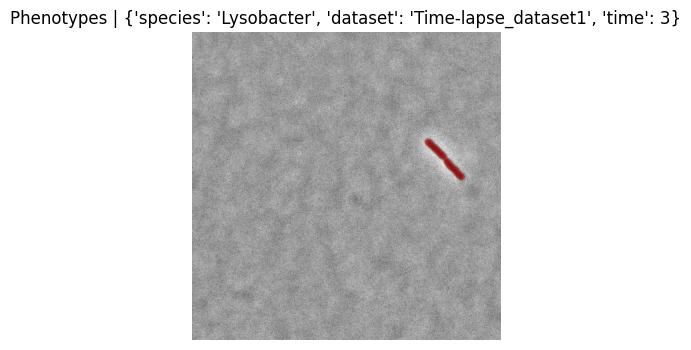

In [102]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def predict_mask(ds_item, model, thresh=0.5):
    device = next(model.parameters()).device
    x = ds_item["input"].unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        logits = model(x)[0,0].detach().cpu().numpy()
    prob = 1/(1+np.exp(-logits))
    return (prob > thresh)

# pick a sample
item = ds[0]  # change index
pred = predict_mask(item, model_after, thresh=0.5)

# get a grayscale frame for display (uses your middle-frame channel)
x = item["input"].detach().cpu().numpy()
gray = (x[2] * 255).clip(0,255).astype(np.uint8)

# phenotype
thr = {
    "min_area": 300,
    "rod_aspect": 2.8,
    "rod_solidity": 0.85,
    "rod_min_area": 300,
    "rod_max_area": 50000,
    "elong_aspect": 5.0,
    "branch_score": 3.0,
    "cluster_area": 12000,
    "cluster_aspect": 2.0,
}
lab, class_map, feats = phenotype_objects(pred, thr=thr)

# overlay
vis = overlay_classes(gray, lab, class_map, alpha=0.45)

# counts
from collections import Counter
counts = Counter(class_map.values())
print("Counts:", dict(counts))

plt.figure(figsize=(10,4))
plt.imshow(vis[..., ::-1])  # BGR->RGB
plt.title(f"Phenotypes | {item['meta']}")
plt.axis("off")
plt.show()


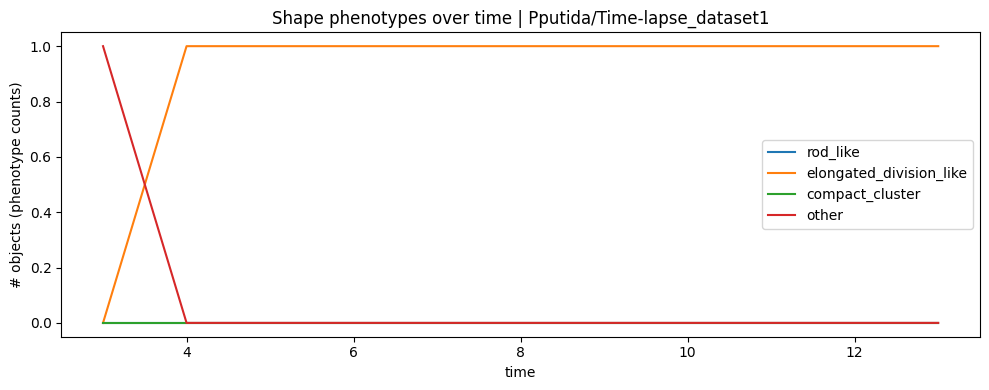

In [103]:
from collections import Counter
import matplotlib.pyplot as plt

def get_sequence_indices_from_ds(ds, species, dataset, position=None):
    seq = []
    for idx in range(len(ds)):
        m = ds[idx]["meta"]
        if m.get("species") != species:
            continue
        if m.get("dataset") != dataset:
            continue
        if position is not None and m.get("position") != position:
            continue
        seq.append((int(m.get("time")), idx))
    seq.sort(key=lambda x: x[0])
    return seq

def phenotype_time_series(ds, model, species, dataset, position=None, thresh=0.5, thr=None, max_frames=None):
    seq = get_sequence_indices_from_ds(ds, species, dataset, position)
    if max_frames: seq = seq[:max_frames]

    times = []
    series = {"rod_like": [], "elongated_division_like": [], "compact_cluster": [], "other": []}

    for t, idx in seq:
        item = ds[idx]
        pred = predict_mask(item, model, thresh=thresh)
        lab, class_map, feats = phenotype_objects(pred, thr=thr)
        counts = Counter(class_map.values())

        times.append(t)
        for k in series.keys():
            series[k].append(counts.get(k, 0))

    return np.array(times), {k: np.array(v) for k,v in series.items()}

# run
species = "Pputida"
dataset = "Time-lapse_dataset1"
times, series = phenotype_time_series(ds, model_after, species, dataset, thresh=0.5, thr=thr, max_frames=80)

plt.figure(figsize=(10,4))
for k, v in series.items():
    plt.plot(times, v, label=k)
plt.title(f"Shape phenotypes over time | {species}/{dataset}")
plt.xlabel("time")
plt.ylabel("# objects (phenotype counts)")
plt.legend()
plt.tight_layout()
plt.show()


In [105]:
import numpy as np
from skimage.measure import regionprops, label

def classify_phenotype(mask):
    lbl = label(mask)
    props = regionprops(lbl)

    if len(props) == 0:
        return "none"

    p = max(props, key=lambda x: x.area)

    aspect = p.major_axis_length / (p.minor_axis_length + 1e-6)

    if aspect > 3.0:
        return "elongated"
    elif aspect > 1.8:
        return "rod"
    elif p.area > 1500:
        return "compact"
    else:
        return "other"


In [106]:
import cv2

def overlay_mask(gray, mask, color):
    rgb = np.stack([gray]*3, axis=-1)
    overlay = rgb.copy()
    overlay[mask > 0] = color
    return cv2.addWeighted(rgb, 0.7, overlay, 0.3, 0)


In [107]:
import torch

def make_phenotype_video(
    ds,
    model,
    species_name,
    out_path="phenotype.mp4",
    thresh=0.5,
    fps=5
):
    model.eval()
    frames = []

    for item in ds:
        if item["meta"]["species"] != species_name:
            continue

        x = item["input"].unsqueeze(0).to(device)

        with torch.no_grad():
            logits = model(x)
            prob = torch.sigmoid(logits)[0,0].cpu().numpy()

        pred = (prob > thresh).astype(np.uint8)

        img = item["input"][2].cpu().numpy()
        img = (img - img.min()) / (img.max() - img.min() + 1e-6)

        phenotype = classify_phenotype(pred)

        color_map = {
            "rod": (0,255,0),
            "elongated": (255,165,0),
            "compact": (255,0,0),
            "other": (200,200,200),
            "none": (0,0,0)
        }

        vis = overlay_mask(img, pred, color_map[phenotype])

        label_txt = f"{species_name} | t={item['meta']['time']} | {phenotype}"
        cv2.putText(vis, label_txt, (10,25),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6,
                    (255,255,255), 2)

        frames.append((vis*255).astype(np.uint8))

    h, w, _ = frames[0].shape
    writer = cv2.VideoWriter(
        out_path,
        cv2.VideoWriter_fourcc(*"mp4v"),
        fps,
        (w,h)
    )

    for f in frames:
        writer.write(f)

    writer.release()
    print("✅ Saved:", out_path)


In [108]:
make_phenotype_video(
    ds,
    model,
    species_name="Pputida",
    out_path="Pputida_phenotypes.mp4"
)


✅ Saved: Pputida_phenotypes.mp4


In [109]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from skimage.measure import label, regionprops

def phenotype_debug(mask):
    lbl = label(mask)
    props = regionprops(lbl)
    if len(props) == 0:
        return {"phenotype":"none", "area":0, "aspect":0}

    p = max(props, key=lambda x: x.area)
    aspect = p.major_axis_length / (p.minor_axis_length + 1e-6)
    area = p.area

    if aspect > 3.0:
        ph = "elongated"
    elif aspect > 1.8:
        ph = "rod"
    elif area > 1500:
        ph = "compact"
    else:
        ph = "other"

    return {"phenotype": ph, "area": area, "aspect": aspect}

def show_framewise(ds, model, species, dataset, n=10, thresh=0.5):
    model.eval()
    shown = 0

    for item in ds:
        m = item["meta"]
        if m["species"] != species:
            continue
        if m["dataset"] != dataset:
            continue

        x = item["input"].unsqueeze(0).to(device)
        with torch.no_grad():
            logits = model(x)
            prob = torch.sigmoid(logits)[0,0].cpu().numpy()

        pred = (prob > thresh).astype(np.uint8)

        # show center frame
        img = item["input"][2].cpu().numpy()
        img = (img - img.min()) / (img.max() - img.min() + 1e-6)

        dbg = phenotype_debug(pred)

        plt.figure(figsize=(10,3))
        plt.subplot(1,3,1)
        plt.imshow(img, cmap="gray"); plt.axis("off")
        plt.title(f"Original | t={m['time']}")

        plt.subplot(1,3,2)
        plt.imshow(img, cmap="gray")
        plt.imshow(pred, alpha=0.35)
        plt.axis("off")
        plt.title("Pred overlay")

        plt.subplot(1,3,3)
        plt.imshow(pred, cmap="gray"); plt.axis("off")
        plt.title(f"{dbg['phenotype']}\narea={dbg['area']} aspect={dbg['aspect']:.2f}")

        plt.tight_layout()
        plt.show()

        shown += 1
        if shown >= n:
            break


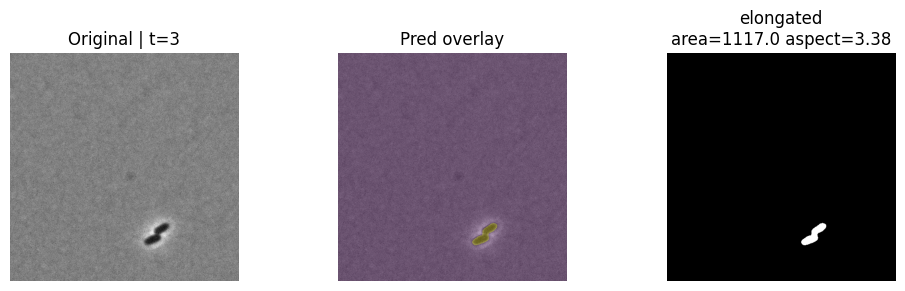

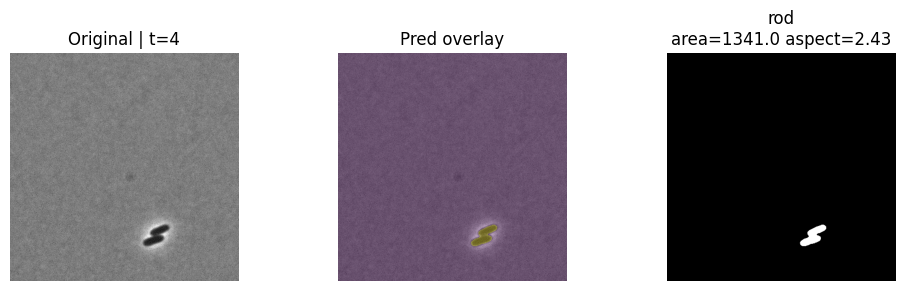

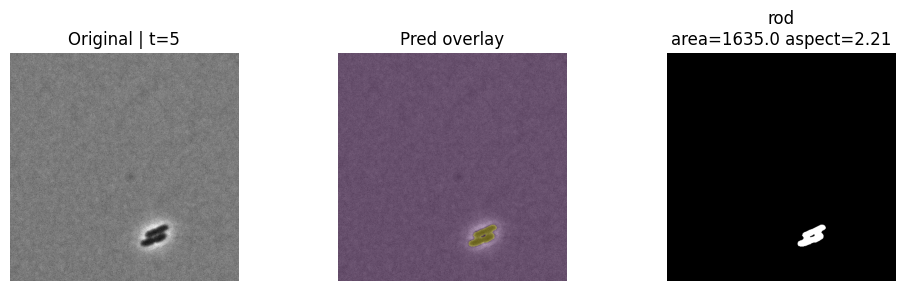

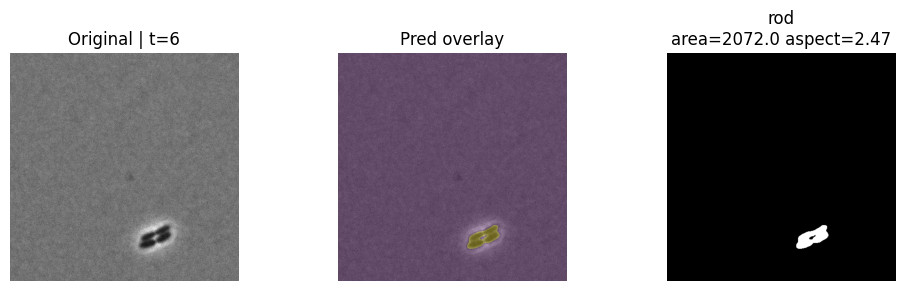

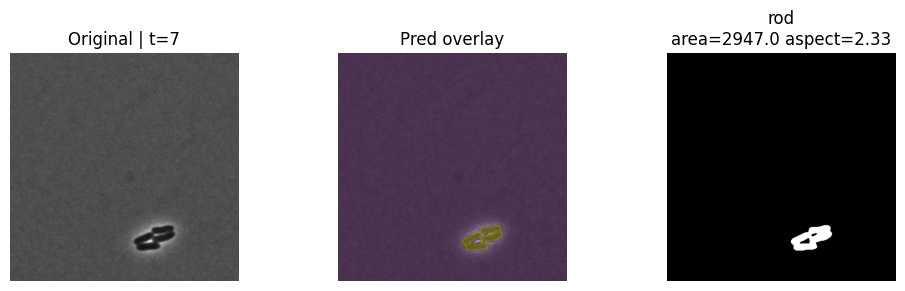

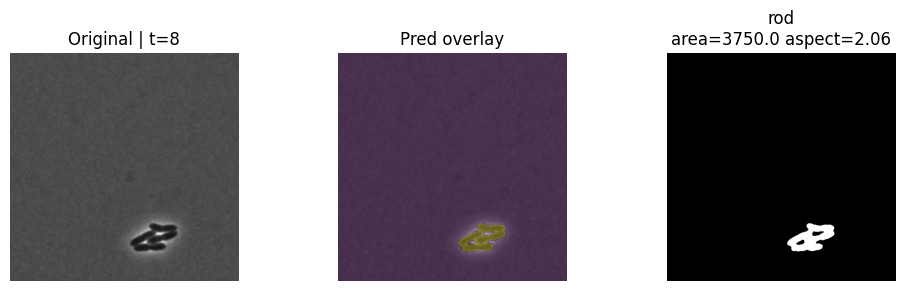

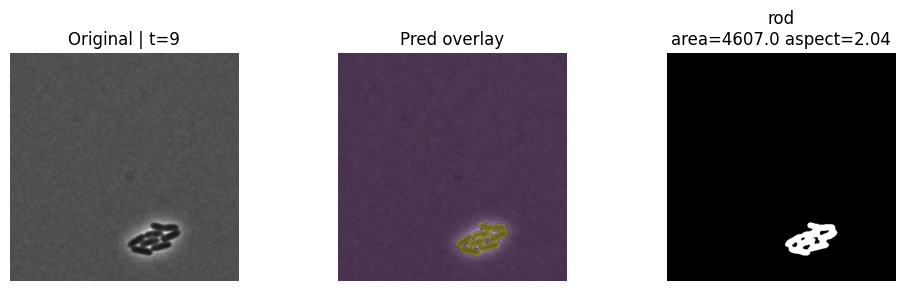

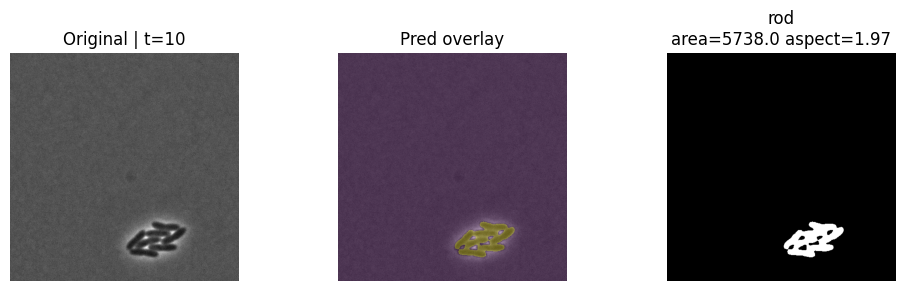

In [110]:
show_framewise(ds, model, species="Pputida", dataset="Time-lapse_dataset1", n=8, thresh=0.5)


In [1]:

import torch
import torch.nn as nn
import torch.nn.functional as F


In [ ]:
ckpt_path = "/content/drive/MyDrive/TC_model/temporal_unet_tc.pt"

state = torch.load(ckpt_path, map_location="cpu")
model_tc.load_state_dict(state)
model_tc.eval()


In [5]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1) build model with SAME hyperparams as training
model_tc = UNetTemporalFlow(in_channels=13, window_size=5, num_classes=1, base_ch=32).to(device)

# 2) load checkpoint from Drive
ckpt_path = "/content/drive/MyDrive/TC_model/temporal_unet_tc.pt"  # change this

ckpt = torch.load(ckpt_path, map_location=device)

# 3) handle different save formats
if isinstance(ckpt, dict) and "model_state" in ckpt:
    state_dict = ckpt["model_state"]
elif isinstance(ckpt, dict) and "state_dict" in ckpt:
    state_dict = ckpt["state_dict"]
elif isinstance(ckpt, dict) and any(k.startswith("enc1.") or k.startswith("module.") for k in ckpt.keys()):
    state_dict = ckpt
else:
    state_dict = ckpt  # fallback: sometimes torch.save(model.state_dict())

# 4) remove "module." if saved with DataParallel
state_dict = {k.replace("module.", ""): v for k, v in state_dict.items()}

missing, unexpected = model_tc.load_state_dict(state_dict, strict=False)
print("✅ Loaded. Missing:", len(missing), "Unexpected:", len(unexpected))

model_tc.eval()


TypeError: UNetTemporalFlow.__init__() got an unexpected keyword argument 'in_channels'